In [3]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import argparse
import pandas as pd
import numpy as np
import importlib
import matplotlib.colors as mcolors
import sys
sys.path.insert(0, "/scratch/gpfs/HASSON/gidon/247-plotting/scripts")
import tfsplt_future_past_utils as pu

In [4]:
# define parameters
class Args(argparse.Namespace):

    rois = ["IFG","MTG", "STG","preCG","postCG", "rostralmiddlefrontal",
        "superiorfrontal", "supramarginal", "ITG", "TP", "fusiform", "All"]
    # rois = ["IFG","STG","preCG","postCG","TP","dSM","mSM","vSM", "All"]    
    
    # NOTE: lines must match the label3 values in the data (standardized without _banded_ prefix)
    lines = ["joint", "word", "sentence", "sentence2"] # line id
    colors = ["gold", "#c2005c", "#ffd700", "orange", "lightgrey", "grey"]
    # titles = ["Original", "Paraphrase", "Random content words", "Double rephrase", "Arbitrary", "Shuffled"]
    # colors = plt.rcParams['axes.prop_cycle'].by_key()['color']
    # colors = ["black", "lightskyblue", "limegreen", "royalblue", "teal", "lightgrey"]
    # colors = ["black", "limegreen", "royalblue", "teal", "lightgrey"]
    legends = ["joint", "word", "future", "past"]

    lags = {
            "lags_all": np.arange(-2000, 2001, 50),
            "lags_plt": np.arange(-2000, 2001, 50), # selected subset
            "lag_ticks": np.arange(-2000, 2001, 500), # this and next one need to have same number of elements
            "lag_tick_labels": np.arange(-2, 2.001, 0.5), # this and previous one need to have same number of elements
        }
    res_dir = '/scratch/gpfs/gidon/247-plotting/results/figures'
args = Args()

### Original Mistral word embeddings

In [5]:
all_elecs = pd.read_csv("/scratch/gpfs/HASSON/kw1166/247/247-plotting/data/plotting/paper-sts/base_df.csv")
thresh_single = None 
res_d = "/scratch/gpfs/HASSON/gidon/247-encoding-dev/results/tfs"
res_d_itamar = "/scratch/gpfs/HASSON/ij9216/projects/code/247/247-encoding-dev/results/tfs"

# For plotting, we want to align all results to the same lag window (ms).
# This avoids fragile iloc-based indexing when different result files have different lag grids.
LAG_MIN, LAG_MAX = -2000, 2000

# Pick up any edits to the utils module without restarting the kernel.
importlib.reload(pu)

# Original sentences 
original8_c = pu.load_res_add_roi_threshold(f"{res_d}/gp-tfs-%s-mistral-bandedRidge-lag60-50-all-static_future_past-original_pca300_drop-short_mistral_original_word_trained_sentence_cnxt_0008_comp.csv", thresh_single)
original8_p = pu.load_res_add_roi_threshold(f"{res_d}/gp-tfs-%s-mistral-bandedRidge-lag60-50-all-static_future_past-original_pca300_drop-short_mistral_original_word_trained_sentence_cnxt_0008_prod.csv", thresh_single)
print(f"Loaded original sentences: {len(original8_c)} comprehension, {len(original8_p)} production electrodes")
original8_c = pu.select_lag_range_and_last_columns(original8_c, LAG_MIN, LAG_MAX)
original8_p = pu.select_lag_range_and_last_columns(original8_p, LAG_MIN, LAG_MAX)
original8_c['label3'] = original8_c['label3'].str.replace('_banded_', '', regex=False)
original8_p['label3'] = original8_p['label3'].str.replace('_banded_', '', regex=False)

# Random content word 
random_content_word8_c = pu.load_res_add_roi_threshold(f"{res_d}/gp-tfs-%s-mistral-bandedRidge-lag60-50-all-static_future_past-random_content_words_pca300_drop-short_mistral_original_word_trained_rephrased_sentence_cnxt_0008_comp.csv", thresh_single)
random_content_word8_p = pu.load_res_add_roi_threshold(f"{res_d}/gp-tfs-%s-mistral-bandedRidge-lag60-50-all-static_future_past-random_content_words_pca300_drop-short_mistral_original_word_trained_rephrased_sentence_cnxt_0008_prod.csv", thresh_single)
print(f"Loaded random content word sentences: {len(random_content_word8_c)} comprehension, {len(random_content_word8_p)} production electrodes")
random_content_word8_c = pu.select_lag_range_and_last_columns(random_content_word8_c, LAG_MIN, LAG_MAX)
random_content_word8_p = pu.select_lag_range_and_last_columns(random_content_word8_p, LAG_MIN, LAG_MAX)
random_content_word8_c['label3'] = random_content_word8_c['label3'].str.replace('_banded_', '', regex=False)
random_content_word8_p['label3'] = random_content_word8_p['label3'].str.replace('_banded_', '', regex=False)

# Paraphrase 
paraphrase8_c = pu.load_res_add_roi_threshold(f"{res_d}/gp-tfs-%s-mistral-bandedRidge-lag60-50-all-static_future_past-paraphrase_pca300_drop-short_mistral_original_word_trained_rephrased_sentence_cnxt_0008_comp.csv", thresh_single)
paraphrase8_p = pu.load_res_add_roi_threshold(f"{res_d}/gp-tfs-%s-mistral-bandedRidge-lag60-50-all-static_future_past-paraphrase_pca300_drop-short_mistral_original_word_trained_rephrased_sentence_cnxt_0008_prod.csv", thresh_single)
print(f"Loaded paraphrase sentences: {len(paraphrase8_c)} comprehension, {len(paraphrase8_p)} production electrodes")
paraphrase8_c = pu.select_lag_range_and_last_columns(paraphrase8_c, LAG_MIN, LAG_MAX)
paraphrase8_p = pu.select_lag_range_and_last_columns(paraphrase8_p, LAG_MIN, LAG_MAX)
paraphrase8_c['label3'] = paraphrase8_c['label3'].str.replace('_banded_', '', regex=False)
paraphrase8_p['label3'] = paraphrase8_p['label3'].str.replace('_banded_', '', regex=False)

# Double rephrase 
parandom8_c = pu.load_res_add_roi_threshold(f"{res_d}/gp-tfs-%s-mistral-bandedRidge-lag60-50-all-static_future_past-paraphrase_rephrased_random_content_words_pca300_drop-short_mistral_original_word_trained_rephrased_sentence_cnxt_0008_comp.csv", thresh_single)
parandom8_p = pu.load_res_add_roi_threshold(f"{res_d}/gp-tfs-%s-mistral-bandedRidge-lag60-50-all-static_future_past-paraphrase_rephrased_random_content_words_pca300_drop-short_mistral_original_word_trained_rephrased_sentence_cnxt_0008_prod.csv", thresh_single)
print(f"Loaded paraphrase rephrased random content sentences: {len(parandom8_c)} comprehension, {len(parandom8_p)} production electrodes")
parandom8_c = pu.select_lag_range_and_last_columns(parandom8_c, LAG_MIN, LAG_MAX)
parandom8_p = pu.select_lag_range_and_last_columns(parandom8_p, LAG_MIN, LAG_MAX)
parandom8_c['label3'] = parandom8_c['label3'].str.replace('_banded_', '', regex=False)
parandom8_p['label3'] = parandom8_p['label3'].str.replace('_banded_', '', regex=False)

# Synonym 
synonym8_c = pu.load_res_add_roi_threshold(f"{res_d}/gp-tfs-%s-mistral-bandedRidge-lag60-50-all-static_future_past-synonym_pca300_drop-short_mistral_original_word_trained_rephrased_sentence_cnxt_0008_comp.csv", thresh_single)
synonym8_p = pu.load_res_add_roi_threshold(f"{res_d}/gp-tfs-%s-mistral-bandedRidge-lag60-50-all-static_future_past-synonym_pca300_drop-short_mistral_original_word_trained_rephrased_sentence_cnxt_0008_prod.csv", thresh_single)
print(f"Loaded synonym sentences: {len(synonym8_c)} comprehension, {len(synonym8_p)} production electrodes")
synonym8_c = pu.select_lag_range_and_last_columns(synonym8_c, LAG_MIN, LAG_MAX)
synonym8_p = pu.select_lag_range_and_last_columns(synonym8_p, LAG_MIN, LAG_MAX)
synonym8_c['label3'] = synonym8_c['label3'].str.replace('_banded_', '', regex=False)
synonym8_p['label3'] = synonym8_p['label3'].str.replace('_banded_', '', regex=False)

# Original sentences, untrained model 
untr_orig_c8 = pu.load_res_add_roi_threshold(f"{res_d}/gp-tfs-%s-mistral-bandedRidge-lag60-50-all-static_future_past-original_pca300_drop-short_mistral_WORD_untrained_sentence_cnxt_0008_comp.csv", thresh_single)
untr_orig_p8 = pu.load_res_add_roi_threshold(f"{res_d}/gp-tfs-%s-mistral-bandedRidge-lag60-50-all-static_future_past-original_pca300_drop-short_mistral_WORD_untrained_sentence_cnxt_0008_prod.csv", thresh_single)
print(f"Loaded untrained, randomly rephrased sentences: {len(untr_orig_c8)} comprehension, {len(untr_orig_p8)} production electrodes")
untr_orig_c8 = pu.select_lag_range_and_last_columns(untr_orig_c8, LAG_MIN, LAG_MAX)
untr_orig_p8 = pu.select_lag_range_and_last_columns(untr_orig_p8, LAG_MIN, LAG_MAX)
untr_orig_c8['label3'] = untr_orig_c8['label3'].str.replace('_banded_', '', regex=False)
untr_orig_p8['label3'] = untr_orig_p8['label3'].str.replace('_banded_', '', regex=False)

# Shuffled sentences from path Itamar
shuffled_c8 = pu.load_res_add_roi_threshold(f"{res_d_itamar}/ij-tfs-%s-gpt2-xl-bandedRidge-lag120k-50-all-static_future_past-shuffled_drop-short_mistral_comp.csv", thresh_single)
shuffled_p8 = pu.load_res_add_roi_threshold(f"{res_d_itamar}/ij-tfs-%s-gpt2-xl-bandedRidge-lag120k-50-all-static_future_past-shuffled_drop-short_mistral_prod.csv", thresh_single)
print(f"Loaded shuffled sentences: {len(shuffled_c8)} comprehension, {len(shuffled_p8)} production electrodes")


shuffled_c8 = pu.select_lag_range_and_last_columns(shuffled_c8, LAG_MIN, LAG_MAX)
shuffled_p8 = pu.select_lag_range_and_last_columns(shuffled_p8, LAG_MIN, LAG_MAX)
shuffled_c8['label3'] = shuffled_c8['label3'].str.replace('_banded_', '', regex=False)
shuffled_p8['label3'] = shuffled_p8['label3'].str.replace('_banded_', '', regex=False)


# df_list_c = [original8_c, synonym8_c, paraphrase8_c, random_content_word8_c, parandom8_c, untr_orig_c8]
# df_list_p = [original8_p, synonym8_p, paraphrase8_p, random_content_word8_p, parandom8_p, untr_orig_p8]

# titles = ["Original", "Synonym", "Paraphrase", "Random content words", "Double rephrase", "Baseline"]
df_list_c = [original8_c, paraphrase8_c, random_content_word8_c, parandom8_c, untr_orig_c8, shuffled_c8]
df_list_p = [original8_p, paraphrase8_p, random_content_word8_p, parandom8_p, untr_orig_p8, shuffled_p8]

titles = ["Original", "Form", "Meaning", "Form + meaning", "Arbitrary", "Shuffled"]

shared_electrodes_c, filtered_dfs_c, roi_results_c = pu.process_shared_electrodes_roi(
    df_list_c,
    args.rois,
    OR_thresh=0.1
)
shared_electrodes_p, filtered_dfs_p, roi_results_p = pu.process_shared_electrodes_roi(
    df_list_p,
    args.rois,
    OR_thresh=0.1
)

print(len(shared_electrodes_c))
print(len(shared_electrodes_p))

Loaded original sentences: 2592 comprehension, 2592 production electrodes
Loaded random content word sentences: 2620 comprehension, 2620 production electrodes
Loaded paraphrase sentences: 2636 comprehension, 2640 production electrodes
Loaded paraphrase rephrased random content sentences: 2628 comprehension, 2628 production electrodes
Loaded synonym sentences: 2548 comprehension, 2552 production electrodes
Loaded untrained, randomly rephrased sentences: 2628 comprehension, 2628 production electrodes
Loaded shuffled sentences: 2636 comprehension, 2624 production electrodes
322
303


## Lineplots (irrelevant)

### Plots per rephrasing method

In [6]:
def plot_single_line_across_datasets(args, sig_results_dict, roi, line, mode="comp", ymax=0.18, save=False, titles=None):
    """
    Plot a single line (e.g., 'joint', 'word', etc.) across multiple datasets side-by-side.
    Each dataset is shown in a different color.
    
    Parameters:
    -----------
    args : Args object
        Contains configuration parameters
    sig_results_dict : dict
        Dictionary keyed by (i, line, roi) containing DataFrames
    roi : str
        ROI name to plot
    line : str
        Specific line to plot (e.g., 'joint', 'word', 'sentence', 'sentence2')
    mode : str
        "comp" or "prod"
    ymax : float
        Maximum y-axis value
    save : bool
        Whether to save the figure
    titles : list of str, optional
        Custom titles for each dataset. If None, uses generic titles.
    """
    # Determine number of datasets from keys
    dataset_indices = sorted(set(key[0] for key in sig_results_dict.keys()))
    n_datasets = len(dataset_indices)
    
    if titles is None:
        titles = [f"Dataset {i+1}" for i in range(n_datasets)]
    
    # Create single axis
    fig, ax = plt.subplots(1, 1, figsize=(10, 6))
    
    # Get base color for this line
    line_idx = args.lines.index(line) if line in args.lines else 0
    
    # Create distinct colors for datasets using a color palette
    import seaborn as sns
    if n_datasets <= 10:
        dataset_colors = sns.color_palette("husl", n_datasets)
    else:
        dataset_colors = sns.color_palette("tab20", n_datasets)
    
    # Plot each dataset with different color
    for i, dataset_idx in enumerate(dataset_indices):
        color = dataset_colors[i]
        
        key = (dataset_idx, line, roi)
        
        if key not in sig_results_dict or sig_results_dict[key].empty:
            continue
        
        df_line = sig_results_dict[key]
        
        # Count electrodes
        n_elecs = len(df_line)
        label = f"{titles[i]} (n={n_elecs})"
        
        # Plot line with distinct colors
        lags_selected = [lag_idx for lag_idx, lag in enumerate(args.lags["lags_all"]) 
                        if lag in args.lags["lags_plt"]]
        vals = df_line.iloc[:, lags_selected].mean(axis=0)
        errs = df_line.iloc[:, lags_selected].sem(axis=0)
        
        ax.plot(
            args.lags["lags_plt"],
            vals,
            color=color,
            label=label,
            lw=2.5,
        )
        ax.fill_between(
            args.lags["lags_plt"],
            vals - errs,
            vals + errs,
            alpha=0.2,
            color=color,
        )
    
    # Ax cosmetics
    if ymax is not None:
        ax.set_ylim(top=ymax, bottom=-0.025)
    ymin, ymax_val = ax.get_ylim()
    
    # Shade time window
    if mode == "comp":
        rect1 = patches.Rectangle((50, ymin), 450, ymax_val - ymin, 
                                  color="yellowgreen", alpha=0.3, label="_nolegend_")
    elif mode == "prod":
        rect1 = patches.Rectangle((-500, ymin), 450, ymax_val - ymin, 
                                  color="indianred", alpha=0.3, label="_nolegend_")
    ax.add_patch(rect1)
    
    ax.axhline(0, ls="dashed", alpha=0.3, c="k")
    ax.axvline(0, ls="dashed", alpha=0.3, c="k")
    ax.set_xticks(args.lags["lag_ticks"])
    ax.set_xticklabels(args.lags["lag_tick_labels"])
    ax.set_xlabel("time wrt. word-onset (s)")
    ax.set_ylabel("Pearson's r")
    ax.tick_params(axis='both', which='both', labelsize=10)
    ax.legend(loc="best", frameon=False, fontsize=10)
    
    mode_full = "Comprehension" if mode == "comp" else "Production"
    ax.set_title(f"{mode_full} - {roi} - {args.legends[line_idx]}", fontsize=12)
    
    plt.tight_layout()
    if save:
        plt.savefig(f"{args.res_dir}/{roi}_{line}_overlay_{mode}.jpeg")
        plt.close(fig)
    else:
        plt.show()


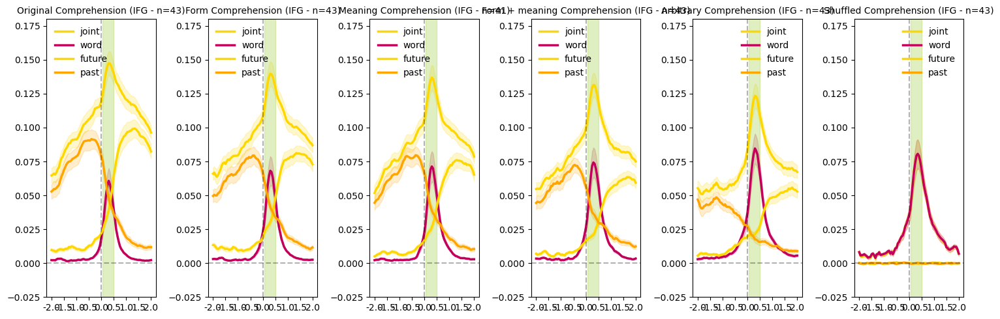

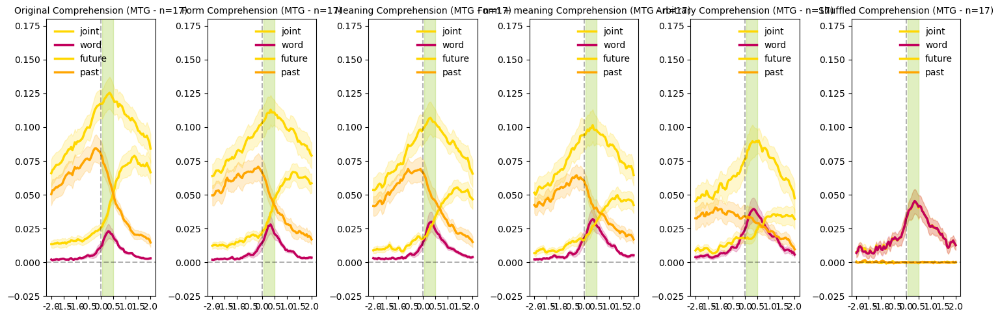

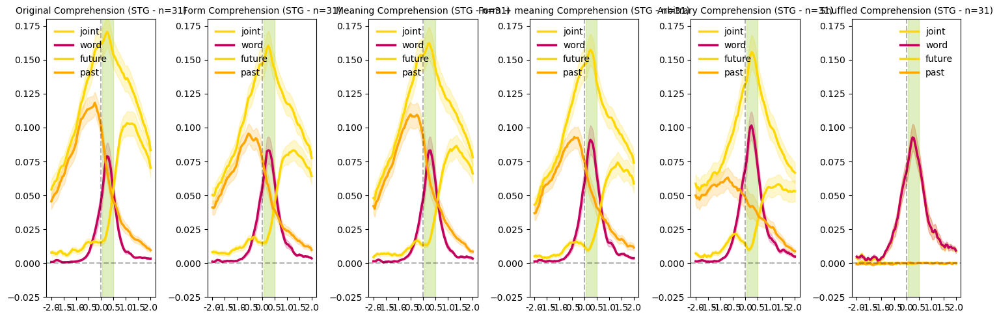

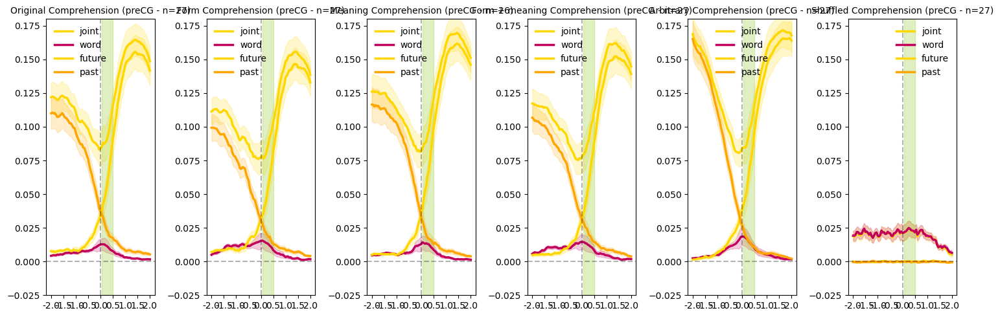

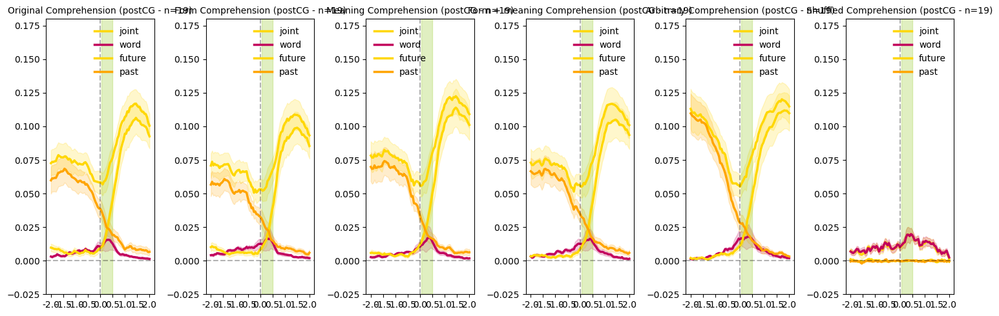

...

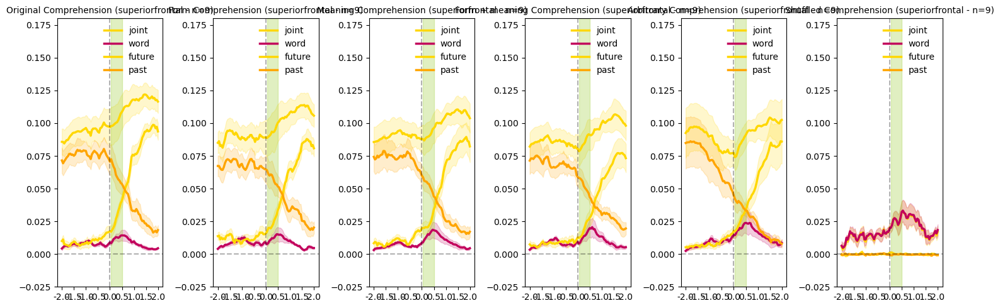

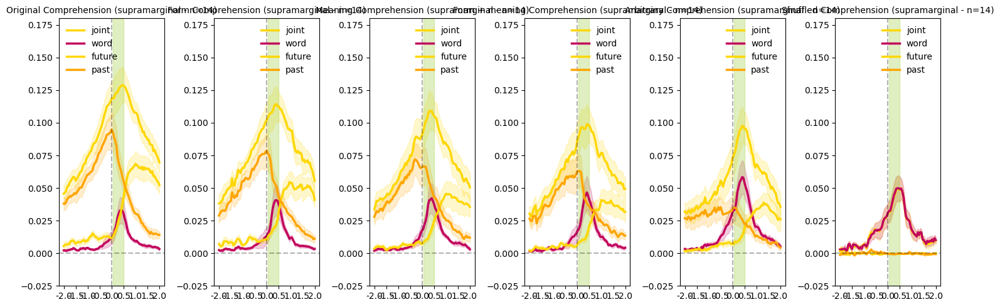

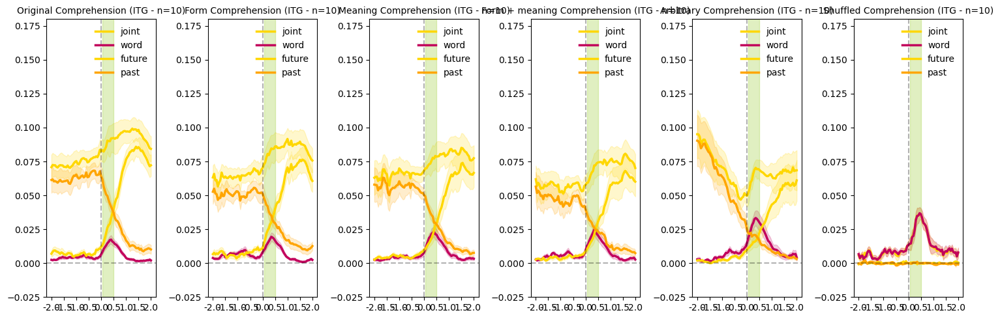

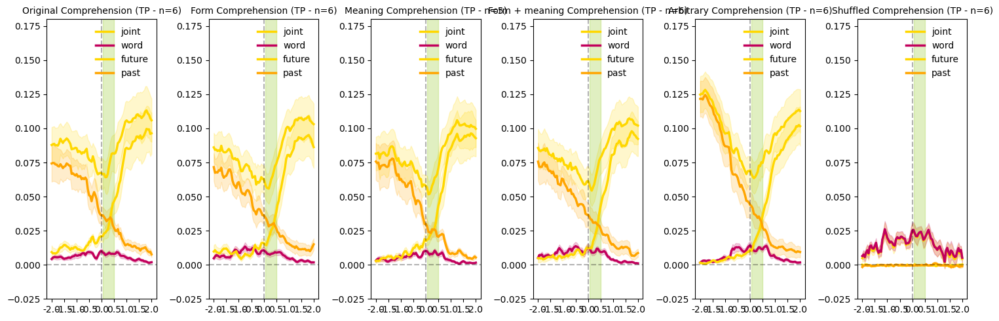

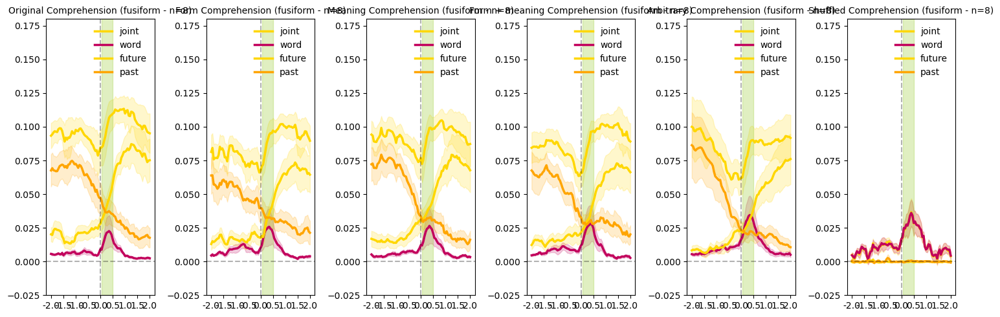

In [7]:
# Process and plot for comprehension (c) DataFrames
rois_to_plot_c = []
for roi in args.rois:
    key = (0, 'joint', roi)
    df = roi_results_c.get(key)
    if df is not None and df.shape[0] > 2:
        rois_to_plot_c.append(roi)

# TODO FIX all of this 
for roi in rois_to_plot_c:
    # Count electrodes in all comprehension datasets for this ROI
    # TODO fix this
    n_elecs_c = next(
    (len(df) for key, df in roi_results_c.items() 
     if key[2] == roi and isinstance(df, pd.DataFrame) and not df.empty), 
    0
    )
    
    if n_elecs_c < 3:
        continue
    # TODO - is it supposed to get dfs or dict? look at orig func in podcast
    pu.plot_single_roi_side_by_side(
        args, 
        roi_results_c, 
        roi, 
        mode="comp", 
        ymax=0.18, 
        save=False, 
        titles=titles
    )

#### Production

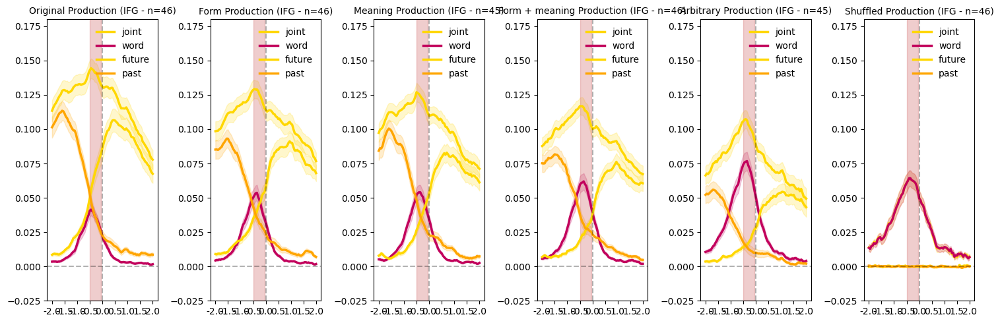

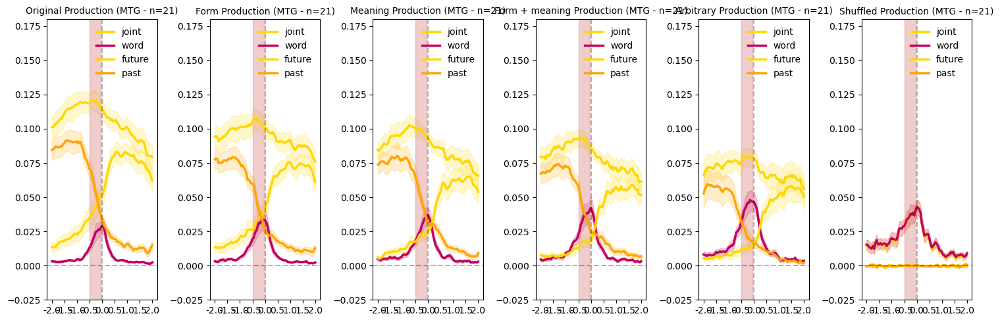

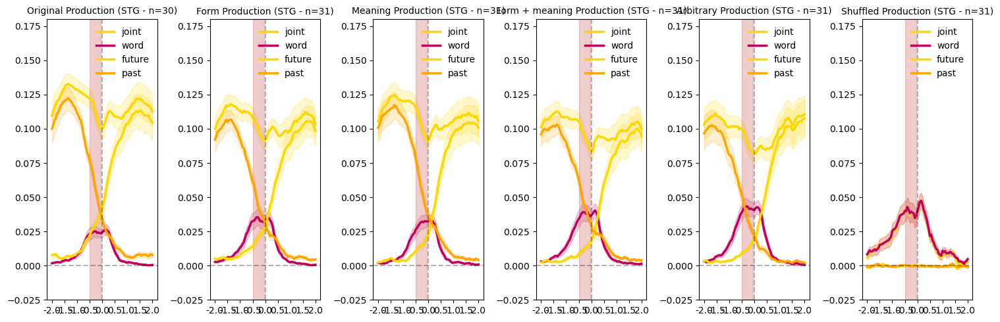

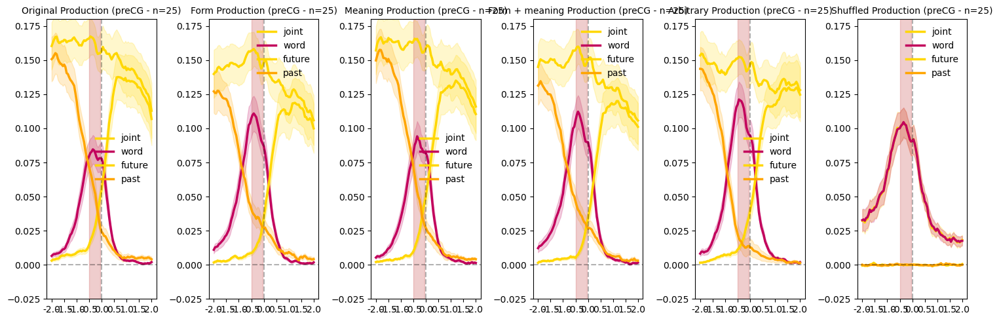

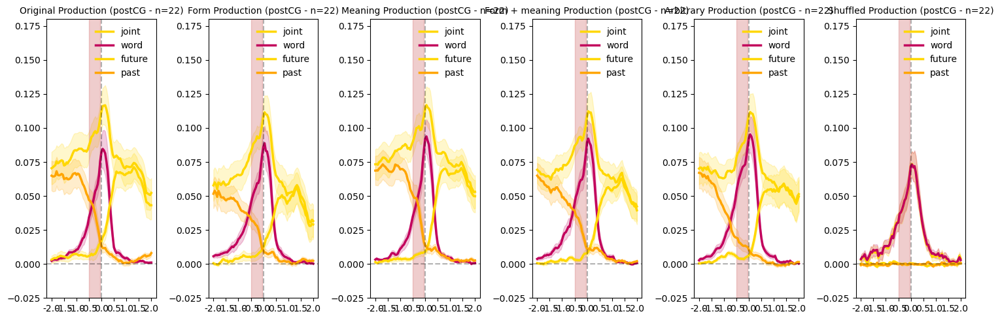

...

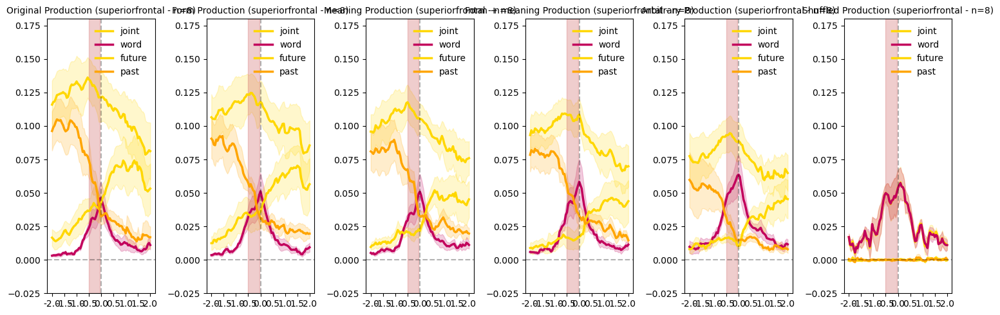

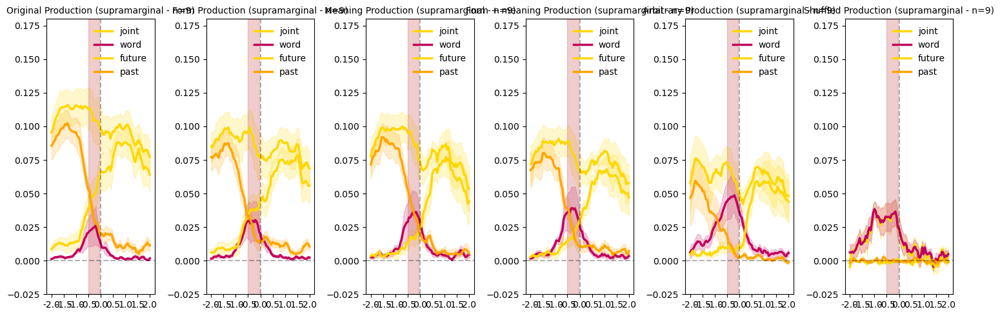

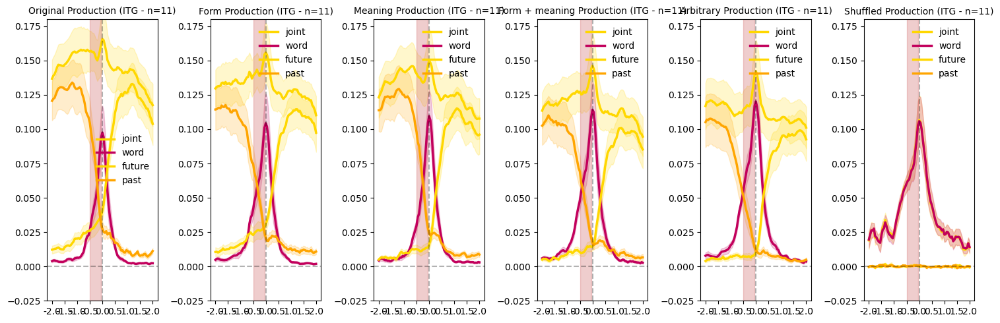

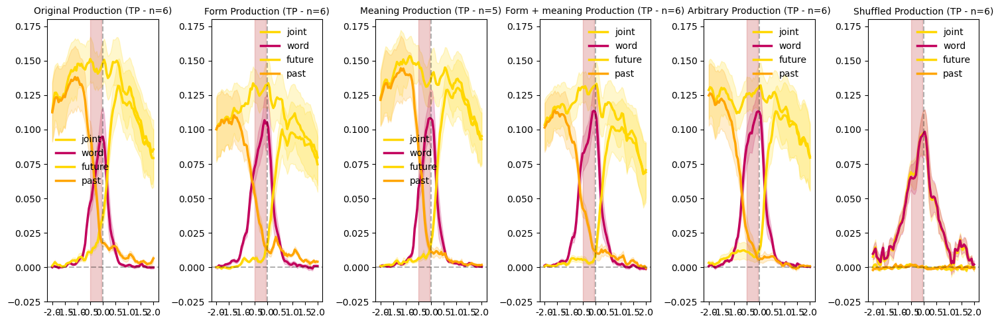

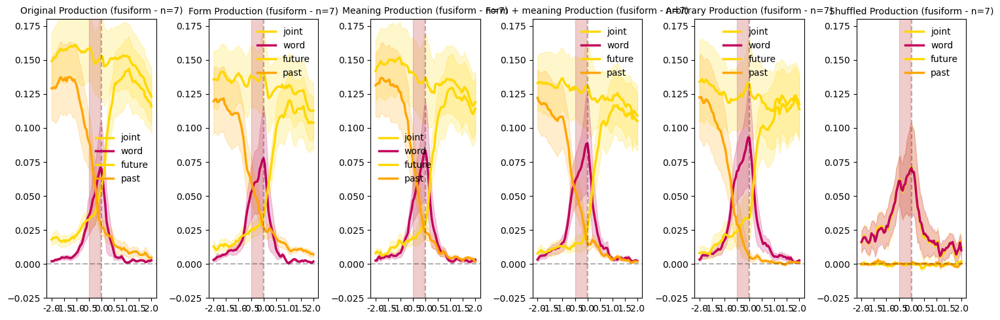

In [8]:
# Process and plot for comprehension (c) DataFrames
rois_to_plot_p = []
for roi in args.rois:
    key = (0, 'joint', roi)
    df = roi_results_p.get(key)
    if df is not None and df.shape[0] > 2:
        rois_to_plot_p.append(roi)

# TODO FIX all of this 
for roi in rois_to_plot_p:
    # Count electrodes in all comprehension datasets for this ROI
    # TODO fix this
    n_elecs_c = next(
    (len(df) for key, df in roi_results_p.items() 
     if key[2] == roi and isinstance(df, pd.DataFrame) and not df.empty), 
    0
    )
    
    if n_elecs_c < 3:
        continue
    # TODO - is it supposed to get dfs or dict? look at orig func in podcast
    pu.plot_single_roi_side_by_side(
        args, 
        roi_results_p, 
        roi, 
        mode="prod", 
        ymax=0.18, 
        save=False, 
        titles=titles
    )

### Lineplots per ROI

In [9]:
def plot_all_lines_across_datasets(args, sig_results_dict, roi, mode="comp", ymax=0.18, plot_only_joint=False, plot_bands=True, save=False, titles=None):
    """
    Plot all lines (joint, word, sentence, sentence2) across multiple datasets in a row of subplots.
    Each subplot shows one line type with different datasets in different colors.
    
    Parameters:
    -----------
    args : Args object
        Contains configuration parameters
    sig_results_dict : dict
        Dictionary keyed by (i, line, roi) containing DataFrames
    roi : str
        ROI name to plot
    mode : str
        "comp" or "prod"
    ymax : float
        Maximum y-axis value
    plot_only_joint : bool
        If True, only plot the joint line
    save : bool
        Whether to save the figure
    titles : list of str, optional
        Custom titles for each dataset. If None, uses generic titles.
    """
    # Determine number of datasets from keys
    dataset_indices = sorted(set(key[0] for key in sig_results_dict.keys()))
    n_datasets = len(dataset_indices)

    
    if titles is None:
        titles = [f"Dataset {i+1}" for i in range(n_datasets)]
    
    # Determine which lines to plot
    lines_to_plot = ["joint"] if plot_only_joint else args.lines
    n_lines = len(lines_to_plot)

    # Determine which lines to plot; sent = fut, sent2 = past
    if plot_bands and mode == "comp":
        lines_to_plot = ["sentence"]
    elif plot_bands and mode == "prod":
        lines_to_plot = ["sentence2"]
    else:
        args.lines 
    n_lines = len(lines_to_plot)
    
    # Create figure with appropriate number of subplots
    if n_lines == 1:
        fig, axes = plt.subplots(1, 1, figsize=(10, 5))
        axes = [axes]  # Wrap single axis in list for consistency
    else:
        fig, axes = plt.subplots(1, n_lines, figsize=(20, 5))
    
    # Use colors from args directly
    dataset_colors = [args.colors[i] for i in dataset_indices]
    
    # Plot each line type in its own subplot
    for subplot_idx, line in enumerate(lines_to_plot):
        ax = axes[subplot_idx]
        
        # Find the line index in args.lines for legend lookup
        line_idx = args.lines.index(line)
        
        # Plot each dataset with different color
        for i, dataset_idx in enumerate(dataset_indices):
            color = dataset_colors[i]
            
            key = (dataset_idx, line, roi)
            
            if key not in sig_results_dict or sig_results_dict[key].empty:
                continue
            
            df_line = sig_results_dict[key]
            
            # Count electrodes
            n_elecs = len(df_line)
            label = f"{titles[i]} (n={n_elecs})"
            
            # Plot line with distinct colors
            lags_selected = [lag_idx for lag_idx, lag in enumerate(args.lags["lags_all"]) 
                            if lag in args.lags["lags_plt"]]
            vals = df_line.iloc[:, lags_selected].mean(axis=0)
            errs = df_line.iloc[:, lags_selected].sem(axis=0)
            
            ax.plot(
                args.lags["lags_plt"],
                vals,
                color=color,
                label=label,
                lw=2.5,
            )
            ax.fill_between(
                args.lags["lags_plt"],
                vals - errs,
                vals + errs,
                alpha=0.2,
                color=color,
            )
        
        # Ax cosmetics
        if ymax is not None:
            ax.set_ylim(top=ymax, bottom=-0.025)
        ymin, ymax_val = ax.get_ylim()
        
        ax.axhline(0, ls="dashed", alpha=0.3, c="k")
        ax.axvline(0, ls="dashed", alpha=0.3, c="k")
        ax.set_xticks(args.lags["lag_ticks"])
        ax.set_xticklabels(args.lags["lag_tick_labels"])
        
        # Add x-axis label only to leftmost plot, y-axis label only to leftmost plot
        if subplot_idx == 0:
            ax.set_ylabel("Pearson's r")
        if subplot_idx == 0:
            ax.set_xlabel("time wrt. word-onset (s)")
        
        ax.tick_params(axis='both', which='both', labelsize=10)
        
        ax.legend(loc="best", frameon=False, fontsize=9)
        
        mode_full = "Comprehension" if mode == "comp" else "Production"
        if plot_only_joint:
            ax.set_title(f"{roi}", fontsize=12)
        else:
            ax.set_title(f"{args.legends[line_idx]}", fontsize=12)

        # Shade time window
        if mode == "comp":
            rect1 = patches.Rectangle((50, ymin), 450, ymax_val - ymin, 
                                      color="yellowgreen", alpha=0.3, label="_nolegend_")
        elif mode == "prod":
            rect1 = patches.Rectangle((-500, ymin), 450, ymax_val - ymin, 
                                      color="indianred", alpha=0.3, label="_nolegend_")
        ax.add_patch(rect1)
        
    
    # Add overall title
    mode_full = "Comprehension" if mode == "comp" else "Production"
    fig.suptitle(f"{roi}", fontsize=14, y=1.02)
    
    plt.tight_layout()
    if save:
        plt.savefig(f"{args.res_dir}/{roi}_all_lines_overlay_{mode}.jpeg", bbox_inches='tight')
        plt.close(fig)
    else:
        plt.show()

### Comprehension per brainregion

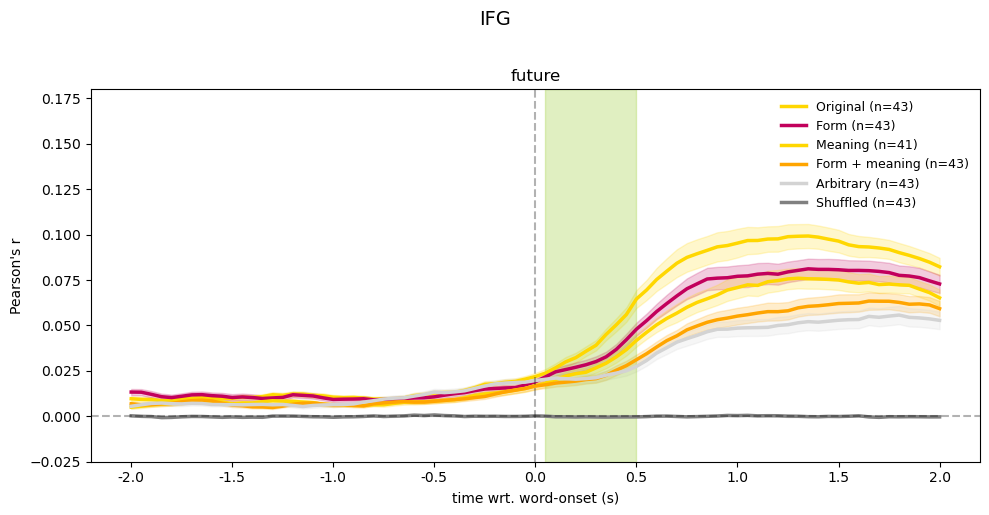

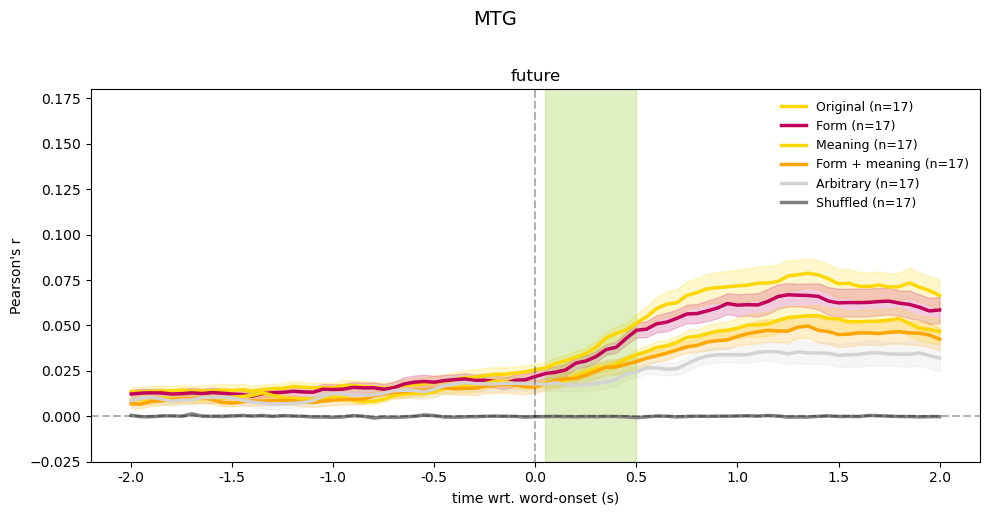

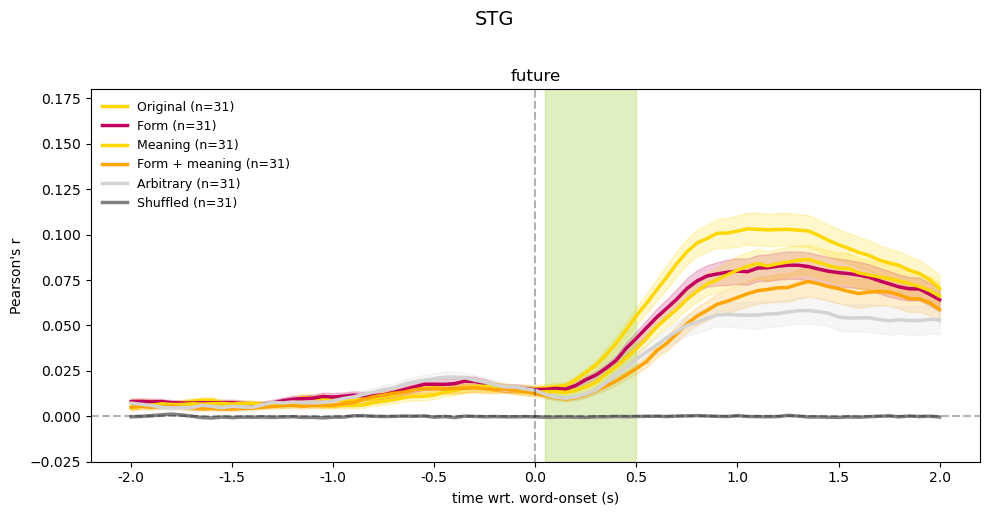

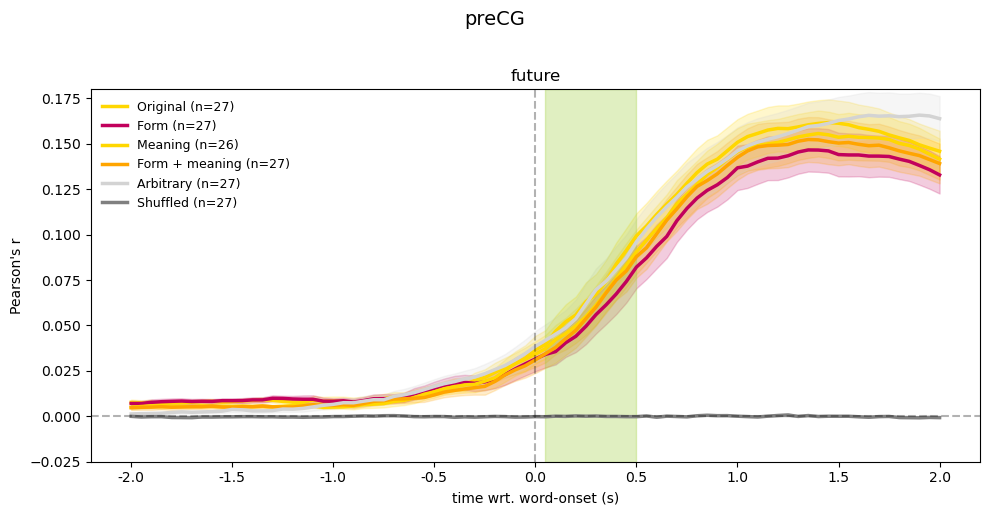

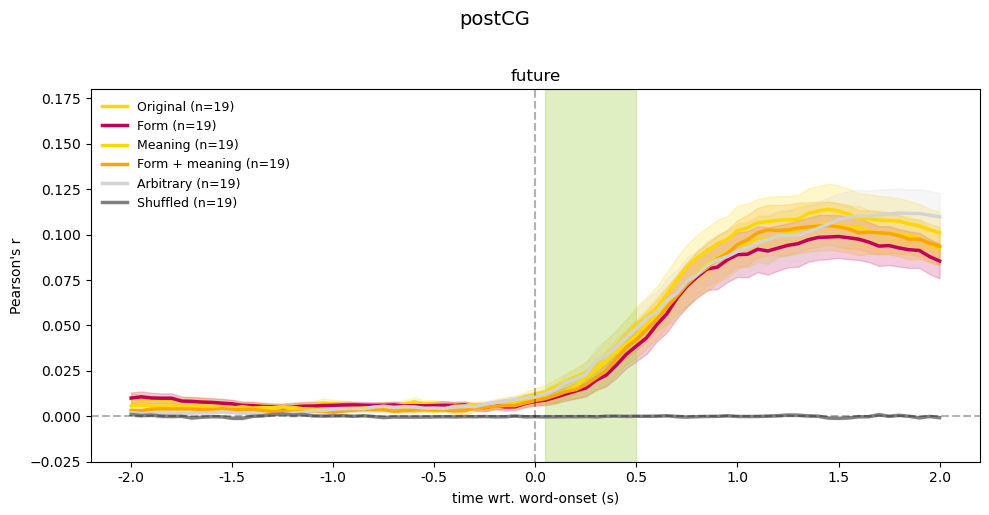

...

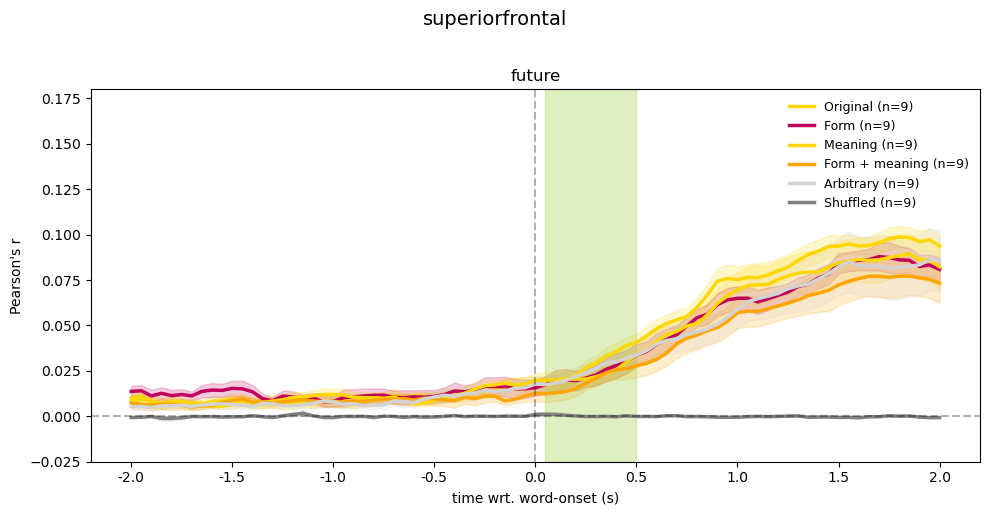

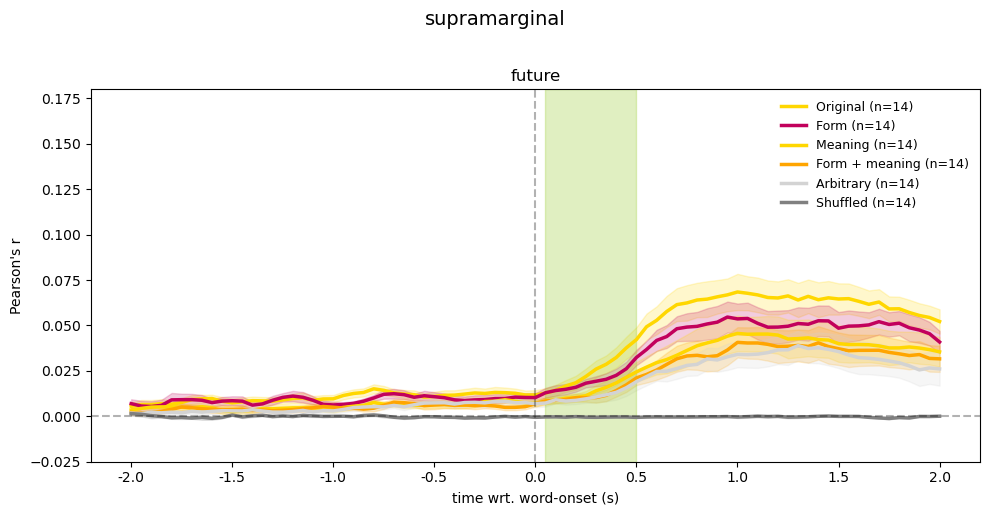

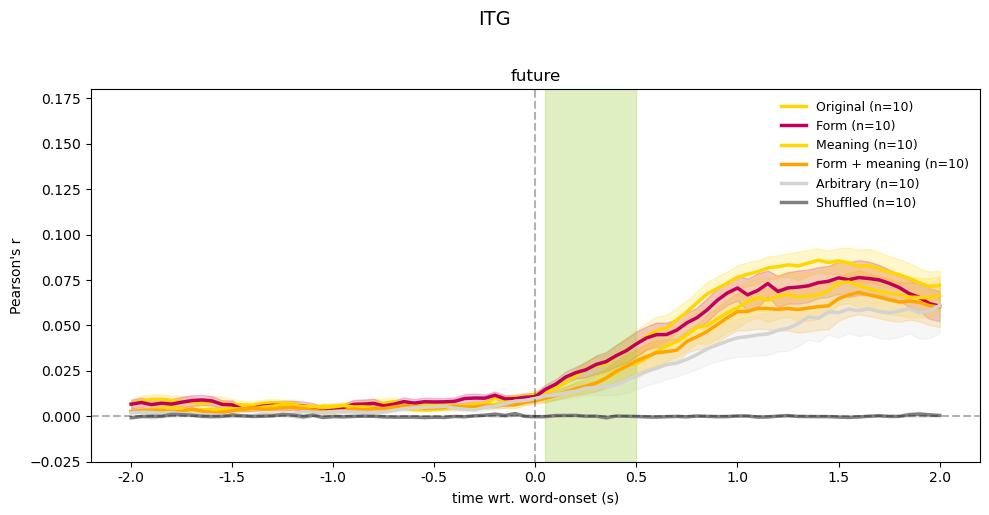

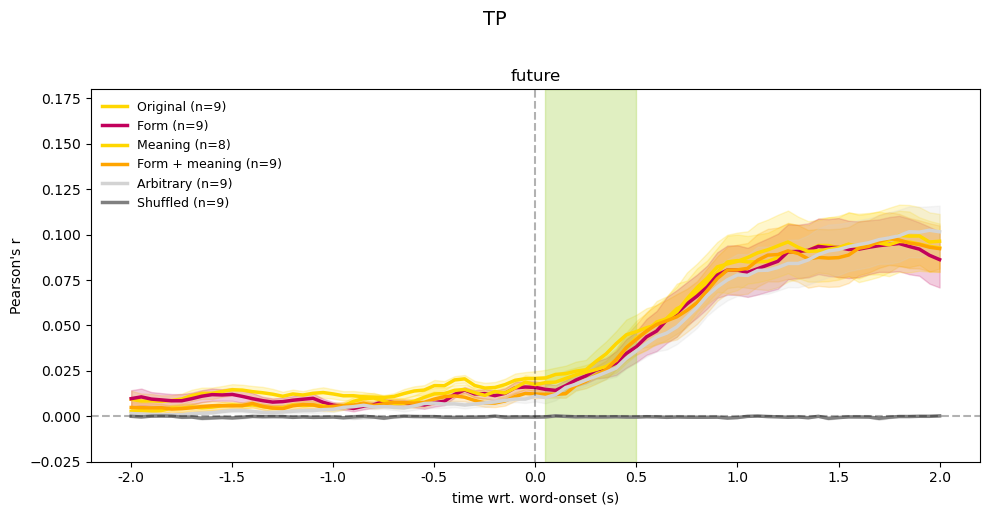

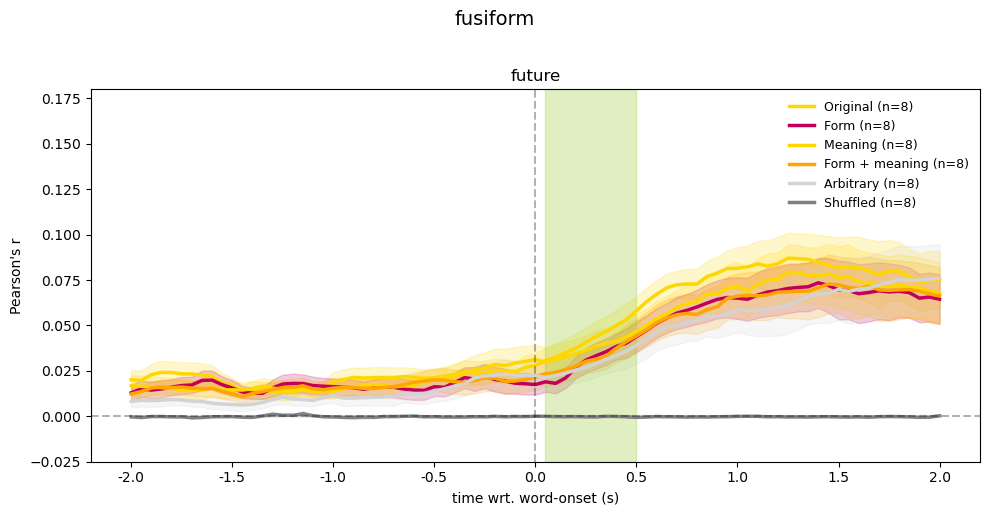

In [10]:
rois_to_plot_c = []
for roi in args.rois:
    key = (0, 'joint', roi)  # Standardized format without _banded_ prefix
    df = roi_results_c.get(key)
    if df is not None and df.shape[0] > 2:
        rois_to_plot_c.append(roi)

    # Count electrodes in all comprehension datasets for this ROI
for roi in rois_to_plot_c:
    n_elecs_c = next(
        (len(df) for key, df in roi_results_c.items() 
         if key[2] == roi and isinstance(df, pd.DataFrame) and not df.empty), 
        0
    )
    
    if n_elecs_c < 3:
        continue
    
    plot_all_lines_across_datasets(
        args, 
        roi_results_c, 
        roi, 
        mode="comp", 
        ymax=0.18, 
        save=False, 
        titles=titles
    )

### Production per brainregion

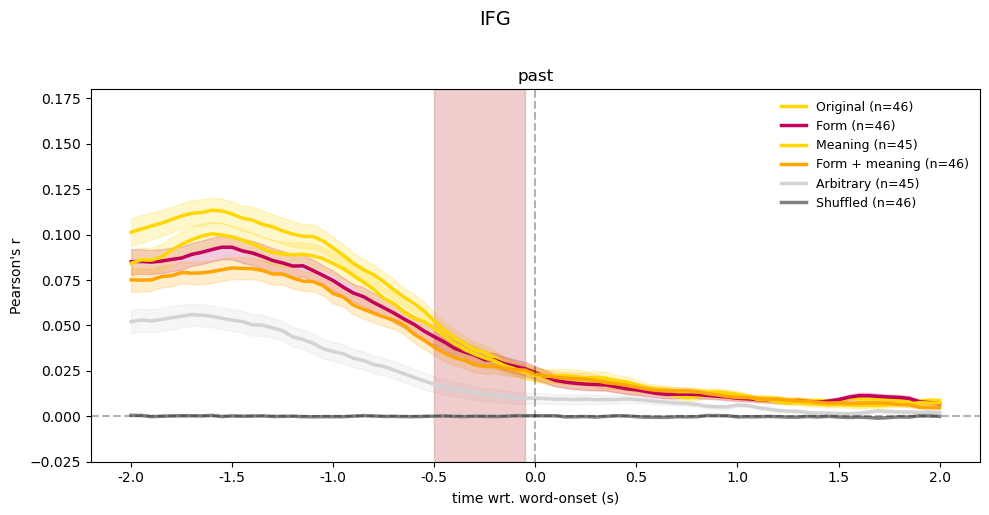

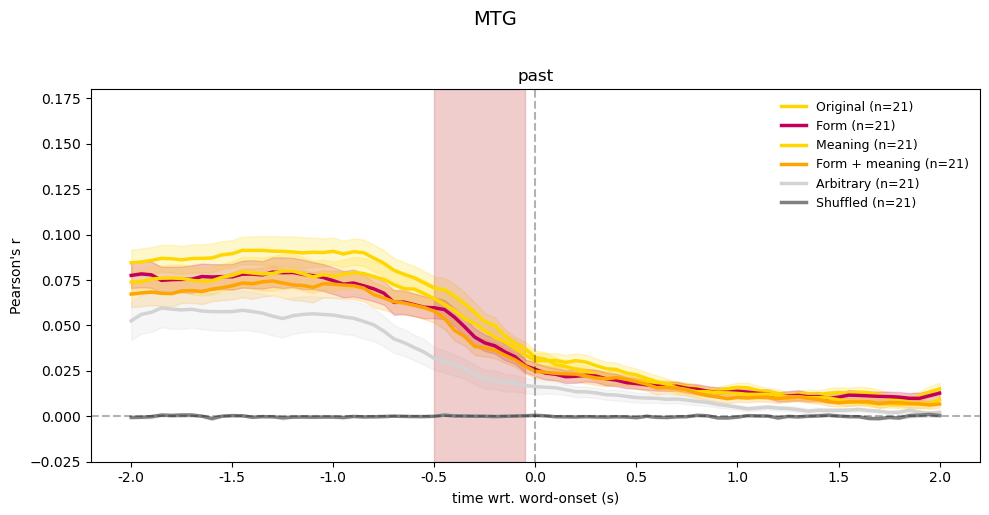

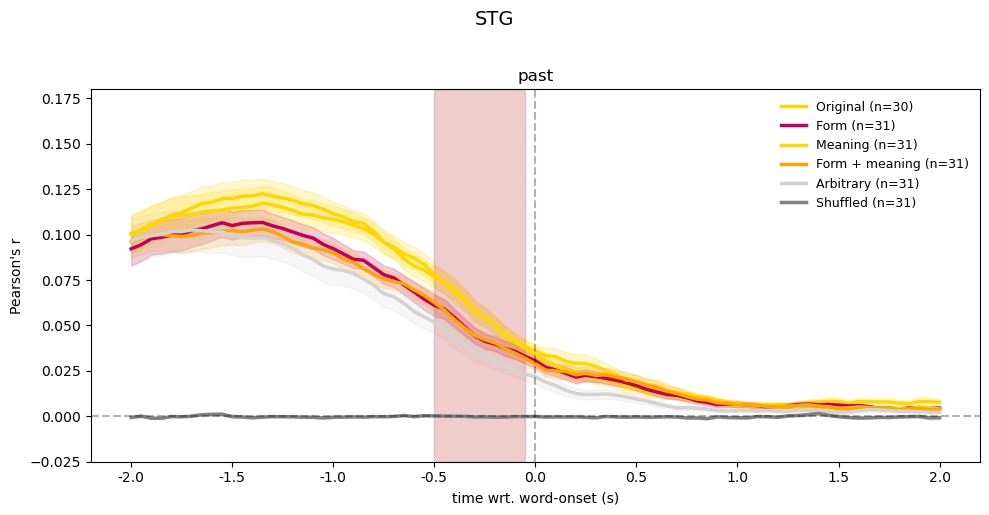

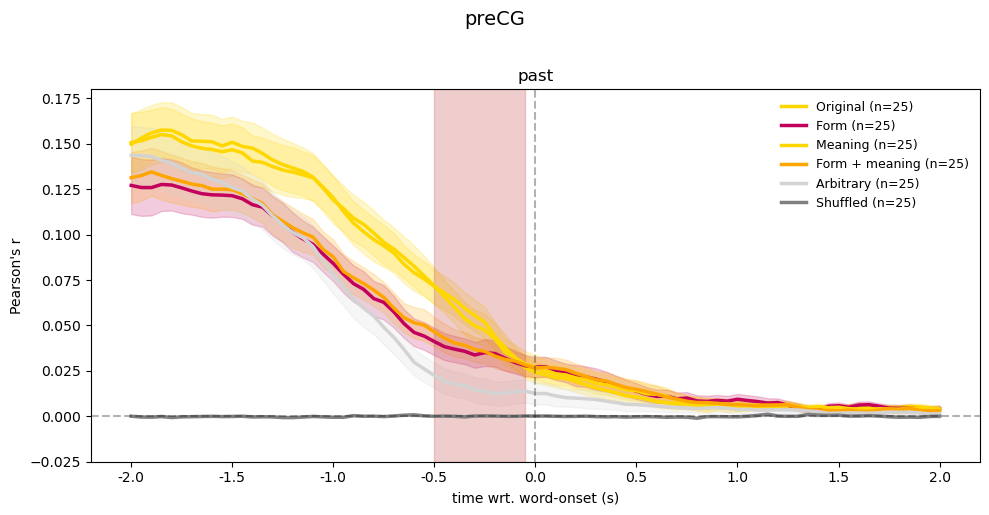

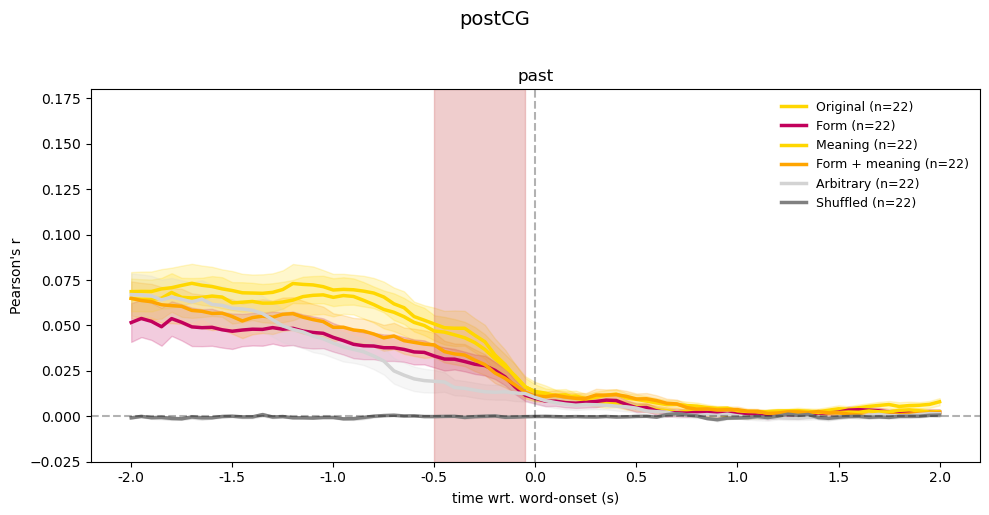

...

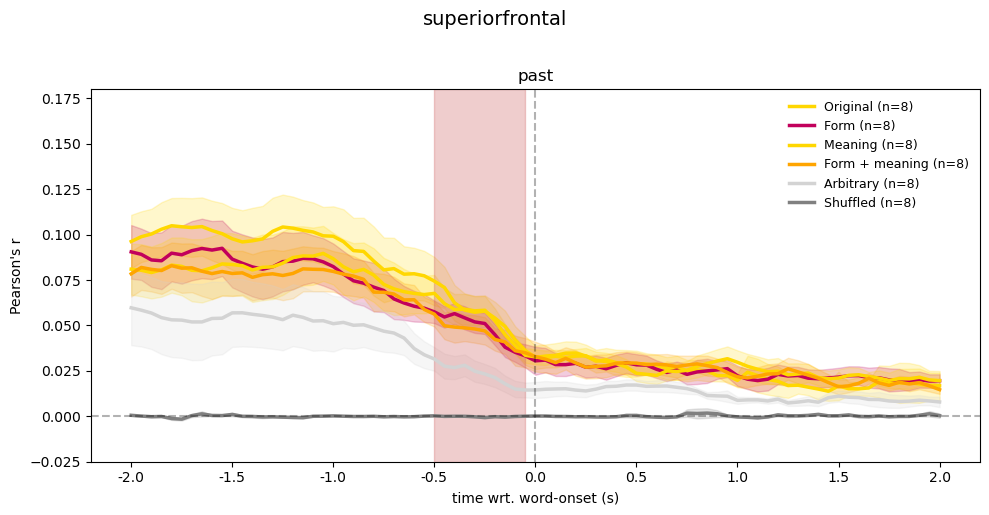

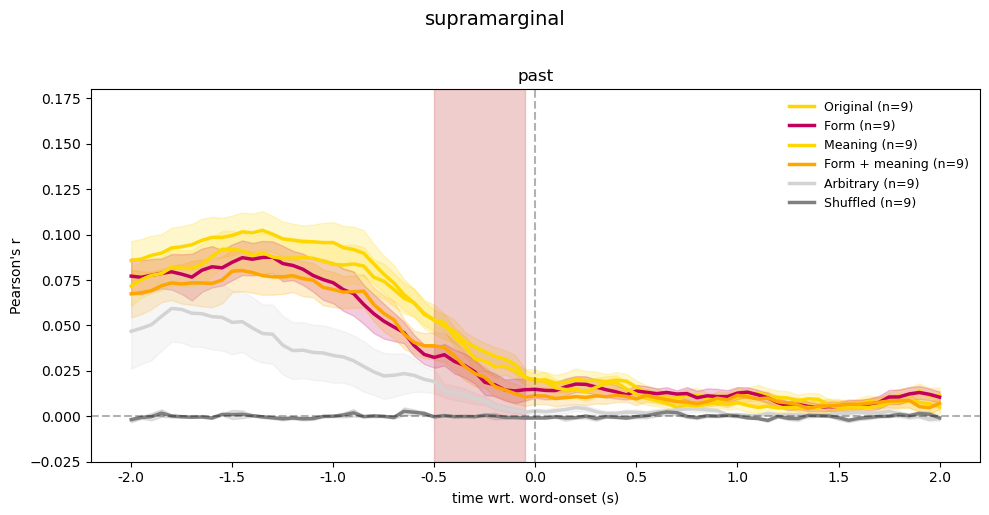

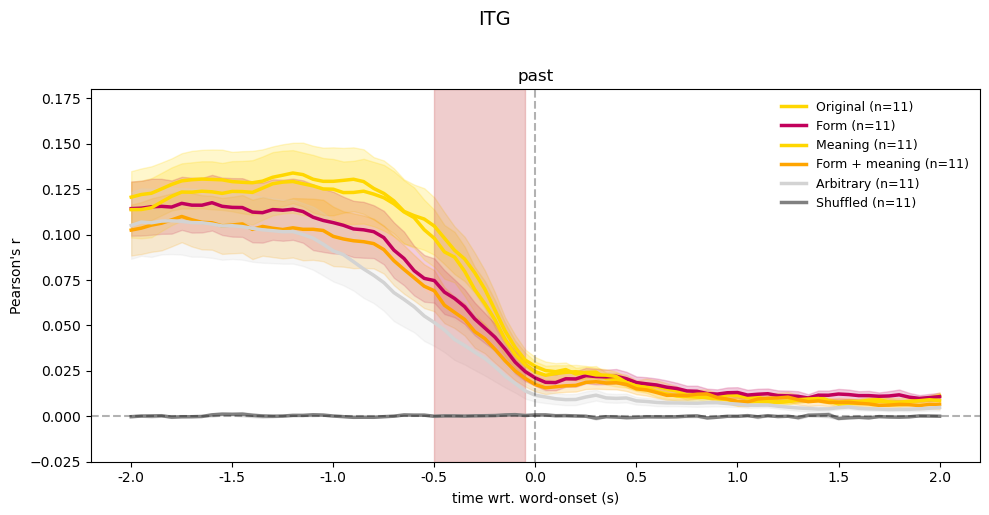

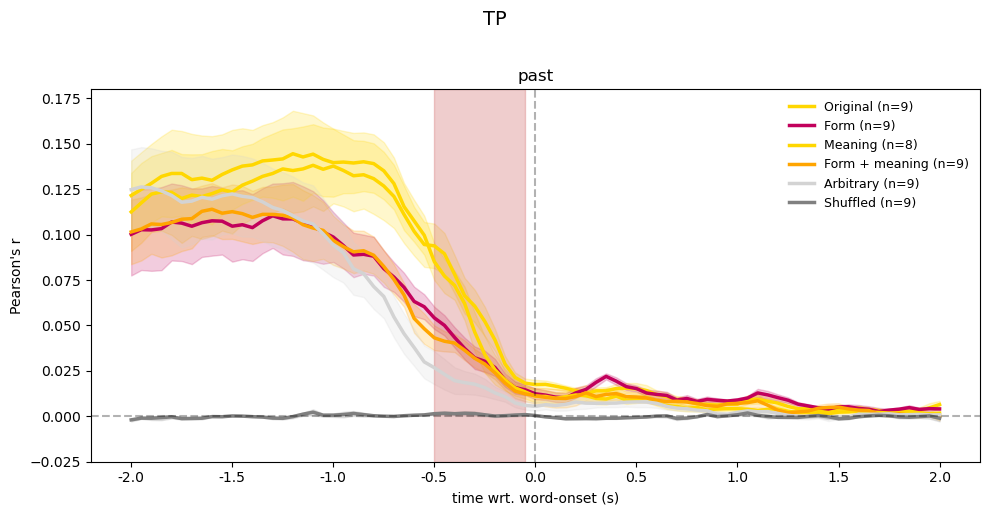

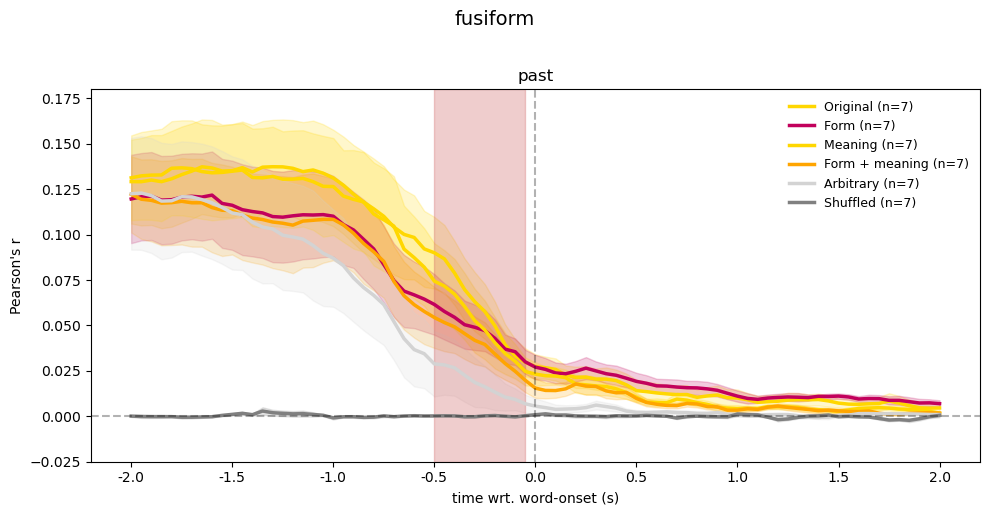

In [11]:
rois_to_plot_p = []
for roi in args.rois:
    key = (0, 'joint', roi)  # Standardized format without _banded_ prefix
    df = roi_results_p.get(key)
    if df is not None and df.shape[0] > 2:
        rois_to_plot_p.append(roi)

for roi in rois_to_plot_p:
    # Count electrodes in all production datasets for this ROI
    n_elecs_p = next(
        (len(df) for key, df in roi_results_p.items() 
         if key[2] == roi and isinstance(df, pd.DataFrame) and not df.empty), 
        0
    )
    
    if n_elecs_p < 3:
        continue
    
    plot_all_lines_across_datasets(
        args, 
        roi_results_p, 
        roi, 
        mode="prod", 
        ymax=0.18, 
        save=False, 
        titles=titles
    )

### Barplots old

In [12]:
from scipy import stats
import seaborn as sns

# ── helpers ────────────────────────────────────────────────────────────────────

def _lag_positions(df, lags_all, time_window=None):
    """
    Return iloc positions for lag columns, optionally filtered to a time window.
    
    Parameters:
    -----------
    time_window : None or tuple (lag_min, lag_max)
        If None, include all lags. If tuple, only include lags in [lag_min, lag_max].
    """
    n_lag_cols = df.shape[1] - 5
    if time_window is None:
        return [i for i in range(min(len(lags_all), n_lag_cols))]
    
    lag_min, lag_max = time_window
    positions = []
    for i, lag_val in enumerate(lags_all):
        if i >= n_lag_cols:
            break
        if lag_min <= lag_val <= lag_max:
            positions.append(i)
    return positions


def _paired_diffs_iloc(df_orig, df_reph, positions):
    """
    Per-electrode mean over `positions` (iloc), return (reph − orig) paired array.
    Pairs by electrode name so row order doesn't matter.
    """
    orig_means = df_orig.iloc[:, positions].mean(axis=1).values
    reph_means = df_reph.iloc[:, positions].mean(axis=1).values

    orig_map = dict(zip(df_orig["electrode"].values, orig_means))
    reph_map = dict(zip(df_reph["electrode"].values, reph_means))
    common   = set(orig_map) & set(reph_map)
    if not common:
        return np.array([])
    return np.array([reph_map[e] - orig_map[e] for e in common])


# ── main barplot function ──────────────────────────────────────────────────────

def plot_reph_diff_barplot(
    args,
    roi_results,
    titles,
    line_type="joint",
    time_window=None,
    rois_to_plot=None,
    exclude_labels=None,
    mode="comp",
    ymin=None,
    ymax=None,
    min_elecs=3,
    save=False,
    res_dir=None,
):
    """
    Grouped bar chart of rephrasing-method effects per ROI.

    Groups    = ROIs (x-axis)
    Bars      = rephrasing methods (dataset index 1..N vs 0 = original)
    Height    = mean(reph − original) per electrode averaged over time_window
    Errorbars = SEM of per-electrode paired differences
    Stars     = one-sample t-test vs 0  (* p<.05  ** p<.01  *** p<.001)
    
    Parameters:
    -----------
    time_window : None or (lag_min, lag_max) tuple
        If None, average over all lags. If tuple, average only over [lag_min, lag_max] in ms.
    exclude_labels : list of str, optional
        Dataset titles to exclude (e.g., don't plot "untrained_random").
    """
    dataset_indices = sorted({k[0] for k in roi_results.keys()})
    orig_idx     = 0
    reph_indices = [i for i in dataset_indices if i != orig_idx]
    reph_labels  = [titles[i] for i in reph_indices]
    
    # Filter out excluded labels
    if exclude_labels:
        reph_labels  = [l for l in reph_labels if l not in exclude_labels]
        reph_indices = [i for i, l in zip(reph_indices, [titles[ii] for ii in reph_indices]) if l not in exclude_labels]

    all_rois = sorted({k[2] for k in roi_results.keys()})
    if rois_to_plot is not None:
        all_rois = [r for r in rois_to_plot if r in all_rois]
    
    zin = "joint"
    if line_type == "sentence":
        zin = "past"
    elif line_type == "sentence2":
        zin = "future"

    bars_data = {}   # bars_data[roi][label] = (mean_diff, sem_diff, p, n)
    for roi in all_rois:
        orig_df = roi_results.get((orig_idx, line_type, roi))
        if orig_df is None or orig_df.empty:
            continue
        positions = _lag_positions(orig_df, args.lags["lags_all"], time_window=time_window)
        if not positions:
            continue
        roi_entry = {}
        for i, label in zip(reph_indices, reph_labels):
            reph_df = roi_results.get((i, line_type, roi))
            if reph_df is None or reph_df.empty:
                continue
            diffs = _paired_diffs_iloc(orig_df, reph_df, positions)
            if len(diffs) < min_elecs:
                continue
            _, p = stats.ttest_1samp(diffs, 0.0)
            roi_entry[label] = (float(np.mean(diffs)), float(stats.sem(diffs)), float(p), len(diffs))
        if roi_entry:
            bars_data[roi] = roi_entry

    if not bars_data:
        print("No data to plot — check roi_results, line_type, and rois_to_plot.")
        return

    rois_with_data = list(bars_data.keys())
    n_rois = len(rois_with_data)
    n_bars = len(reph_labels)
    # Custom color palette: synonym (gold), paraphrase (green), random content (turquoise), paraphrase random content (blue)
    # Get the same color cycle as the lineplots
    # Match the lineplot color scheme exactly
    n_datasets = len(dataset_indices)  # Total datasets including original
    all_dataset_colors = [args.colors[i] for i in dataset_indices if i != orig_idx]

    # Map each rephrasing method to its dataset index color (skip index 0 = original)
    colors = [all_dataset_colors[i-1] for i in reph_indices]
        
    fig, ax = plt.subplots(figsize=(max(10, n_rois * 1.8), 6))
    bar_w   = 0.8 / n_bars
    group_x = np.arange(n_rois)

    def _stars(p):
        # if p < 0.001: return "***"
        # if p < 0.01:  return "**"
        # if p < 0.05:  return "*"
        return ""

    for bi, label in enumerate(reph_labels):
        offsets = group_x + (bi - n_bars / 2 + 0.5) * bar_w
        means, sems, ps = [], [], []
        for roi in rois_with_data:
            entry = bars_data[roi].get(label, (0.0, 0.0, 1.0, 0))
            means.append(entry[0]); sems.append(entry[1]); ps.append(entry[2])
        ax.bar(offsets, means, width=bar_w * 0.9, color=colors[bi], label=label,
               alpha=0.85, yerr=sems, capsize=3,
               error_kw={"elinewidth": 1.2, "capthick": 1.2})
        for x, m, s, p_val in zip(offsets, means, sems, ps):
            y_pos = (m + s + 0.001) if m >= 0 else (m - s - 0.002)
            ax.text(x, y_pos, _stars(p_val), ha="center", va="bottom", fontsize=8)

    ax.axhline(0, color="k", lw=0.8, ls="--", alpha=0.5)
    ax.set_xticks(group_x)
    ax.set_xticklabels(rois_with_data, rotation=30, ha="right", fontsize=10)
    ax.set_ylabel(f"Δ over lags {time_window[0], time_window[1]}; {line_type} Pearson's r (reph − original)", fontsize=11)
    # ax.title(f"Timewindow: {time_window[0], time_window[1]} - {zin} sentence")
    mode_full = "Comprehension" if mode == "comp" else "Production"
    if time_window is None:
        lag_lo = args.lags["lags_plt"][0]
        lag_hi = args.lags["lags_plt"][-1]
        window_str = f"full window ({lag_lo}–{lag_hi} ms)"
    else:
        window_str = f"{time_window[0]}–{time_window[1]} ms"
    # ax.set_title(
    #     f"{mode_full} — {line_type} — {window_str}"
    #     f"   |   * p<.05   ** p<.01   ",
    #     fontsize=11,
    # )
    ax.legend(loc="lower left", frameon=True, fontsize=9)

    if ymin is not None or ymax is not None:
        ax.set_ylim(ymin, ymax)
    plt.tight_layout()
    if save and res_dir:
        plt.savefig(f"{res_dir}/reph_diff_barplot_{mode}_{line_type}.jpeg", bbox_inches="tight")
        plt.close(fig)
    else:
        plt.show()

#### Joint comp

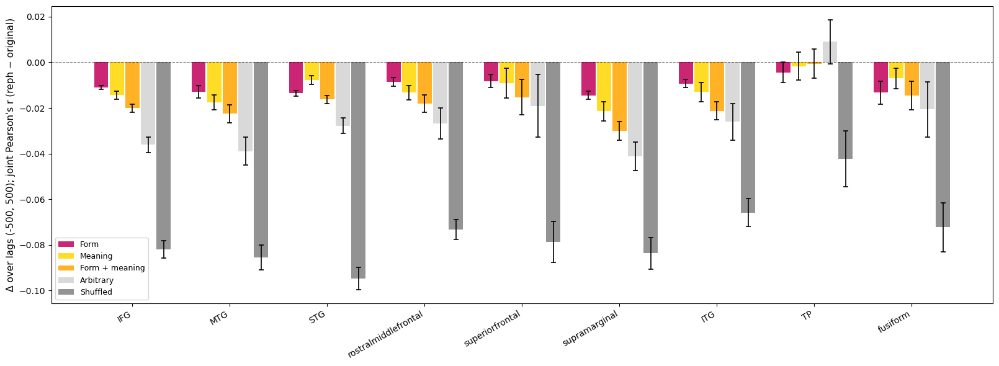

In [13]:
plot_reph_diff_barplot(
    args, roi_results_c, titles,
    line_type="joint",
    time_window=(-500, 500),
    exclude_labels=["Baseline"],
    mode="comp",
    rois_to_plot=["IFG","MTG", "STG", "rostralmiddlefrontal",
        "superiorfrontal", "supramarginal", "ITG", "TP", "fusiform"], 
)

#### Future comp

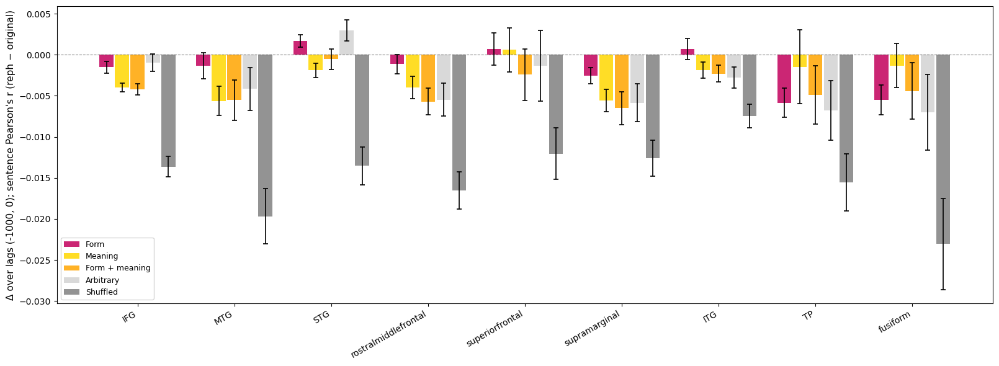

In [14]:
plot_reph_diff_barplot(
    args, roi_results_c, titles,
    line_type="sentence",
    time_window=(-1000, 0),
    exclude_labels=["Baseline"],
    mode="comp",
    rois_to_plot=["IFG","MTG", "STG", "rostralmiddlefrontal",
        "superiorfrontal", "supramarginal", "ITG", "TP", "fusiform"], 
)

#### Past comp

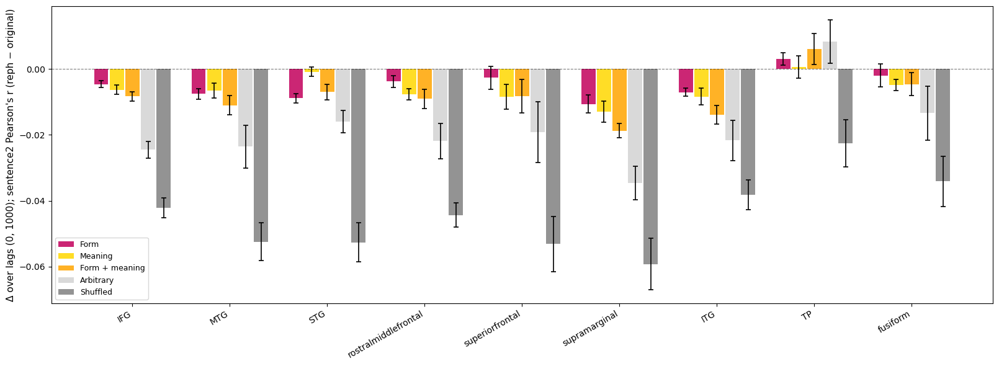

In [15]:
plot_reph_diff_barplot(
    args, roi_results_c, titles,
    line_type="sentence2",
    time_window=(0, 1000),
    exclude_labels=["Baseline"],
    mode="comp",
    rois_to_plot=["IFG","MTG", "STG", "rostralmiddlefrontal",
        "superiorfrontal", "supramarginal", "ITG", "TP", "fusiform"], 
)

#### Joint prod

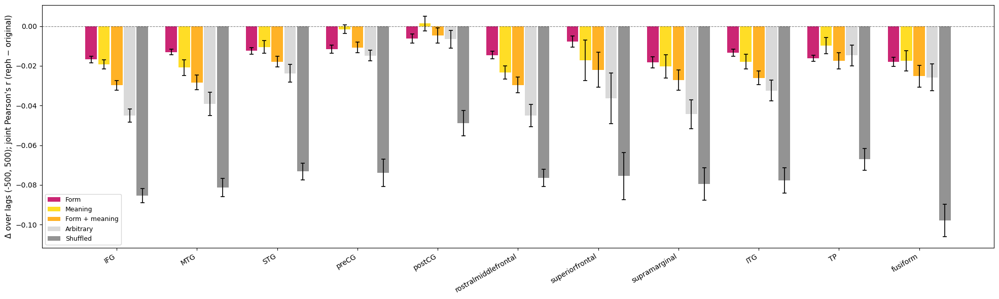

In [16]:
plot_reph_diff_barplot(
    args, roi_results_p, titles,
    line_type="joint",
    time_window=(-500, 500),
    exclude_labels=["Baseline"],
    mode="prod",
    rois_to_plot=["IFG","MTG", "STG","preCG","postCG", "rostralmiddlefrontal",
        "superiorfrontal", "supramarginal", "ITG", "TP", "fusiform"],  
)

#### Future prod

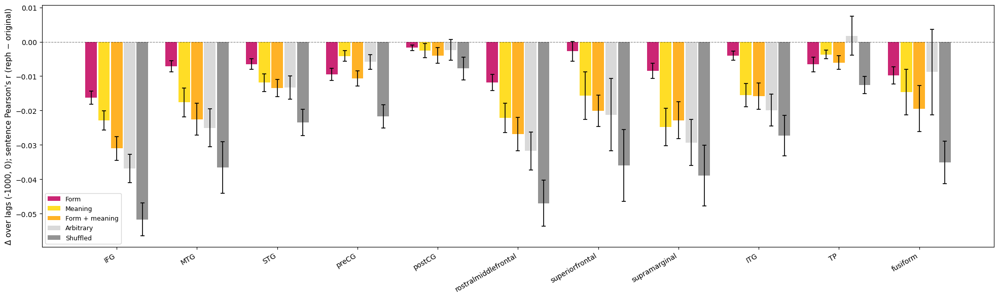

In [17]:
plot_reph_diff_barplot(
    args, roi_results_p, titles,
    line_type="sentence",
    time_window=(-1000, 0),
    exclude_labels=["Baseline"],
    mode="prod",
    rois_to_plot=["IFG","MTG", "STG","preCG","postCG", "rostralmiddlefrontal",
        "superiorfrontal", "supramarginal", "ITG", "TP", "fusiform"],  
)

#### Past prod

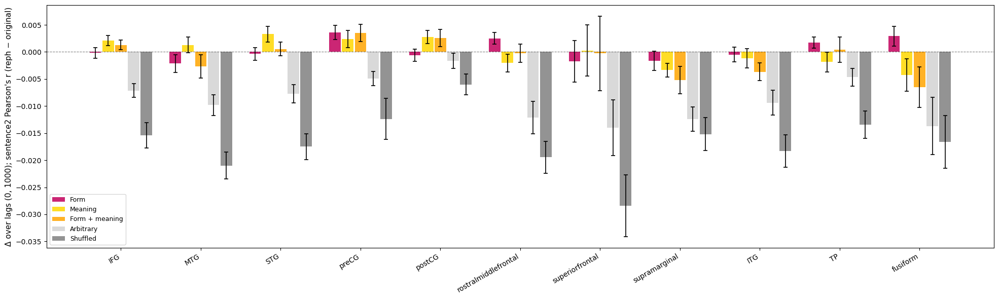

In [18]:
plot_reph_diff_barplot(
    args, roi_results_p, titles,
    line_type="sentence2",
    time_window=(0, 1000),
    exclude_labels=["Baseline"],
    mode="prod",
    rois_to_plot=["IFG","MTG", "STG","preCG","postCG", "rostralmiddlefrontal",
        "superiorfrontal", "supramarginal", "ITG", "TP", "fusiform"],  
)

## Brainplots


### Changed sentences

In [19]:
import numpy as np
import pandas as pd
from matplotlib.colors import LinearSegmentedColormap
import tfsplt_future_past_utils as pu
from tfsplt_future_past_helpers import pair_metrics, render_brainplot_panels

TOP_N_LAGS = 3

def pink_grey_yellow_cmap(name):
    return LinearSegmentedColormap.from_list(name, ["#c2005c", "#9e9e9e", "#ffd700"], N=256)

def align_lag_columns(dfs, lag_cols, n_meta_cols=5):
    for df in dfs:
        n_lag = len(df.columns) - n_meta_cols
        df.columns = list(lag_cols[:n_lag]) + list(df.columns[-n_meta_cols:])

def compute_brainplot_scores(
    condition_dfs,
    label3,
    time_window,
    color_pair=("reph", "ctrl"),
    *,
    value_thresholds=None,
    diff_thresholds=None,
    score_mode="max_abs_diff",
    size_pair=None,
    size_time_window=None,
    size_mode="max_abs_diff",
    size_min=10,
    size_max=90,
    band_thresholds=None,
    threshold_time_window=None,
    denominator_pair=("original", "parandom"),
    threshold_label3=None,
):
    value_thresholds = value_thresholds or {}
    diff_thresholds = diff_thresholds or []
    band_thresholds = band_thresholds or {}
    size_pair = color_pair if size_pair is None else size_pair
    size_time_window = time_window if size_time_window is None else size_time_window
    threshold_time_window = time_window if threshold_time_window is None else threshold_time_window

    valid_modes = {"max_abs_diff", "percent_change_at_max_diff"}
    if score_mode not in valid_modes or size_mode not in valid_modes:
        raise ValueError(f"score_mode and size_mode must be in {valid_modes}")
    if size_max < size_min:
        raise ValueError("size_max must be >= size_min")

    try:
        top_n_lags = max(1, int(TOP_N_LAGS))
    except (TypeError, ValueError, NameError):
        top_n_lags = 1

    def infer_merge_keys(dfs_):
        cols = [set(df.columns) for df in dfs_]
        if all("subject_electrode" in c for c in cols):
            return ["subject_electrode"]
        if all({"subject", "electrode"}.issubset(c) for c in cols):
            return ["subject", "electrode"]
        if all("electrode" in c for c in cols):
            return ["electrode"]
        raise KeyError("No common merge key found")

    def safe_nanmax(x):
        x = np.asarray(x, dtype=float).ravel()
        x = x[np.isfinite(x)]
        return float(x.max()) if x.size else np.nan

    def threshold_cols_for(cond):
        if isinstance(threshold_time_window, dict):
            return threshold_time_window.get(cond, time_window)
        return threshold_time_window

    def mode_score(mode, pm, max_a, max_b):
        if mode == "max_abs_diff":
            return pm["max_diff"], pm["max_diff"]
        score_value = pm["pct"]
        return score_value, np.abs(score_value) if np.isfinite(score_value) else np.nan

    needed = {
        color_pair[0], color_pair[1],
        size_pair[0], size_pair[1],
        denominator_pair[0], denominator_pair[1],
        *value_thresholds.keys(),
    }
    for threshold in diff_thresholds:
        if len(threshold) != 3:
            raise ValueError("Each diff_threshold must be exactly: (cond_a, cond_b, min_diff)")
        needed.update([threshold[0], threshold[1]])

    if label3 in band_thresholds:
        needed.add("original")

    missing = [condition for condition in needed if condition not in condition_dfs]
    if missing:
        raise KeyError(f"Missing conditions in condition_dfs: {missing}")

    merge_keys = infer_merge_keys([condition_dfs[condition] for condition in needed])

    all_cols_set = set(time_window) | set(size_time_window)
    for band_info in band_thresholds.values():
        if isinstance(band_info, dict) and "cols" in band_info:
            all_cols_set |= set(band_info["cols"])
    all_needed_cols = sorted(all_cols_set)

    thresh_label3_lookup = {}
    if threshold_label3 is not None and value_thresholds:
        for condition in value_thresholds:
            df_t = condition_dfs[condition]
            df_t = df_t[df_t["label3"] == threshold_label3]
            tcols = [c for c in threshold_cols_for(condition) if c in df_t.columns]
            lookup = {}
            for _, row_t in df_t.iterrows():
                elec_key = tuple(str(row_t[k]) for k in merge_keys)
                lookup[elec_key] = safe_nanmax([row_t[c] for c in tcols])
            thresh_label3_lookup[condition] = lookup

    merged = None
    for index, condition in enumerate(sorted(needed)):
        df = condition_dfs[condition]
        df = df[df["label3"] == label3].copy()

        missing_cols = [col for col in all_needed_cols if col not in df.columns]
        if missing_cols:
            preview = f"{missing_cols[:5]}{'...' if len(missing_cols) > 5 else ''}"
            raise KeyError(f"Condition '{condition}' missing lag columns: {preview}")

        keep_meta = merge_keys.copy()
        if index == 0:
            for meta_col in ["roi", "subject", "subject_electrode", "electrode"]:
                if meta_col in df.columns and meta_col not in keep_meta:
                    keep_meta.append(meta_col)

        part = df[keep_meta + all_needed_cols].rename(columns={col: f"{col}__{condition}" for col in all_needed_cols})
        merged = part if merged is None else merged.merge(part, on=merge_keys, how="inner")

    denom_a, denom_b = denominator_pair

    rows = []
    for _, row in merged.iterrows():
        def vals(condition, cols):
            return np.asarray([row[f"{col}__{condition}"] for col in cols], dtype=float)

        cond_max = {condition: safe_nanmax(vals(condition, time_window)) for condition in needed}
        if thresh_label3_lookup:
            threshold_max = {}
            for condition in value_thresholds:
                elec_key = tuple(str(row[k]) for k in merge_keys)
                threshold_max[condition] = thresh_label3_lookup[condition].get(elec_key, np.nan)
        else:
            threshold_max = {condition: safe_nanmax(vals(condition, threshold_cols_for(condition))) for condition in value_thresholds}

        ok_val = all(threshold_max.get(condition, np.nan) >= value for condition, value in value_thresholds.items())
        if not ok_val:
            continue

        ok_diff = True
        for cond_a, cond_b, min_diff in diff_thresholds:
            value_a = safe_nanmax(vals(cond_a, time_window))
            value_b = safe_nanmax(vals(cond_b, time_window))
            if not np.isfinite(value_a) or not np.isfinite(value_b) or np.abs(value_a - value_b) < min_diff:
                ok_diff = False
                break
        if not ok_diff:
            continue

        if label3 in band_thresholds:
            band_info = band_thresholds[label3]
            band_cols = band_info.get("cols", time_window)
            band_threshold = band_info.get("value", 0)
            band_max = safe_nanmax(vals("original", band_cols))
            if not np.isfinite(band_max) or band_max < band_threshold:
                continue

        color_a, color_b = color_pair
        pm_c = pair_metrics(
            vals(color_a, time_window), vals(color_b, time_window),
            top_n=top_n_lags,
            size_a=vals(denom_a, time_window),
            size_b=vals(denom_b, time_window),
        )
        score, score_abs = mode_score(score_mode, pm_c, cond_max.get(color_a, np.nan), cond_max.get(color_b, np.nan))

        size_a, size_b = size_pair
        max_size_a = safe_nanmax(vals(size_a, size_time_window))
        max_size_b = safe_nanmax(vals(size_b, size_time_window))
        pm_s = pair_metrics(vals(size_a, size_time_window), vals(size_b, size_time_window), top_n=top_n_lags)
        size_score, size_score_abs = mode_score(size_mode, pm_s, max_size_a, max_size_b)

        subject_electrode = row.get("subject_electrode", np.nan)
        subject = str(subject_electrode).split("_", 1)[0] if pd.notna(subject_electrode) else row.get("subject", np.nan)

        out = {
            "subject": subject,
            "subject_electrode": subject_electrode,
            "electrode": row.get("electrode", np.nan),
            "roi": row.get("roi", "unknown"),
            "label3": label3,
            "score": score,
            "score_abs": score_abs,
            "score_mode": score_mode,
            "max_diff": pm_c["max_diff"],
            "percent_change": pm_c["pct"],
            "max_diff_lag": time_window[pm_c["idx"]] if pm_c["idx"] < len(time_window) else np.nan,
            "control_at_max": pm_c["b_at"],
            "reph_at_max": pm_c["a_at"],
            "size_score": size_score,
            "size_score_abs": size_score_abs,
            "size_mode": size_mode,
            "size_max_diff": pm_s["max_diff"],
            "size_percent_change": pm_s["pct"],
        }
        for condition in needed:
            out[f"max_{condition}"] = cond_max.get(condition, np.nan)
        rows.append(out)

    df_out = pd.DataFrame(rows)
    df_out["node_size"] = float(size_min)

    if len(df_out) and df_out["size_score_abs"].notna().any():
        values = df_out["size_score_abs"].to_numpy(dtype=float)
        vmin, vmax = float(np.nanmin(values)), float(np.nanmax(values))
        if vmax > vmin:
            scaled = size_min + ((values - vmin) / (vmax - vmin)) * (size_max - size_min)
        else:
            scaled = np.full(len(values), float(size_max if np.isfinite(vmax) and vmax > 0 else size_min))
        df_out["node_size"] = np.clip(scaled, float(size_min), float(size_max))

    return df_out


#### Excluding electrodes

In [20]:
# Manually exclude electrodes from all downstream analyses.
# Add electrode names here to remove them from the brainplots and every barplot that reuses these globals.
MANUAL_EXCLUDED_ELECTRODES = [
     
]


def exclude_manual_electrodes(df, excluded_electrodes):
    excluded = {str(name) for name in excluded_electrodes if str(name)}
    if not excluded:
        return df

    candidate_cols = [col for col in ("electrode", "subject_electrode") if col in df.columns]
    if not candidate_cols:
        return df

    mask = pd.Series(False, index=df.index)
    for col in candidate_cols:
        mask |= df[col].astype(str).isin(excluded)
    return df.loc[~mask].copy()


def format_electrode_list(df):
    if "electrode" in df.columns:
        values = df["electrode"]
    elif "subject_electrode" in df.columns:
        values = df["subject_electrode"]
    else:
        return []
    return sorted({str(value) for value in values.dropna().astype(str).tolist()})


if MANUAL_EXCLUDED_ELECTRODES:
    print(f"Manually excluding electrodes: {MANUAL_EXCLUDED_ELECTRODES}")
    paraphrase8_c = exclude_manual_electrodes(paraphrase8_c, MANUAL_EXCLUDED_ELECTRODES)
    paraphrase8_p = exclude_manual_electrodes(paraphrase8_p, MANUAL_EXCLUDED_ELECTRODES)
    random_content_word8_c = exclude_manual_electrodes(random_content_word8_c, MANUAL_EXCLUDED_ELECTRODES)
    random_content_word8_p = exclude_manual_electrodes(random_content_word8_p, MANUAL_EXCLUDED_ELECTRODES)
    original8_c = exclude_manual_electrodes(original8_c, MANUAL_EXCLUDED_ELECTRODES)
    original8_p = exclude_manual_electrodes(original8_p, MANUAL_EXCLUDED_ELECTRODES)
    parandom8_c = exclude_manual_electrodes(parandom8_c, MANUAL_EXCLUDED_ELECTRODES)
    parandom8_p = exclude_manual_electrodes(parandom8_p, MANUAL_EXCLUDED_ELECTRODES)
else:
    print("Manual electrode exclusions: none")

Manual electrode exclusions: none


### Create the brainplots

**Conditions:**  
Color: **paraphrase (Form) vs RCW / random-content-word (Meaning)**  
Size: **original vs double-rephrase (Form+meaning)**

Each electrode must be present in **all 4 conditions** — original, paraphrase, RCW, double-rephrase — via inner merge across all conditions.

**Color formula** (`SCORE_MODE = "percent_change_at_max_diff"`, `TOP_N_LAGS = 3`):  
1. Select the top-3 lag indices where `|paraphrase[t] − RCW[t]|` is largest (within the panel time window) → *numerator lags*.  
2. Separately select the top-3 lag indices where `|original[t] − double-rephrase[t]|` is largest (same window) → *denominator lags*.  
3. `score = 100 × (mean(paraphrase at numerator lags) − mean(RCW at numerator lags)) / mean(|original − double-rephrase| at denominator lags)`

**Color scale:** vmin = −75, vmax = +75.  
Colormap: dark-pink (#c2005c) → neutral-grey (#9e9e9e) → dark-yellow (#ffd700).  
- **Yellow** = paraphrase > RCW → electrode sensitive to **meaning**  
- **Pink** = paraphrase < RCW → electrode sensitive to **form**

**Time windows (score + size):**

| Panel | Window |
|---|---|
| comp / sentence (future) | −1000 to 0 ms |
| comp / sentence2 (past) | 0 to +1000 ms |
| prod / sentence (future) | −1000 to 0 ms |
| prod / sentence2 (past) | 0 to +1000 ms |

Lag grid: `np.arange(-2000, 2001, 50)` (50 ms steps).

**Electrode size formula** (`SIZE_MODE = "max_abs_diff"`, size pair = original vs double-rephrase):  
Select top-3 lags where `|original[t] − double-rephrase[t]|` is largest → `size_score = mean(|original − double-rephrase|)` at those lags.  
`node_size = clip(10 + (size_score − global_min) / (global_max − global_min) × 80, 10, 90)`

**Electrode inclusion filters (all must pass):**  
1. `original` **(joint-labeled)** max ≥ **0.1** over full window [−1000, +1000 ms] — checked against joint-labeled data, not the panel's label.  
2. `|original − double-rephrase|` ≥ **0.00** (currently inactive, included for completeness).  
3. `sentence` panels: `original` **(sentence-labeled)** max ≥ **0.03** in [−1000, 0 ms].  
4. `sentence2` panels: `original` **(sentence2-labeled)** max ≥ **0.03** in [0, +1000 ms].

=== Brainplot settings ===
  TOP_N_LAGS: 3
  Color pair: reph vs ctrl  |  Size pair: original vs parandom
  Score mode: percent_change_at_max_diff  |  Size mode: max_abs_diff
  Percent-change denominator: original vs parandom

=== Electrode inclusion thresholds ===
  Joint (original, joint-labeled): max >= 0.1 over -1000..1000 ms
  Band 'sentence' (original, sentence-labeled): max >= 0.03 over -1000..0 ms
  Band 'sentence2' (original, sentence2-labeled): max >= 0.03 over 0..1000 ms

=== Per-panel time windows ===
  Comprehension - Future: -1000..0 ms
  Comprehension - Past: 0..1000 ms
  Production - Future: -1000..0 ms
  Production - Past: 0..1000 ms
score_mode=percent_change_at_max_diff | n_total=621
    → Final: 89 electrodes plotted: []


/scratch/gpfs/HASSON/gidon/247-plotting/scripts/tfsplt_future_past_helpers.py:119: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  small_circle = mpatches.Ellipse(
/scratch/gpfs/HASSON/gidon/247-plotting/scripts/tfsplt_future_past_helpers.py:132: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  large_circle = mpatches.Ellipse(
/scratch/gpfs/HASSON/gidon/247-plotting/scripts/tfsplt_future_past_helpers.py:119: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  small_circle = mpatches.Ellipse(
/scratch/gpfs/HASSON/gidon/247-plotting/scripts/tfsplt_future_past_helpers.py:132: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  large_circle = mpatches.Ellipse(


    → Final: 222 electrodes plotted: []
    → Final: 173 electrodes plotted: []


/scratch/gpfs/HASSON/gidon/247-plotting/scripts/tfsplt_future_past_helpers.py:119: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  small_circle = mpatches.Ellipse(
/scratch/gpfs/HASSON/gidon/247-plotting/scripts/tfsplt_future_past_helpers.py:132: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  large_circle = mpatches.Ellipse(
/scratch/gpfs/HASSON/gidon/247-plotting/scripts/tfsplt_future_past_helpers.py:119: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  small_circle = mpatches.Ellipse(
/scratch/gpfs/HASSON/gidon/247-plotting/scripts/tfsplt_future_past_helpers.py:132: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  large_circle = mpatches.Ellipse(


    → Final: 137 electrodes plotted: []


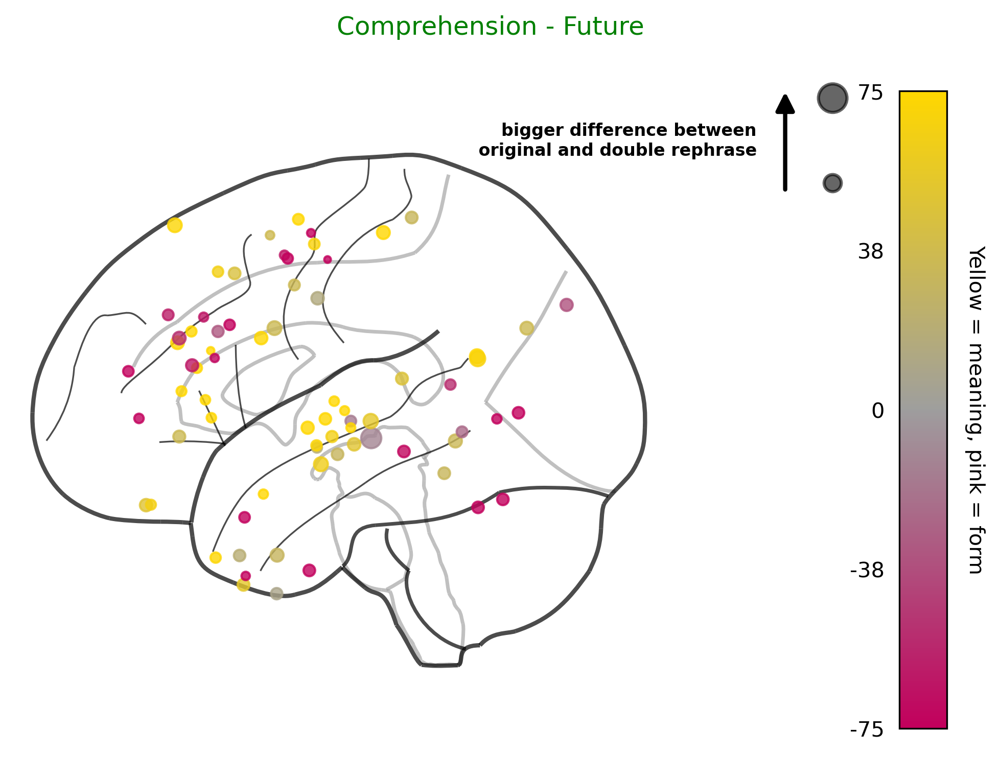

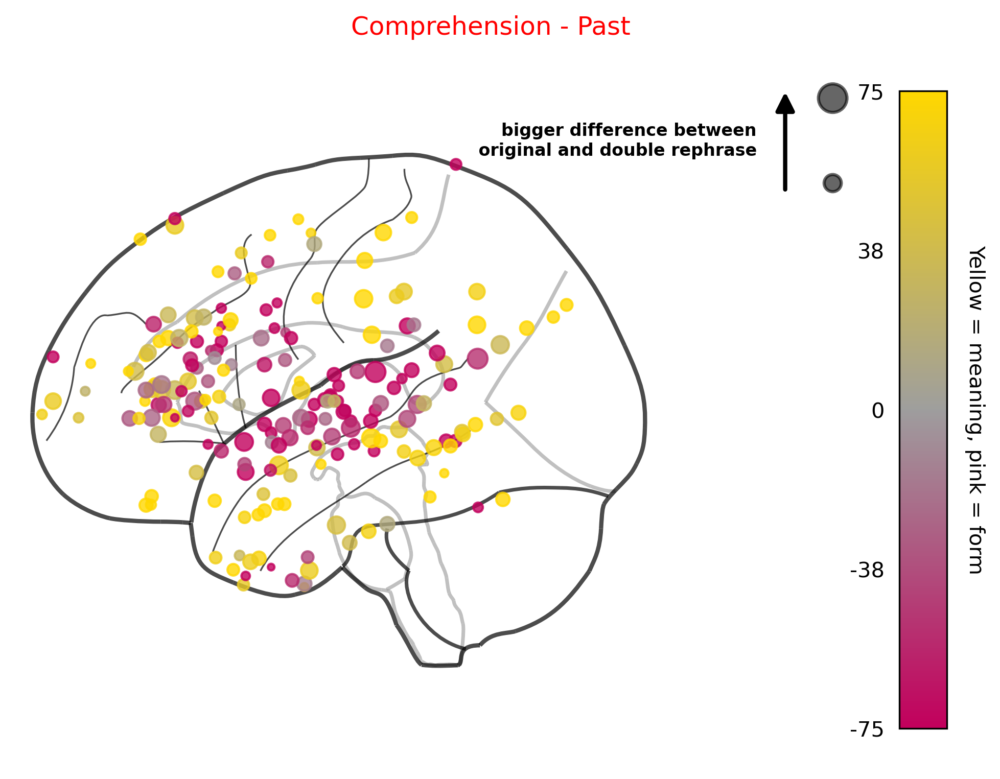

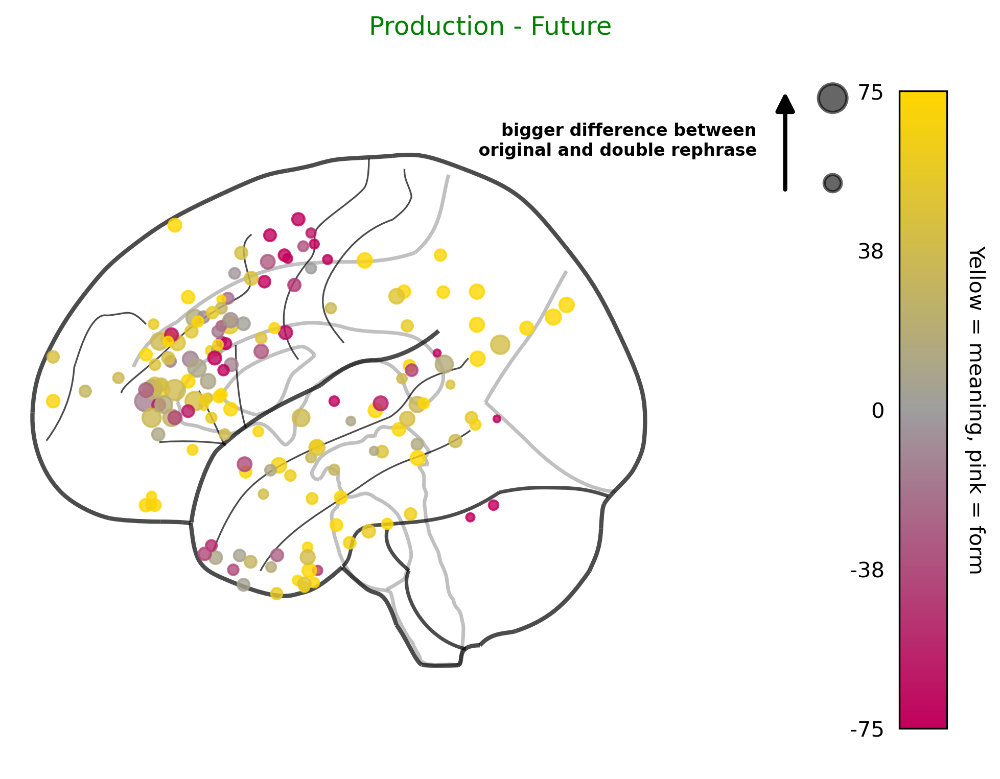

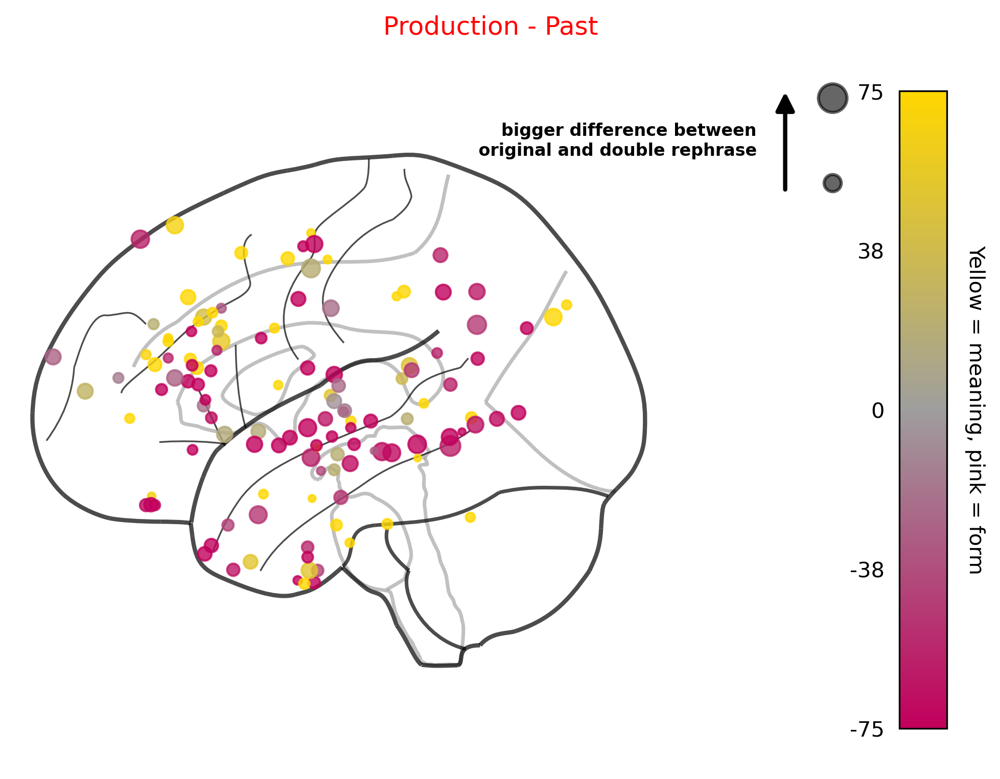

In [21]:
# lag columns
lag_cols = np.arange(-2000, 2001, 50)

data_by_mode = {
    "comp": {
        "reph":     paraphrase8_c,
        "ctrl":     random_content_word8_c,
        "original": original8_c,
        "parandom": parandom8_c,
    },
    "prod": {
        "reph":     paraphrase8_p,
        "ctrl":     random_content_word8_p,
        "original": original8_p,
        "parandom": parandom8_p,
    },
}

align_lag_columns(
    dfs=[
        paraphrase8_c, paraphrase8_p,
        random_content_word8_c, random_content_word8_p,
        original8_c, original8_p,
        parandom8_c, parandom8_p,
    ],
    lag_cols=lag_cols,
    n_meta_cols=5,
)

time_window_future_comp = [int(c) for c in lag_cols if c >= -1000 and c <= 0]
time_window_past_comp   = [int(c) for c in lag_cols if c >= 0 and c <= 1000]
time_window_future_prod = [int(c) for c in lag_cols if c >= -1000 and c <= 0]
time_window_past_prod   = [int(c) for c in lag_cols if c >= 0 and c <= 1000]
time_window_full        = [int(c) for c in lag_cols if c >= -1000 and c <= 1000]

time_windows = {
    ("comp", "sentence"):  time_window_future_comp,
    ("comp", "sentence2"): time_window_past_comp,
    ("comp", "joint"):     time_window_full,
    ("prod", "sentence"):  time_window_future_prod,
    ("prod", "sentence2"): time_window_past_prod,
    ("prod", "joint"):     time_window_full,
}

plot_order = [
    # ("comp", "joint", "Comprehension - Joint"),
    ("comp", "sentence",  "Comprehension - Future"),
    ("comp", "sentence2", "Comprehension - Past"),
    # ("prod", "joint", "Production - Joint"),
    ("prod", "sentence",  "Production - Future"),
    ("prod", "sentence2", "Production - Past"),
]

VALUE_THRESHOLDS = {"original": 0.1}
THRESHOLD_TIME_WINDOWS = {"original": time_window_full}
BAND_THRESHOLDS = {
    "sentence":  {"value": 0.03, "cols": time_window_future_comp},
    "sentence2": {"value": 0.03, "cols": time_window_past_comp},
}

SCORE_MODE = "percent_change_at_max_diff"
SIZE_MODE  = "max_abs_diff"
COLOR_PAIR = ("reph", "ctrl")
SIZE_PAIR  = ("original", "parandom")
USE_SIZE_ENCODING = True
SIZE_MIN, SIZE_MAX = 10, 90
TOP_N_LAGS = TOP_N_LAGS

print("=== Brainplot settings ===")
print(f"  TOP_N_LAGS: {TOP_N_LAGS}")
print(f"  Color pair: {COLOR_PAIR[0]} vs {COLOR_PAIR[1]}  |  Size pair: {SIZE_PAIR[0]} vs {SIZE_PAIR[1]}")
print(f"  Score mode: {SCORE_MODE}  |  Size mode: {SIZE_MODE}")
print(f"  Percent-change denominator: {SIZE_PAIR[0]} vs {SIZE_PAIR[1]}")
print()
print("=== Electrode inclusion thresholds ===")
tw_thresh = THRESHOLD_TIME_WINDOWS['original']
print(f"  Joint (original, joint-labeled): max >= {VALUE_THRESHOLDS['original']} over {tw_thresh[0]}..{tw_thresh[-1]} ms")
for band_label, info in BAND_THRESHOLDS.items():
    cols = info['cols']
    print(f"  Band '{band_label}' (original, {band_label}-labeled): max >= {info['value']} over {cols[0]}..{cols[-1]} ms")
print()
print("=== Per-panel time windows ===")
for mode, label3, desc in plot_order:
    tw = time_windows[(mode, label3)]
    print(f"  {desc}: {tw[0]}..{tw[-1]} ms")

cmaps = {
    "sentence":  pink_grey_yellow_cmap("sentence_cmap"),
    "sentence2": pink_grey_yellow_cmap("sentence2_cmap"),
    "joint":     pink_grey_yellow_cmap("joint_cmap"),
}

colorbar_labels = {
    "sentence":  "Yellow = meaning, pink = form",
    "sentence2": "Yellow = meaning, pink = form",
    "joint":     "Yellow = meaning, pink = form",
}

panel_scores = []
for mode, label3, _ in plot_order:
    cfg = data_by_mode[mode]
    tw  = time_windows[(mode, label3)]

    scores = compute_brainplot_scores(
        condition_dfs=cfg,
        label3=label3,
        time_window=tw,
        color_pair=COLOR_PAIR,
        value_thresholds=VALUE_THRESHOLDS,
        score_mode=SCORE_MODE,
        size_pair=SIZE_PAIR if USE_SIZE_ENCODING else COLOR_PAIR,
        size_time_window=tw,
        size_mode=SIZE_MODE,
        size_min=SIZE_MIN,
        size_max=SIZE_MAX,
        band_thresholds=BAND_THRESHOLDS,
        threshold_time_window=THRESHOLD_TIME_WINDOWS,
        denominator_pair=SIZE_PAIR,
        threshold_label3="joint",
    ).assign(mode=mode)
    panel_scores.append(scores)

electrode_scores = pd.concat(panel_scores, ignore_index=True) if panel_scores else pd.DataFrame()

render_brainplot_panels(
    electrode_scores=electrode_scores,
    plot_order=plot_order,
    cmaps=cmaps,
    colorbar_labels=colorbar_labels,
    score_mode=SCORE_MODE,
    use_size_encoding=USE_SIZE_ENCODING,
)


### NEW RELEVANT BARPLOTS

**Conditions:** Each panel shows **all 5 rephrase conditions vs original**:  
Form (paraphrase), Meaning (RCW), Form+meaning (double-rephrase), Arbitrary (untrained model), Shuffled.

Each electrode must be **present in all 6 datasets** (original + 5 rephrases) to appear in any bar — ensuring the identical electrode set is used across all bars within a panel.

**Bar height formula** (`top_n_lags = 3`):  
Per electrode:  
1. Select top-3 lag indices where `|original[t] − rephrase[t]|` is largest (within the panel time window) → *numerator lags*.  
2. Separately select top-3 lag indices where `|original[t]|` is largest (same window) → *denominator lags*.  
3. `pct = 100 × (mean(original at numerator lags) − mean(rephrase at numerator lags)) / mean(|original| at denominator lags)`

Bar height = **mean** pct across surviving electrodes in that ROI.  
Error bar = **SEM** across those electrodes.  
Positive = original encodes better than the rephrase condition; negative = rephrase encodes better.

**Time windows (score window):**

| Panel | Window |
|---|---|
| comp / sentence (future) | −1000 to 0 ms |
| comp / sentence2 (past) | 0 to +1000 ms |
| prod / sentence (future) | −1000 to 0 ms |
| prod / sentence2 (past) | 0 to +1000 ms |

**Electrode inclusion filters (all must pass):**  
1. `original` **(joint-labeled)** max ≥ **0.1** over full window [−1000, +1000 ms].  
2. `sentence` panels: `original` **(sentence-labeled)** max ≥ **0.03** in [−1000, 0 ms].  
3. `sentence2` panels: `original` **(sentence2-labeled)** max ≥ **0.03** in [0, +1000 ms].  
4. Minimum **3 electrodes** per ROI after all filters.

In [22]:
from scipy import stats
INVERSE = False
ABSOLUTE = True
# Grouped barplot: all conditions vs original, using percent-change scores and only value-based thresholds
def _lag_indices_in_window(lags_all, time_window):
    if time_window is None:
        return list(range(len(lags_all)))
    if hasattr(time_window, '__len__') and len(time_window) > 0:
        lag_min = int(time_window[0])
        lag_max = int(time_window[-1])
    else:
        lag_min = lag_max = int(time_window)
    return [i for i, lag in enumerate(lags_all) if int(lag) >= lag_min and int(lag) <= lag_max]


def plot_rephrase_barplot(
    mode,
    label3,
    time_window,
    roi_results,
    rois,
    args,
    condition_names,
    value_thresholds=None,
    band_thresholds=None,
    min_elecs_per_roi=3,
    top_n_lags=10,
    ):
    """
    Grouped barplot showing all conditions vs original per ROI.

    Electrode inclusion (all must pass):
      1. Original joint encoding >= value_thresholds['original']['value'] in joint window
         -- checked against the joint-labeled original data, pre-computed once.
      2. Original band encoding >= band_thresholds[label3]['value'] in band window
         -- checked per-electrode against the label3-labeled original data.
      3. Electrode must be present in ALL conditions (original + every rephrase dataset).
      4. At least min_elecs electrodes per ROI.
    """
    orig_idx = 0
    dataset_indices = sorted({k[0] for k in roi_results.keys()})
    reph_indices = [i for i in dataset_indices if i != orig_idx]
    reph_labels = [condition_names[i] for i in reph_indices]

    lags_all = args.lags['lags_all']
    score_positions = _lag_indices_in_window(lags_all, time_window)
    if not score_positions:
        print(f'No lag positions for time_window {time_window}')
        return

    value_thresholds = value_thresholds or {'original': {'value': 0.1, 'cols': time_windows[(mode, 'joint')]}}
    band_thresholds = band_thresholds or {
        'sentence': {'value': 0.03, 'cols': time_window_future_comp},
        'sentence2': {'value': 0.03, 'cols': time_window_past_comp},
    }

    joint_cols = value_thresholds.get('original', {}).get('cols', time_windows[(mode, 'joint')])
    joint_positions = _lag_indices_in_window(lags_all, joint_cols)
    band_cfg = band_thresholds.get(label3, None)
    band_positions = _lag_indices_in_window(lags_all, band_cfg['cols']) if band_cfg else []

    # ── Pre-compute: electrodes where ORIGINAL joint encoding passes the threshold ──
    # This applies the threshold to the original condition only (not OR across all datasets).
    joint_thresh_val = float(value_thresholds.get('original', {}).get('value', 0.1))
    qualified_orig_elecs = set()
    if len(joint_positions) > 0:
        for roi in rois:
            jdf = roi_results.get((orig_idx, 'joint', roi))
            if jdf is None or jdf.empty:
                continue
            for _, row in jdf.iterrows():
                v = row.iloc[joint_positions].to_numpy(dtype=float)
                if np.isfinite(v).any() and np.nanmax(v) >= joint_thresh_val:
                    qualified_orig_elecs.add(row['electrode'])

    bars_data = {}
    roi_contributing_elecs = {}
    for roi in rois:
        orig_df = roi_results.get((orig_idx, label3, roi))
        if orig_df is None or orig_df.empty:
            continue

        # ── Require electrode in ALL conditions AND passing original joint threshold ──
        all_reph_dfs = [roi_results.get((i, label3, roi)) for i in reph_indices]
        elec_sets = [set(orig_df['electrode'].values) & qualified_orig_elecs] + [
            set(df['electrode'].values) for df in all_reph_dfs if df is not None and not df.empty
        ]
        all_common_elecs = set.intersection(*elec_sets) if elec_sets else set()
        if not all_common_elecs:
            continue

        orig_map = {k: row for k, (_, row) in zip(orig_df['electrode'].values, orig_df.iterrows())}

        roi_entry = {}
        for i, label in zip(reph_indices, reph_labels):
            reph_df = roi_results.get((i, label3, roi))
            if reph_df is None or reph_df.empty:
                continue

            reph_map = {k: row for k, (_, row) in zip(reph_df['electrode'].values, reph_df.iterrows())}
            common = sorted(all_common_elecs)

            scores = []
            for key in common:
                orig_row = orig_map[key]
                reph_row = reph_map[key]

                if band_cfg and len(band_positions) > 0:
                    orig_band = orig_row.iloc[band_positions].to_numpy(dtype=float)
                    if not np.isfinite(orig_band).any() or np.nanmax(orig_band) < float(band_cfg['value']):
                        continue

                orig_vals = orig_row.iloc[score_positions].to_numpy(dtype=float)
                reph_vals = reph_row.iloc[score_positions].to_numpy(dtype=float)
                pm = pair_metrics(orig_vals, reph_vals, top_n=top_n_lags,
                          size_a=orig_vals, size_b=np.zeros_like(orig_vals), inverse=INVERSE, absolute=ABSOLUTE)
                pct_change = pm.get('pct', np.nan)
                if np.isfinite(pct_change):
                    scores.append(pct_change)
                    roi_contributing_elecs.setdefault(roi, set()).add(key)

            scores = np.asarray(scores, dtype=float)
            if len(scores) < min_elecs_per_roi:
                continue

            roi_entry[label] = {
                'mean': float(np.mean(scores)),
                'sem': float(stats.sem(scores)) if len(scores) > 1 else 0.0,
                'n': int(len(scores)),
            }

        if roi_entry:
            bars_data[roi] = roi_entry

    if not bars_data:
        print(f'No data to plot for {mode}/{label3}')
        return

    rois_with_data = list(bars_data.keys())
    n_rois = len(rois_with_data)
    n_bars = len(reph_labels)
    colors = [args.colors[i] for i in reph_indices]

    fig, ax = plt.subplots(figsize=(max(10, n_rois * 1.8), 6))
    bar_w = 0.8 / n_bars
    group_x = np.arange(n_rois)

    for bi, label in enumerate(reph_labels):
        offsets = group_x + (bi - n_bars / 2 + 0.5) * bar_w
        means, sems = [], []
        for roi in rois_with_data:
            entry = bars_data[roi].get(label, {'mean': 0.0, 'sem': 0.0, 'n': 0})
            means.append(entry['mean'])
            sems.append(entry['sem'])
        ax.bar(offsets, means, width=bar_w * 0.9, color=colors[bi], label=label, alpha=0.85, yerr=sems, capsize=3)

    ax.axhline(0, color='k', lw=0.8, ls='--', alpha=0.5)
    ax.set_xticks(group_x)
    xticklabels = [f"{roi}\nn={len(roi_contributing_elecs.get(roi, set()))}" for roi in rois_with_data]
    ax.set_xticklabels(xticklabels, rotation=30, ha='right', fontsize=10)
    mode_full = 'Comprehension' if mode == 'comp' else 'Production'
    label_name = 'Future' if label3 == 'sentence' else 'Past'
    if not ABSOLUTE and not INVERSE:
        ax.set_ylabel(f'Percent change at max-diff {top_n_lags} lags (original vs condition)')
    elif not ABSOLUTE and INVERSE:
        ax.set_ylabel(f'Inverted percent change at max-diff {top_n_lags} lags (original vs condition)')
    elif ABSOLUTE:
        ax.set_ylabel(f'Absolute encoding difference at max-diff {top_n_lags} lags (original vs condition)')
    ax.set_title(f'{mode_full} — {label_name}')
    ax.legend(loc='upper left', fontsize=9)
    plt.tight_layout()
    plt.show()

    all_contributing = sorted(str(e) for e in set().union(*roi_contributing_elecs.values()) if roi_contributing_elecs)
    print(f"\nContributing electrodes ({mode}/{label3}) — total: {len(all_contributing)}")
    for roi in rois_with_data:
        elecs = sorted(str(e) for e in roi_contributing_elecs.get(roi, set()))
        print(f"  {roi} (n={len(elecs)}): {elecs}")
    print(f"  All: {all_contributing}")

=== Barplot settings ===
  TOP_N_LAGS: 3  |  MIN_ELECS per ROI: 3
  Joint threshold: original (joint-labeled) max >= 0.1 over [-1000..+1000] ms
  Band 'sentence': original (sentence-labeled) max >= 0.03 over -1000..0 ms
  Band 'sentence2': original (sentence2-labeled) max >= 0.03 over 0..1000 ms
  Electrode requirement: present in ALL 6 conditions (original + 5 rephrases)

=== Per-panel time windows ===
  comp/sentence: -1000..0 ms
  comp/sentence2: 0..1000 ms
  prod/sentence: -1000..0 ms
  prod/sentence2: 0..1000 ms



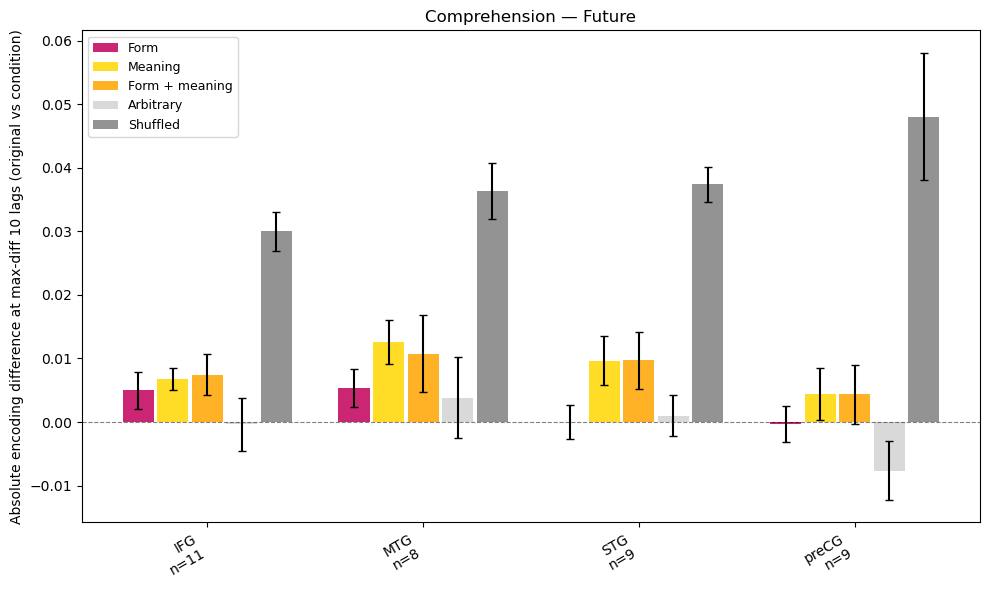


Contributing electrodes (comp/sentence) — total: 37
  IFG (n=11): ['EEGGR_59REF', 'EEGG_11REF', 'G19', 'G83', 'G88', 'LGA11', 'LGA19', 'LGB77', 'LGB80', 'LGB94', 'LGB96']
  MTG (n=8): ['EEGGR_15REF', 'EEGG_42REF', 'EEGG_44REF', 'LGA46', 'LGB119', 'LGB125', 'LGB126', 'O7']
  STG (n=9): ['EEGG_45REF', 'EEGG_47REF', 'EEGG_56REF', 'LGA38', 'LGB113', 'LGB114', 'LGB120', 'LGB121', 'LGB122']
  preCG (n=9): ['EEGG_06REF', 'EEGG_07REF', 'EEGG_14REF', 'G100', 'G101', 'G15', 'G16', 'G7', 'G8']
  All: ['EEGGR_15REF', 'EEGGR_59REF', 'EEGG_06REF', 'EEGG_07REF', 'EEGG_11REF', 'EEGG_14REF', 'EEGG_42REF', 'EEGG_44REF', 'EEGG_45REF', 'EEGG_47REF', 'EEGG_56REF', 'G100', 'G101', 'G15', 'G16', 'G19', 'G7', 'G8', 'G83', 'G88', 'LGA11', 'LGA19', 'LGA38', 'LGA46', 'LGB113', 'LGB114', 'LGB119', 'LGB120', 'LGB121', 'LGB122', 'LGB125', 'LGB126', 'LGB77', 'LGB80', 'LGB94', 'LGB96', 'O7']


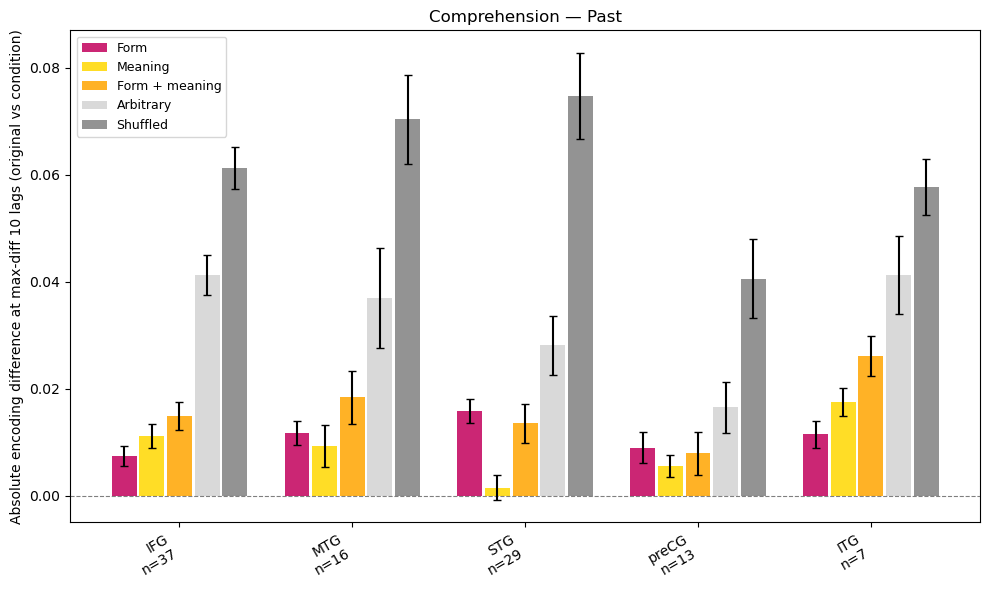


Contributing electrodes (comp/sentence2) — total: 102
  IFG (n=37): ['EEGGR_59REF', 'EEGGR_60REF', 'EEGGR_61REF', 'EEGG_09REF', 'EEGG_11REF', 'EEGG_17REF', 'EEGG_18REF', 'EEGIF_04REF', 'G17', 'G18', 'G19', 'G27', 'G33', 'G77', 'G78', 'G79', 'G81', 'G83', 'G84', 'G86', 'G87', 'G88', 'G92', 'G93', 'G95', 'G96', 'G97', 'LGA10', 'LGA11', 'LGA19', 'LGB107', 'LGB74', 'LGB77', 'LGB79', 'LGB80', 'LGB87', 'LGB96']
  MTG (n=16): ['EEGGR_15REF', 'EEGG_42REF', 'EEGG_43REF', 'EEGG_44REF', 'EEGG_53REF', 'EEGG_54REF', 'EEGG_62REF', 'G116', 'G62', 'LGA46', 'LGB116', 'LGB119', 'LGB125', 'LGB126', 'O6', 'O7']
  STG (n=29): ['EEGGR_22REF', 'EEGGR_30REF', 'EEGGR_38REF', 'EEGGR_46REF', 'EEGGR_54REF', 'EEGGR_55REF', 'EEGGR_62REF', 'EEGGR_63REF', 'EEGG_34REF', 'EEGG_35REF', 'EEGG_36REF', 'EEGG_37REF', 'EEGG_45REF', 'EEGG_46REF', 'EEGG_47REF', 'EEGG_48REF', 'EEGG_55REF', 'EEGG_56REF', 'G34', 'G41', 'LGA37', 'LGA38', 'LGA40', 'LGB112', 'LGB113', 'LGB114', 'LGB120', 'LGB121', 'LGB122']
  preCG (n=13): ['EEGGR_

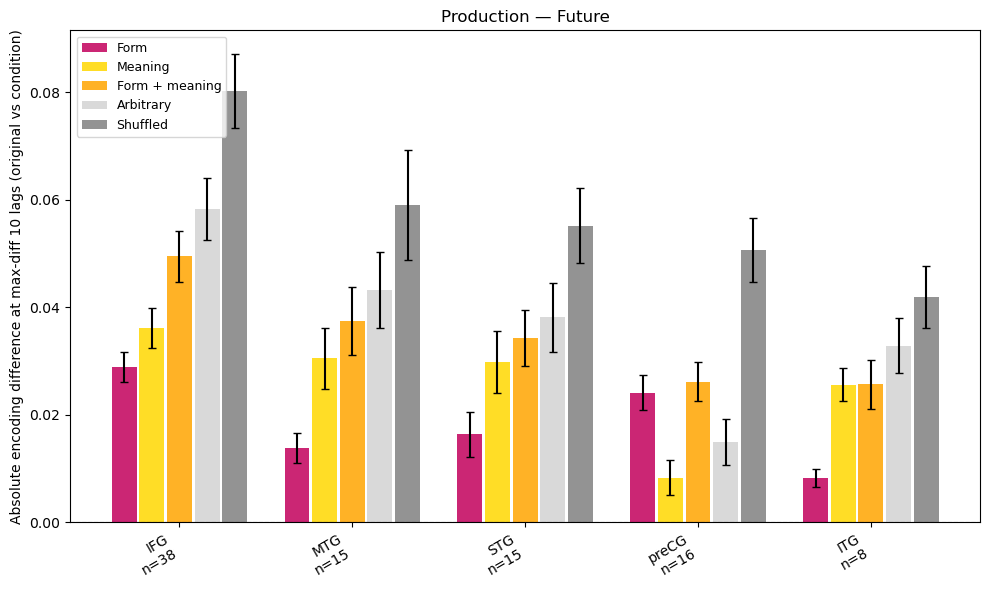


Contributing electrodes (prod/sentence) — total: 92
  IFG (n=38): ['EEGGR_58REF', 'EEGGR_59REF', 'EEGGR_60REF', 'EEGG_09REF', 'EEGG_11REF', 'EEGG_12REF', 'EEGG_17REF', 'EEGG_25REF', 'EEGG_26REF', 'EEGIF_04REF', 'G17', 'G18', 'G19', 'G20', 'G27', 'G77', 'G78', 'G79', 'G81', 'G83', 'G84', 'G86', 'G87', 'G88', 'G92', 'G93', 'G95', 'G96', 'G97', 'LGA10', 'LGA12', 'LGA19', 'LGB74', 'LGB79', 'LGB87', 'LGB88', 'LGB96', 'LGB97']
  MTG (n=15): ['EEGGR_15REF', 'EEGGR_23REF', 'EEGGR_31REF', 'EEGG_42REF', 'EEGG_43REF', 'EEGG_44REF', 'EEGG_51REF', 'EEGG_53REF', 'EEGG_54REF', 'EEGG_62REF', 'EEGG_64REF', 'LGB116', 'LGB119', 'O6', 'O7']
  STG (n=15): ['EEGAT_05REF', 'EEGGR_21REF', 'EEGGR_22REF', 'EEGGR_30REF', 'EEGGR_47REF', 'EEGGR_55REF', 'EEGGR_63REF', 'EEGG_34REF', 'EEGG_36REF', 'EEGG_45REF', 'EEGG_46REF', 'EEGG_47REF', 'EEGG_48REF', 'EEGG_55REF', 'EEGG_56REF']
  preCG (n=16): ['EEGGR_41REF', 'EEGGR_49REF', 'EEGGR_50REF', 'EEGG_05REF', 'EEGG_06REF', 'EEGG_07REF', 'EEGG_14REF', 'EEGG_20REF', 'EEGG_

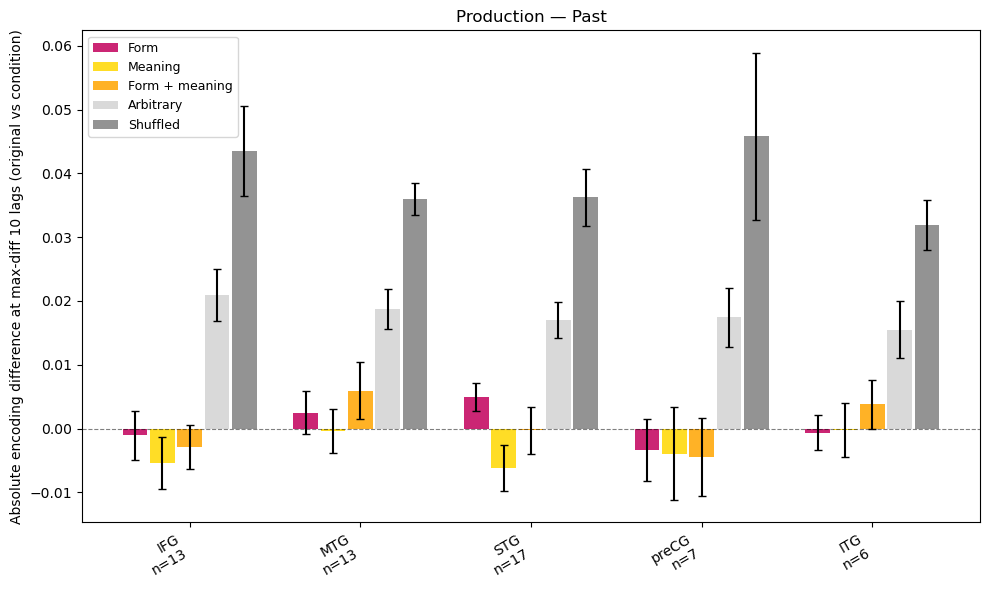


Contributing electrodes (prod/sentence2) — total: 56
  IFG (n=13): ['EEGG_25REF', 'EEGG_26REF', 'EEGIF_04REF', 'G19', 'G79', 'G81', 'G83', 'G87', 'LGA11', 'LGA19', 'LGB75', 'LGB81', 'LGB96']
  MTG (n=13): ['EEGAT_06REF', 'EEGGR_23REF', 'EEGGR_31REF', 'EEGG_42REF', 'EEGG_44REF', 'EEGG_51REF', 'EEGG_53REF', 'EEGG_62REF', 'EEGG_64REF', 'LGA46', 'LGB119', 'LGB126', 'O7']
  STG (n=17): ['EEGAT_05REF', 'EEGGR_21REF', 'EEGGR_38REF', 'EEGGR_47REF', 'EEGG_45REF', 'EEGG_47REF', 'EEGG_48REF', 'EEGG_55REF', 'EEGG_56REF', 'LGA37', 'LGA38', 'LGB112', 'LGB113', 'LGB114', 'LGB120', 'LGB121', 'LGB122']
  preCG (n=7): ['EEGGR_41REF', 'EEGG_07REF', 'G100', 'G101', 'G15', 'G16', 'LGA7']
  ITG (n=6): ['EEGG_58REF', 'EEGG_59REF', 'EEGMT_03REF', 'EEGMT_04REF', 'EEGPT_04REF', 'EEGPT_06REF']
  All: ['EEGAT_05REF', 'EEGAT_06REF', 'EEGGR_21REF', 'EEGGR_23REF', 'EEGGR_31REF', 'EEGGR_38REF', 'EEGGR_41REF', 'EEGGR_47REF', 'EEGG_07REF', 'EEGG_25REF', 'EEGG_26REF', 'EEGG_42REF', 'EEGG_44REF', 'EEGG_45REF', 'EEGG_47R

In [23]:
# Thresholds to use for the grouped ROI plots.
VALUE_THRESHOLDS = {'original': {'value': 0.1}}
BAND_THRESHOLDS = {
    'sentence': {'value': 0.03, 'cols': time_window_future_comp},
    'sentence2': {'value': 0.03, 'cols': time_window_past_comp},
}

print("=== Barplot settings ===")
print(f"  TOP_N_LAGS: 3  |  MIN_ELECS per ROI: 3")
print(f"  Joint threshold: original (joint-labeled) max >= {VALUE_THRESHOLDS['original']['value']} over [-1000..+1000] ms")
for band_label, info in BAND_THRESHOLDS.items():
    cols = info['cols']
    print(f"  Band '{band_label}': original ({band_label}-labeled) max >= {info['value']} over {cols[0]}..{cols[-1]} ms")
print("  Electrode requirement: present in ALL 6 conditions (original + 5 rephrases)")
print()
print("=== Per-panel time windows ===")
for (mode, label3), tw in [
    (('comp', 'sentence'),  time_windows[('comp', 'sentence')]),
    (('comp', 'sentence2'), time_windows[('comp', 'sentence2')]),
    (('prod', 'sentence'),  time_windows[('prod', 'sentence')]),
    (('prod', 'sentence2'), time_windows[('prod', 'sentence2')]),
]:
    print(f"  {mode}/{label3}: {tw[0]}..{tw[-1]} ms")
print()

# rois_to_plot = [
#     'IFG', 'MTG', 'STG', 'preCG', 'postCG',
#     'rostralmiddlefrontal', 'superiorfrontal',
#     'supramarginal', 'ITG', 'TP', 'fusiform',
# ]

rois_to_plot = [
    'IFG', 'MTG', 'STG', 'preCG', 'ITG',
]

plot_rephrase_barplot(
    'comp',
    'sentence',
    time_windows[('comp', 'sentence')],
    roi_results_c,
    rois_to_plot,
    args,
    titles,
    value_thresholds=VALUE_THRESHOLDS,
    band_thresholds=BAND_THRESHOLDS,
)

plot_rephrase_barplot(
    'comp',
    'sentence2',
    time_windows[('comp', 'sentence2')],
    roi_results_c,
    rois_to_plot,
    args,
    titles,
    value_thresholds=VALUE_THRESHOLDS,
    band_thresholds=BAND_THRESHOLDS,
)

plot_rephrase_barplot(
    'prod',
    'sentence',
    time_windows[('prod', 'sentence')],
    roi_results_p,
    rois_to_plot,
    args,
    titles,
    value_thresholds=VALUE_THRESHOLDS,
    band_thresholds=BAND_THRESHOLDS,
)

plot_rephrase_barplot(
    'prod',
    'sentence2',
    time_windows[('prod', 'sentence2')],
    roi_results_p,
    rois_to_plot,
    args,
    titles,
    value_thresholds=VALUE_THRESHOLDS,
    band_thresholds=BAND_THRESHOLDS,
)


## Old section

#### Double rephrase

In [ ]:
lag_cols = np.arange(-2000, 2001, 50)

time_window_past_comp = [int(c) for c in time_window_past_comp]
time_window_future_comp = [int(c) for c in time_window_future_comp]
time_window_past_prod = [int(c) for c in time_window_past_prod]
time_window_future_prod = [int(c) for c in time_window_future_prod]

# Make sure all datasets used for color OR size have lag columns aligned
for df in [
    original8_c, original8_p,
    parandom8_c, parandom8_p,
    original8_c, original8_p,
    original8_c, original8_c,   #same so should be all same size
]:
    n_lag_cols = len(df.columns) - 5
    new_columns = list(lag_cols[:n_lag_cols]) + list(df.columns[-5:])
    df.columns = new_columns

MIN_MAX_DIFF = 0.00
MIN_ENCODING_PCT = 30
MIN_PERCENT_CHANGE = 30
SCORE_MODE = "percent_change"       # color metric
SIZE_SCORE_MODE = "abs_diff"        # size metric for original vs double rephrase
SIZE_MIN = 50
SIZE_MAX = 99

percentiles = [0]
all_diffs_list = []

for p in percentiles:
    all_diffs_list.append(
        calc_max_diff_percentile(
            paraphrase8_c, random_content_word8_c, "sentence", time_window_future_comp,
            percentile=p, min_diff=MIN_MAX_DIFF, score_mode=SCORE_MODE,
            min_percent_change=MIN_PERCENT_CHANGE, min_encoding_pct=MIN_ENCODING_PCT,
            size_control=original8_c, size_reph=parandom8_c,
            size_label3_val="sentence", size_time_window_cols=time_window_future_comp,
            size_score_mode=SIZE_SCORE_MODE, size_min=SIZE_MIN, size_max=SIZE_MAX,
        ).assign(mode="comp")
    )
    all_diffs_list.append(
        calc_max_diff_percentile(
            paraphrase8_c, random_content_word8_c, "sentence2", time_window_past_comp,
            percentile=p, min_diff=MIN_MAX_DIFF, score_mode=SCORE_MODE,
            min_percent_change=MIN_PERCENT_CHANGE, min_encoding_pct=MIN_ENCODING_PCT,
            size_control=original8_c, size_reph=parandom8_c,
            size_label3_val="sentence2", size_time_window_cols=time_window_past_comp,
            size_score_mode=SIZE_SCORE_MODE, size_min=SIZE_MIN, size_max=SIZE_MAX,
        ).assign(mode="comp")
    )
    all_diffs_list.append(
        calc_max_diff_percentile(
            paraphrase8_p, random_content_word8_p, "sentence", time_window_future_prod,
            percentile=p, min_diff=MIN_MAX_DIFF, score_mode=SCORE_MODE,
            min_percent_change=MIN_PERCENT_CHANGE, min_encoding_pct=MIN_ENCODING_PCT,
            size_control=original8_p, size_reph=parandom8_p,
            size_label3_val="sentence", size_time_window_cols=time_window_future_prod,
            size_score_mode=SIZE_SCORE_MODE, size_min=SIZE_MIN, size_max=SIZE_MAX,
        ).assign(mode="prod")
    )
    all_diffs_list.append(
        calc_max_diff_percentile(
            paraphrase8_p, random_content_word8_p, "sentence2", time_window_past_prod,
            percentile=p, min_diff=MIN_MAX_DIFF, score_mode=SCORE_MODE,
            min_percent_change=MIN_PERCENT_CHANGE, min_encoding_pct=MIN_ENCODING_PCT,
            size_control=original8_p, size_reph=parandom8_p,
            size_label3_val="sentence2", size_time_window_cols=time_window_past_prod,
            size_score_mode=SIZE_SCORE_MODE, size_min=SIZE_MIN, size_max=SIZE_MAX,
        ).assign(mode="prod")
    )
    all_diffs_list.append(
        calc_max_diff_percentile(
            paraphrase8_c, random_content_word8_c, "joint", time_window_future_prod,
            percentile=p, min_diff=MIN_MAX_DIFF, score_mode=SCORE_MODE,
            min_percent_change=MIN_PERCENT_CHANGE, min_encoding_pct=MIN_ENCODING_PCT,
            size_control=original8_c, size_reph=parandom8_c,
            size_label3_val="joint", size_time_window_cols=time_window_future_prod,
            size_score_mode=SIZE_SCORE_MODE, size_min=SIZE_MIN, size_max=SIZE_MAX,
        ).assign(mode="comp")
    )
    all_diffs_list.append(
        calc_max_diff_percentile(
            paraphrase8_p, random_content_word8_p, "joint", time_window_past_prod,
            percentile=p, min_diff=MIN_MAX_DIFF, score_mode=SCORE_MODE,
            min_percent_change=MIN_PERCENT_CHANGE, min_encoding_pct=MIN_ENCODING_PCT,
            size_control=original8_p, size_reph=parandom8_p,
            size_label3_val="joint", size_time_window_cols=time_window_past_prod,
            size_score_mode=SIZE_SCORE_MODE, size_min=SIZE_MIN, size_max=SIZE_MAX,
        ).assign(mode="prod")
    )

all_diffs = pd.concat(all_diffs_list, ignore_index=True)

# Determine which plots are shown
diffs_comp_all = all_diffs[(all_diffs["mode"] == "comp") & (all_diffs["label3"] == "joint")].copy()
diffs_prod_all = all_diffs[(all_diffs["mode"] == "prod") & (all_diffs["label3"] == "joint")].copy()
diffs_comp_all = all_diffs[(all_diffs["mode"] == "comp") & (all_diffs["label3"] == "sentence")].copy()
diffs_prod_all = all_diffs[(all_diffs["mode"] == "prod") & (all_diffs["label3"] == "sentence")].copy()
diffs_comp_all = all_diffs[(all_diffs["mode"] == "comp") & (all_diffs["label3"] == "sentence2")].copy()
diffs_prod_all = all_diffs[(all_diffs["mode"] == "prod") & (all_diffs["label3"] == "sentence2")].copy()

effect_col = "score" if SCORE_MODE == "percent_change" else "max_diff"
if SCORE_MODE == "abs_diff":
    vmin, vmax = MIN_MAX_DIFF, 0.10
else:
    vmin, vmax = -99, 99

cmap = "hot"
for p in percentiles:
    diffs_past_comp_f = diffs_comp_all[
        (diffs_comp_all["percentile"] == p) & (diffs_comp_all["above_percentile"])
    ]
    diffs_future_prod_f = diffs_prod_all[
        (diffs_prod_all["percentile"] == p) & (diffs_prod_all["above_percentile"])
    ]

    pu.plot_effect_glassbrain(
        diffs_past_comp_f, cmap=cmap, effect_col=effect_col, vmin=vmin, vmax=vmax,
        title=f"paraphrase vs rcw (color), original vs double rephrase (size) - comprehension past | {SCORE_MODE}"
    )
    pu.plot_effect_glassbrain(
        diffs_future_prod_f, cmap=cmap, effect_col=effect_col, vmin=vmin, vmax=vmax,
        title=f"paraphrase vs rcw (color), original vs double rephrase (size) - production future | {SCORE_MODE}"
    )

    print(
        f"percentile={p:3d} | mode={SCORE_MODE} | "
        f"n electrodes: comp_past={len(diffs_past_comp_f)} prod_future={len(diffs_future_prod_f)}"
    )

#### Original vs double rephrase


In [ ]:
lag_cols = np.arange(-2000, 2001, 50)

time_windows = {
    ("comp", "sentence"): [int(c) for c in time_window_future_comp],
    ("comp", "sentence2"): [int(c) for c in time_window_past_comp],
    ("comp", "joint"): [int(c) for c in time_window_future_prod],
    ("prod", "sentence"): [int(c) for c in time_window_future_prod],
    ("prod", "sentence2"): [int(c) for c in time_window_past_prod],
    ("prod", "joint"): [int(c) for c in time_window_past_prod],
}

data_by_mode = {
    "comp": {
        "reph": original8_c,
        "ctrl": parandom8_c,
        "size_ctrl": original8_c,
        "size_reph": parandom8_c,
    },
    "prod": {
        "reph": original8_p,
        "ctrl": parandom8_p,
        "size_ctrl": original8_p,
        "size_reph": parandom8_p,
    },
}

# Align lag columns for all dataframes used by color and optional size
for df in [
    paraphrase8_c, paraphrase8_p,
    random_content_word8_c, random_content_word8_p,
    original8_c, original8_p,
    parandom8_c, parandom8_p,
]:
    n_lag_cols = len(df.columns) - 5
    df.columns = list(lag_cols[:n_lag_cols]) + list(df.columns[-5:])

# Global thresholds / conditions (defined once)
MIN_MAX_DIFF = 0.00
MIN_ENCODING_PCT = 30
MIN_PERCENT_CHANGE = 30
SCORE_MODE = "percent_change"
SIZE_SCORE_MODE = "abs_diff"
SIZE_MIN = 30
SIZE_MAX = 30
USE_SIZE_ENCODING = False

percentiles = [0]
plot_order = [
    ("comp", "joint", "comprehension joint"),
    ("comp", "sentence", "comprehension sentence"),
    ("comp", "sentence2", "comprehension sentence2"),
    ("prod", "joint", "production joint"),
    ("prod", "sentence", "production sentence"),
    ("prod", "sentence2", "production sentence2"),
]

cmap_by_label = {
    "sentence": "Greens",
    "sentence2": "Reds",
    "joint": "Blues",
}

effect_col = "score" if SCORE_MODE == "percent_change" else "max_diff"
vmin, vmax = (MIN_MAX_DIFF, 0.10) if SCORE_MODE == "abs_diff" else (-99, 99)

all_diffs = []
for p in percentiles:
    for mode, label3, _ in plot_order:
        cfg = data_by_mode[mode]
        kwargs = dict(
            percentile=p,
            min_diff=MIN_MAX_DIFF,
            score_mode=SCORE_MODE,
            min_percent_change=MIN_PERCENT_CHANGE,
            min_encoding_pct=MIN_ENCODING_PCT,
            size_score_mode=SIZE_SCORE_MODE,
            size_min=SIZE_MIN,
            size_max=SIZE_MAX,
        )
        if USE_SIZE_ENCODING:
            kwargs.update(
                size_control=cfg["size_ctrl"],
                size_reph=cfg["size_reph"],
                size_label3_val=label3,
                size_time_window_cols=time_windows[(mode, label3)],
            )

        diffs = calc_max_diff_percentile(
            cfg["reph"],
            cfg["ctrl"],
            label3,
            time_windows[(mode, label3)],
            **kwargs,
        ).assign(mode=mode)
        all_diffs.append(diffs)

all_diffs = pd.concat(all_diffs, ignore_index=True)

for p in percentiles:
    print(f"\npercentile={p:3d} | mode={SCORE_MODE} | size_encoding={USE_SIZE_ENCODING}")
    for mode, label3, desc in plot_order:
        diffs_f = all_diffs[
            (all_diffs["mode"] == mode)
            & (all_diffs["label3"] == label3)
            & (all_diffs["percentile"] == p)
            & (all_diffs["above_percentile"])
        ].copy()

        pu.plot_effect_glassbrain(
            diffs_f,
            cmap=cmap_by_label[label3],
            effect_col=effect_col,
            vmin=vmin,
            vmax=vmax,
            title=(
                "original vs double rephrase (color)"
                + (",  (size)" if USE_SIZE_ENCODING else "")
                + f" - {desc} | {SCORE_MODE}"
            ),
        )
        print(f"  {desc}: n electrodes={len(diffs_f)}")
        print(f"    electrodes: {format_electrode_list(diffs_f)}")

#### Paraphrase vs RCW

In [ ]:
import numpy as np
import pandas as pd
from matplotlib.colors import LinearSegmentedColormap

lag_cols = np.arange(-2000, 2001, 50)

# ---------- Settings ----------
SCORE_MODE = "percent_change"   # "percent_change" | "abs_diff"
SIZE_SCORE_MODE = "abs_diff"
USE_SIZE_ENCODING = True
percentiles = [0]
TOP_N_LAGS = 3  # use average over top-N lag indices when computing pair metrics

# Thresholds
MIN_MAX_DIFF = 0.00                # new threshold 1: max |diff| must be >= this between original and double rehprase
MIN_MAX_ENCODING_SCORE = None      # new threshold 2: max encoding score must be >= this (None disables)
MIN_ENCODING_PCT = 30              # existing relative threshold (0-100 or 0-1)
MIN_PERCENT_CHANGE = 30            # abs(percent_change) threshold
SIZE_MIN, SIZE_MAX = 1, 99

# ---------- Time windows ----------
time_windows = {
    ("comp", "sentence"):  [int(c) for c in time_window_future_comp],
    ("comp", "sentence2"): [int(c) for c in time_window_past_comp],
    ("comp", "joint"):     [int(c) for c in time_window_future_prod],
    ("prod", "sentence"):  [int(c) for c in time_window_future_prod],
    ("prod", "sentence2"): [int(c) for c in time_window_past_prod],
    ("prod", "joint"):     [int(c) for c in time_window_past_prod],
}

# ---------- Data sources ----------
data_by_mode = {
    "comp": {
        "reph": paraphrase8_c,
        "ctrl": random_content_word8_c,
        "size_ctrl": original8_c,
        "size_reph": parandom8_c,
    },
    "prod": {
        "reph": paraphrase8_p,
        "ctrl": random_content_word8_p,
        "size_ctrl": original8_p,
        "size_reph": parandom8_p,
    },
}

plot_order = [
    ("comp", "joint", "comprehension joint"),
    ("comp", "sentence", "comprehension sentence"),
    ("comp", "sentence2", "comprehension sentence2"),
    ("prod", "joint", "production joint"),
    ("prod", "sentence", "production sentence"),
    ("prod", "sentence2", "production sentence2"),
]

def base_white_black(name):
    return LinearSegmentedColormap.from_list(name, [base_color, "#ffffff", "#000000"], N=256)

cmap_by_label = {
    "sentence":  base_white_black("g_w_k"),
    "sentence2": base_white_black("r_w_k"),
    "joint":     base_white_black("b_w_k"),
}

# ---------- Align lag columns ----------
for df in [
    paraphrase8_c, paraphrase8_p,
    random_content_word8_c, random_content_word8_p,
    original8_c, original8_p,
    parandom8_c, parandom8_p,
]:
    n_lag_cols = len(df.columns) - 5
    df.columns = list(lag_cols[:n_lag_cols]) + list(df.columns[-5:])

# ---------- Base kwargs for calc ----------
base_kwargs = dict(
    score_mode=SCORE_MODE,
    size_score_mode=SIZE_SCORE_MODE,
    size_min=SIZE_MIN,
    size_max=SIZE_MAX,
    min_percent_change=MIN_PERCENT_CHANGE,
    min_encoding_pct=MIN_ENCODING_PCT,
    min_max_diff=MIN_MAX_DIFF,                    # new
    min_max_encoding_score=MIN_MAX_ENCODING_SCORE # new
)

# ---------- Compute diffs ----------
all_diffs = []
for p in percentiles:
    for mode, label3, _ in plot_order:
        cfg = data_by_mode[mode]
        tw = time_windows[(mode, label3)]

        kwargs = dict(base_kwargs, percentile=p)
        if USE_SIZE_ENCODING:
            kwargs.update(
                size_control=cfg["size_ctrl"],
                size_reph=cfg["size_reph"],
                size_label3_val=label3,
                size_time_window_cols=tw,
            )

        diffs = calc_max_diff_percentile(
            cfg["reph"],  # keep your original argument order
            cfg["ctrl"],
            label3,
            tw,
            **kwargs,
        ).assign(mode=mode)
        all_diffs.append(diffs)

all_diffs = pd.concat(all_diffs, ignore_index=True)

# ---------- Color scale ----------
effect_col = "score" if SCORE_MODE == "percent_change" else "max_diff"
if SCORE_MODE == "percent_change":
    vmin, vmax = -100, 100
else:
    vmin, vmax = MIN_MAX_DIFF, 0.10

# ---------- Plot ----------
colorbar_text_by_label = {
    "sentence": "Green = more structural sensitivity;\nBlack = more semantic sensitivity",
    "sentence2": "Red = more structural sensitivity;\nBlack = more semantic sensitivity",
    "joint": "Blue = more structural sensitivity;\nBlack = more semantic sensitivity",
}

for p in percentiles:
    print(f"\npercentile={p:3d} | mode={SCORE_MODE} | size_encoding={USE_SIZE_ENCODING}")
    for mode, label3, desc in plot_order:
        diffs_f = all_diffs[
            (all_diffs["mode"] == mode)
            & (all_diffs["label3"] == label3)
            & (all_diffs["percentile"] == p)
            & (all_diffs["above_percentile"]),
        ].copy()

        ax = pu.plot_effect_glassbrain(
            diffs_f,
            cmap=cmap_by_label[label3],
            effect_col=effect_col,
            vmin=vmin,
            vmax=vmax,
            title=(
                "paraphrase vs rcw (color)"
                + (", original vs double rephrase (size)" if USE_SIZE_ENCODING else "")
                + f" - {desc} | {SCORE_MODE}"
            ),
        )

        if ax is not None and ax.figure is not None and len(ax.figure.axes) > 1:
            cbar_ax = ax.figure.axes[-1]
            cbar_ax.set_ylabel(colorbar_text_by_label[label3], rotation=270, labelpad=18)
            cbar_ax.yaxis.set_label_position("right")

        print(f"  {desc}: n electrodes={len(diffs_f)}")


In [ ]:
import numpy as np
from matplotlib.colors import LinearSegmentedColormap

lag_cols = np.arange(-2000, 2001, 50)

# ---------- Settings ----------
MIN_MAX_DIFF = 0.00
MIN_ENCODING_PCT = 30
MIN_PERCENT_CHANGE = 30
SCORE_MODE = "percent_change"   # "percent_change" or "abs_diff"
SIZE_SCORE_MODE = "abs_diff"
SIZE_MIN = 1
SIZE_MAX = 99
USE_SIZE_ENCODING = True
percentiles = [0]

# ---------- Time windows ----------
time_windows = {
    ("comp", "sentence"):  [int(c) for c in time_window_future_comp],
    ("comp", "sentence2"): [int(c) for c in time_window_past_comp],
    ("comp", "joint"):     [int(c) for c in time_window_future_prod],
    ("prod", "sentence"):  [int(c) for c in time_window_future_prod],
    ("prod", "sentence2"): [int(c) for c in time_window_past_prod],
    ("prod", "joint"):     [int(c) for c in time_window_past_prod],
}

# ---------- Data sources ----------
data_by_mode = {
    "comp": {
        "reph": paraphrase8_c,
        "ctrl": random_content_word8_c,
        "size_ctrl": original8_c,
        "size_reph": parandom8_c,
    },
    "prod": {
        "reph": paraphrase8_p,
        "ctrl": random_content_word8_p,
        "size_ctrl": original8_p,
        "size_reph": parandom8_p,
    },
}

plot_order = [
    ("comp", "joint", "comprehension joint"),
    ("comp", "sentence", "comprehension sentence"),
    ("comp", "sentence2", "comprehension sentence2"),
    ("prod", "joint", "production joint"),
    ("prod", "sentence", "production sentence"),
    ("prod", "sentence2", "production sentence2"),
]

# base -> white -> black
def base_white_black(name):
    return LinearSegmentedColormap.from_list(name, [base_color, "#ffffff", "#000000"], N=256)

cmap_by_label = {
    "sentence":  base_white_black("g_w_k"),
    "sentence2": base_white_black("r_w_k"),
    "joint":     base_white_black("b_w_k"),
}

# ---------- Align lag columns ----------
for df in [
    paraphrase8_c, paraphrase8_p,
    random_content_word8_c, random_content_word8_p,
    original8_c, original8_p,
    parandom8_c, parandom8_p,
]:
    n_lag_cols = len(df.columns) - 5
    df.columns = list(lag_cols[:n_lag_cols]) + list(df.columns[-5:])

# ---------- Compute diffs ----------
all_diffs_list = []
for p in percentiles:
    for mode, label3, _ in plot_order:
        cfg = data_by_mode[mode]

        kwargs = dict(
            percentile=p,
            min_diff=MIN_MAX_DIFF,
            score_mode=SCORE_MODE,
            min_percent_change=MIN_PERCENT_CHANGE,
            min_encoding_pct=MIN_ENCODING_PCT,
            size_score_mode=SIZE_SCORE_MODE,
            size_min=SIZE_MIN,
            size_max=SIZE_MAX,
        )

        if USE_SIZE_ENCODING:
            kwargs.update(
                size_control=cfg["size_ctrl"],
                size_reph=cfg["size_reph"],
                size_label3_val=label3,
                size_time_window_cols=time_windows[(mode, label3)],
            )

        diffs = calc_max_diff_percentile(
            cfg["reph"],
            cfg["ctrl"],
            label3,
            time_windows[(mode, label3)],
            **kwargs,
        ).assign(mode=mode)

        all_diffs_list.append(diffs)

all_diffs = pd.concat(all_diffs_list, ignore_index=True)

# ---------- Color scale ----------
effect_col = "score" if SCORE_MODE == "percent_change" else "max_diff"

if SCORE_MODE == "percent_change":
    vals = all_diffs[effect_col].to_numpy(dtype=float)
    vals = vals[np.isfinite(vals)]
    bound = max(1.0, np.nanmax(np.abs(vals))) if vals.size else 1.0
    vmin, vmax = -100, 100   # keeps white at 0
else:
    vmin, vmax = MIN_MAX_DIFF, 0.10

# ---------- Plot ----------
# ---------- Plot ----------
for p in percentiles:
    print(f"\npercentile={p:3d} | mode={SCORE_MODE} | size_encoding={USE_SIZE_ENCODING}")
    for mode, label3, desc in plot_order:
        diffs_f = all_diffs[
            (all_diffs["mode"] == mode)
            & (all_diffs["label3"] == label3)
            & (all_diffs["percentile"] == p)
            & (all_diffs["above_percentile"])
        ].copy()

        # Draw plot first (no colorbar_label kwarg here)
        ax = pu.plot_effect_glassbrain(
            diffs_f,
            cmap=cmap_by_label[label3],
            effect_col=effect_col,
            vmin=vmin,
            vmax=vmax,
            title=(
                "paraphrase vs rcw (color)"
                + (", original vs double rephrase (size)" if USE_SIZE_ENCODING else "")
                + f" - {desc} | {SCORE_MODE}"
            ),
        )

        # Add colorbar label manually
        colorbar_text = {
            "sentence": "Green = more structural sensitivity; \n Black = more semantic sensitivity",
            "sentence2": "Red = more structural sensitivity; \n Black = more semantic sensitivity",
            "joint": "Blue = more structural sensitivity; \n Black = more semantic sensitivity",
        }[label3]

        if ax is not None and ax.figure is not None and len(ax.figure.axes) > 1:
            cbar_ax = ax.figure.axes[-1]  # colorbar is typically the last axis
            cbar_ax.set_ylabel(colorbar_text, rotation=270, labelpad=18)
            cbar_ax.yaxis.set_label_position("right")

        print(f"  {desc}: n electrodes={len(diffs_f)}")

### Plots for words

#### Synonym word

In [ ]:
import numpy as np
from matplotlib.colors import LinearSegmentedColormap

lag_cols = np.arange(-2000, 2001, 50)

# ---------- Settings ----------
MIN_MAX_DIFF = 0.00
MIN_ENCODING_PCT = 30
MIN_PERCENT_CHANGE = 30
SCORE_MODE = "percent_change"   # "percent_change" or "abs_diff"
SIZE_SCORE_MODE = "abs_diff"
SIZE_MIN = 30
SIZE_MAX = 30
USE_SIZE_ENCODING = False
percentiles = [0]

# ---------- Time windows ----------
time_windows = {
    ("comp", "sentence"):  [int(c) for c in time_window_future_comp],
    ("comp", "sentence2"): [int(c) for c in time_window_past_comp],
    ("comp", "joint"):     [int(c) for c in time_window_future_prod],
    ("prod", "sentence"):  [int(c) for c in time_window_future_prod],
    ("prod", "sentence2"): [int(c) for c in time_window_past_prod],
    ("prod", "joint"):     [int(c) for c in time_window_past_prod],
}

# ---------- Data sources ----------
data_by_mode = {
    "comp": {
        "reph": synonym8_c,
        "ctrl": original8_c,
        "size_ctrl": original8_c,
        "size_reph": original8_c,
    },
    "prod": {
        "reph": synonym8_p,
        "ctrl": original8_p,
        "size_ctrl": original8_p,
        "size_reph": original8_p,
    },
}

plot_order = [
    ("comp", "joint", "comprehension joint"),
    ("comp", "sentence", "comprehension sentence"),
    ("comp", "sentence2", "comprehension sentence2"),
    ("prod", "joint", "production joint"),
    ("prod", "sentence", "production sentence"),
    ("prod", "sentence2", "production sentence2"),
]

# base -> white -> black
def base_white_black(name):
    return LinearSegmentedColormap.from_list(name, [base_color, "#ffffff", "#000000"], N=256)

cmap_by_label = {
    "sentence":  base_white_black("g_w_k"),
    "sentence2": base_white_black("r_w_k"),
    "joint":     base_white_black("b_w_k"),
}

# ---------- Align lag columns ----------
for df in [
    synonym8_c, synonym8_p,
    original8_c, original8_p,
    original8_c, original8_p,
    original8_c, original8_p,
]:
    n_lag_cols = len(df.columns) - 5
    df.columns = list(lag_cols[:n_lag_cols]) + list(df.columns[-5:])

# ---------- Compute diffs ----------
all_diffs_list = []
for p in percentiles:
    for mode, label3, _ in plot_order:
        cfg = data_by_mode[mode]

        kwargs = dict(
            percentile=p,
            min_diff=MIN_MAX_DIFF,
            score_mode=SCORE_MODE,
            min_percent_change=MIN_PERCENT_CHANGE,
            min_encoding_pct=MIN_ENCODING_PCT,
            size_score_mode=SIZE_SCORE_MODE,
            size_min=SIZE_MIN,
            size_max=SIZE_MAX,
        )

        if USE_SIZE_ENCODING:
            kwargs.update(
                size_control=cfg["size_ctrl"],
                size_reph=cfg["size_reph"],
                size_label3_val=label3,
                size_time_window_cols=time_windows[(mode, label3)],
            )

        diffs = calc_max_diff_percentile(
            cfg["reph"],
            cfg["ctrl"],
            label3,
            time_windows[(mode, label3)],
            **kwargs,
        ).assign(mode=mode)

        all_diffs_list.append(diffs)

all_diffs = pd.concat(all_diffs_list, ignore_index=True)

# ---------- Color scale ----------
effect_col = "score" if SCORE_MODE == "percent_change" else "max_diff"

if SCORE_MODE == "percent_change":
    vals = all_diffs[effect_col].to_numpy(dtype=float)
    vals = vals[np.isfinite(vals)]
    bound = max(1.0, np.nanmax(np.abs(vals))) if vals.size else 1.0
    vmin, vmax = -100, 100   # keeps white at 0
else:
    vmin, vmax = MIN_MAX_DIFF, 0.10

# ---------- Plot ----------
for p in percentiles:
    print(f"\npercentile={p:3d} | mode={SCORE_MODE} | size_encoding={USE_SIZE_ENCODING}")
    for mode, label3, desc in plot_order:
        diffs_f = all_diffs[
            (all_diffs["mode"] == mode)
            & (all_diffs["label3"] == label3)
            & (all_diffs["percentile"] == p)
            & (all_diffs["above_percentile"])
        ].copy()

        pu.plot_effect_glassbrain(
            diffs_f,
            cmap=cmap_by_label[label3],
            effect_col=effect_col,
            vmin=vmin,
            vmax=vmax,
            title=(
                "Original vs synonym"
                + (", original vs double rephrase (size)" if USE_SIZE_ENCODING else "")
                + f" - {desc} | {SCORE_MODE}"
            ),
        )

        print(f"  {desc}: n electrodes={len(diffs_f)}")

#### RCW word 

In [ ]:
import numpy as np
from matplotlib.colors import LinearSegmentedColormap

lag_cols = np.arange(-2000, 2001, 50)

# ---------- Settings ----------
MIN_MAX_DIFF = 0.00
MIN_ENCODING_PCT = 30
MIN_PERCENT_CHANGE = 30
SCORE_MODE = "percent_change"   # "percent_change" or "abs_diff"
SIZE_SCORE_MODE = "abs_diff"
SIZE_MIN = 30
SIZE_MAX = 30
USE_SIZE_ENCODING = False
percentiles = [0]

# ---------- Time windows ----------
time_windows = {
    ("comp", "sentence"):  [int(c) for c in time_window_future_comp],
    ("comp", "sentence2"): [int(c) for c in time_window_past_comp],
    ("comp", "joint"):     [int(c) for c in time_window_future_prod],
    ("prod", "sentence"):  [int(c) for c in time_window_future_prod],
    ("prod", "sentence2"): [int(c) for c in time_window_past_prod],
    ("prod", "joint"):     [int(c) for c in time_window_past_prod],
}

# ---------- Data sources ----------
data_by_mode = {
    "comp": {
        "reph": random_content_words8_c,
        "ctrl": original8_c,
        "size_ctrl": original8_c,
        "size_reph": original8_c,
    },
    "prod": {
        "reph": random_content_words8_p,
        "ctrl": original8_p,
        "size_ctrl": original8_p,
        "size_reph": original8_p,
    },
}

plot_order = [
    ("comp", "joint", "comprehension joint"),
    ("comp", "sentence", "comprehension sentence"),
    ("comp", "sentence2", "comprehension sentence2"),
    ("prod", "joint", "production joint"),
    ("prod", "sentence", "production sentence"),
    ("prod", "sentence2", "production sentence2"),
]

# base -> white -> black
def base_white_black(name):
    return LinearSegmentedColormap.from_list(name, [base_color, "#ffffff", "#000000"], N=256)

cmap_by_label = {
    "sentence":  base_white_black("g_w_k"),
    "sentence2": base_white_black("r_w_k"),
    "joint":     base_white_black("b_w_k"),
}

# ---------- Align lag columns ----------
for df in [
    synonym8_c, synonym8_p,
    original8_c, original8_p,
    original8_c, original8_p,
    original8_c, original8_p,
]:
    n_lag_cols = len(df.columns) - 5
    df.columns = list(lag_cols[:n_lag_cols]) + list(df.columns[-5:])

# ---------- Compute diffs ----------
all_diffs_list = []
for p in percentiles:
    for mode, label3, _ in plot_order:
        cfg = data_by_mode[mode]

        kwargs = dict(
            percentile=p,
            min_diff=MIN_MAX_DIFF,
            score_mode=SCORE_MODE,
            min_percent_change=MIN_PERCENT_CHANGE,
            min_encoding_pct=MIN_ENCODING_PCT,
            size_score_mode=SIZE_SCORE_MODE,
            size_min=SIZE_MIN,
            size_max=SIZE_MAX,
        )

        if USE_SIZE_ENCODING:
            kwargs.update(
                size_control=cfg["size_ctrl"],
                size_reph=cfg["size_reph"],
                size_label3_val=label3,
                size_time_window_cols=time_windows[(mode, label3)],
            )

        diffs = calc_max_diff_percentile(
            cfg["reph"],
            cfg["ctrl"],
            label3,
            time_windows[(mode, label3)],
            **kwargs,
        ).assign(mode=mode)

        all_diffs_list.append(diffs)

all_diffs = pd.concat(all_diffs_list, ignore_index=True)

# ---------- Color scale ----------
effect_col = "score" if SCORE_MODE == "percent_change" else "max_diff"

if SCORE_MODE == "percent_change":
    vals = all_diffs[effect_col].to_numpy(dtype=float)
    vals = vals[np.isfinite(vals)]
    bound = max(1.0, np.nanmax(np.abs(vals))) if vals.size else 1.0
    vmin, vmax = -100, 100   # keeps white at 0
else:
    vmin, vmax = MIN_MAX_DIFF, 0.10

# ---------- Plot ----------
for p in percentiles:
    print(f"\npercentile={p:3d} | mode={SCORE_MODE} | size_encoding={USE_SIZE_ENCODING}")
    for mode, label3, desc in plot_order:
        diffs_f = all_diffs[
            (all_diffs["mode"] == mode)
            & (all_diffs["label3"] == label3)
            & (all_diffs["percentile"] == p)
            & (all_diffs["above_percentile"])
        ].copy()

        pu.plot_effect_glassbrain(
            diffs_f,
            cmap=cmap_by_label[label3],
            effect_col=effect_col,
            vmin=vmin,
            vmax=vmax,
            title=(
                "Original vs rcw"
                + (", original vs double rephrase (size)" if USE_SIZE_ENCODING else "")
                + f" - {desc} | {SCORE_MODE}"
            ),
        )

        print(f"  {desc}: n electrodes={len(diffs_f)}")

## Directional brainplots

In [ ]:
lag_cols = np.arange(-2000,2051,50)

for df in [gpt_random_content_word8_c, gpt_random_content_word8_p, gpt_paraphrase8_c, gpt_paraphrase8_p]:
    n_lag_cols = len(df.columns) - 5
    new_columns = list(lag_cols[:n_lag_cols]) + list(df.columns[-5:])
    df.columns = new_columns

In [ ]:
time_window_0_500ms = [col for col in lag_cols if 0 <= col <= 500]
time_window_neg500_0ms = [col for col in lag_cols if -500 <= col <= 0]
full_window = [col for col in lag_cols if -2000 <= col <= 2000]
smaller_window = [col for col in lag_cols if -500 <= col <= 500]

### Predicting for comprehension: future (sent), -500-0ms

In [ ]:
# Import the directional function with baseline filtering
from tfsplt_directional_diff import calc_max_diff_directional_with_baseline

MIN_ABS_DIFF = 0.01
MIN_BASELINE_SCORE = 0.02  # Absolute threshold for baseline encoding

diffs_dir = calc_max_diff_directional_with_baseline(
    random_content_word8_c, 
    paraphrase8_c, 
    "sentence", 
    time_window_neg500_0ms,
    percentile=0,
    min_abs_diff=MIN_ABS_DIFF,
    min_baseline_score=MIN_BASELINE_SCORE
)

print(f"Total electrodes after baseline filter: {len(diffs_dir)}")
print(f"Baseline scores - Cond1: median={diffs_dir['max_control_score'].median():.3f}, max={diffs_dir['max_control_score'].max():.3f}")
print(f"Baseline scores - Cond2: median={diffs_dir['max_reph_score'].median():.3f}, max={diffs_dir['max_reph_score'].max():.3f}")

# Plot with diverging colormap
ax = pu.plot_effect_glassbrain(
    diffs_dir,
    cmap=mcolors.LinearSegmentedColormap.from_list("GreenToBlue", ["darkblue", "white", "darkgreen"]),
    effect_col="max_diff",
    vmin=-0.05,
    vmax=0.05,
)
# Label the colorbar (last axes in the figure)
cbar_ax = ax.figure.axes[-1]
cbar_ax.set_ylabel("max Δ(rcw, paraphrase); Pearson's r of future band; (-500ms - 0ms)", fontsize=9)


### Memory for production: past (sent2), 0-500ms

In [ ]:
# Import the directional function with baseline filtering
from tfsplt_directional_diff import calc_max_diff_directional_with_baseline

MIN_ABS_DIFF = 0.01
MIN_BASELINE_SCORE = 0.03  # Absolute threshold for baseline encoding

# Use exactly like calc_max_diff_percentile, but with min_abs_diff instead of min_diff
diffs_dir = calc_max_diff_directional_with_baseline(
    random_content_word8_p, 
    paraphrase8_p, 
    "sentence2", 
    time_window_0_500ms,
    percentile=0,
    min_abs_diff=MIN_ABS_DIFF,  # Filter by absolute magnitude, keep sign
    min_baseline_score=MIN_BASELINE_SCORE  # NEW: Exclude weakly-encoding electrodes
)

print(f"Total electrodes after baseline filter: {len(diffs_dir)}")
print(f"Baseline scores - Cond1: median={diffs_dir['max_control_score'].median():.3f}, max={diffs_dir['max_control_score'].max():.3f}")
print(f"Baseline scores - Cond2: median={diffs_dir['max_reph_score'].median():.3f}, max={diffs_dir['max_reph_score'].max():.3f}")

# Plot with diverging colormap
ax = pu.plot_effect_glassbrain(
    diffs_dir,
    cmap=mcolors.LinearSegmentedColormap.from_list("GreenToBlue", ["darkblue", "white", "darkgreen"]),
    effect_col="max_diff",
    vmin=-0.05,
    vmax=0.05,
)
# Label the colorbar (last axes in the figure)
cbar_ax = ax.figure.axes[-1]
cbar_ax.set_ylabel("max Δ(rcw, paraphrase); Pearson's r of past band; (0ms - 500ms)", fontsize=9)


### Processing/memory for comprehension: past (sent2), 0-500ms

In [ ]:
# Import the directional function with baseline filtering
from tfsplt_directional_diff import calc_max_diff_directional_with_baseline

MIN_ABS_DIFF = 0.02
MIN_BASELINE_SCORE = 0.03  # Absolute threshold for baseline encoding

# Use exactly like calc_max_diff_percentile, but with min_abs_diff instead of min_diff
diffs_dir = calc_max_diff_directional_with_baseline(
    random_content_word8_c, 
    paraphrase8_c, 
    "sentence2", 
    time_window_0_500ms,
    percentile=0,
    min_abs_diff=MIN_ABS_DIFF,  # Filter by absolute magnitude, keep sign
    min_baseline_score=MIN_BASELINE_SCORE  # NEW: Exclude weakly-encoding electrodes
)

print(f"Total electrodes after baseline filter: {len(diffs_dir)}")
print(f"Baseline scores - Cond1: median={diffs_dir['max_control_score'].median():.3f}, max={diffs_dir['max_control_score'].max():.3f}")
print(f"Baseline scores - Cond2: median={diffs_dir['max_reph_score'].median():.3f}, max={diffs_dir['max_reph_score'].max():.3f}")

# Plot with diverging colormap
ax = pu.plot_effect_glassbrain(
    diffs_dir,
    cmap=mcolors.LinearSegmentedColormap.from_list("GreenToBlue", ["darkblue", "white", "darkgreen"]),
    effect_col="max_diff",
    vmin=-0.05,
    vmax=0.05,
)
# Label the colorbar (last axes in the figure)
cbar_ax = ax.figure.axes[-1]
cbar_ax.set_ylabel("max Δ(rcw, paraphrase); Pearson's r of past band; (0ms - 500ms)", fontsize=9)


### Planning for production: future (sent1), -500-0ms


In [ ]:
# Import the directional function with baseline filtering
from tfsplt_directional_diff import calc_max_diff_directional_with_baseline

MIN_ABS_DIFF = 0.01
MIN_BASELINE_SCORE = 0.03  # Absolute threshold for baseline encoding

# Use exactly like calc_max_diff_percentile, but with min_abs_diff instead of min_diff
diffs_dir = calc_max_diff_directional_with_baseline(
    random_content_word8_p, 
    paraphrase8_p, 
    "sentence", 
    time_window_neg500_0ms,
    percentile=0,
    min_abs_diff=MIN_ABS_DIFF,  # Filter by absolute magnitude, keep sign
    min_baseline_score=MIN_BASELINE_SCORE  # NEW: Exclude weakly-encoding electrodes
)

print(f"Total electrodes after baseline filter: {len(diffs_dir)}")
print(f"Baseline scores - Cond1: median={diffs_dir['max_control_score'].median():.3f}, max={diffs_dir['max_control_score'].max():.3f}")
print(f"Baseline scores - Cond2: median={diffs_dir['max_reph_score'].median():.3f}, max={diffs_dir['max_reph_score'].max():.3f}")

# Plot with diverging colormap
ax = pu.plot_effect_glassbrain(
    diffs_dir,
    cmap=mcolors.LinearSegmentedColormap.from_list("GreenToBlue", ["darkblue", "white", "darkgreen"]),
    effect_col="max_diff",
    vmin=-0.05,
    vmax=0.05,
)
# Label the colorbar (last axes in the figure)
cbar_ax = ax.figure.axes[-1]
cbar_ax.set_ylabel("max Δ(rcw, paraphrase); Pearson's r of future band; (-500ms - 0ms)", fontsize=9)


### Joint, full timewindow, production

In [ ]:
# Import the directional function with baseline filtering
from tfsplt_directional_diff import calc_max_diff_directional_with_baseline

MIN_ABS_DIFF = 0.045
MIN_BASELINE_SCORE = 0.03  # Absolute threshold for baseline encoding

# Use exactly like calc_max_diff_percentile, but with min_abs_diff instead of min_diff
diffs_dir = calc_max_diff_directional_with_baseline(
    gpt_random_content_word8_p, 
    gpt_paraphrase8_p, 
    # Rcw - paraphrase -> if positive, higher encoding score for paraphrase -> less sensitive to structural changes, more sens to semantical changes
    "joint", 
    smaller_window,
    percentile=0,
    min_abs_diff=MIN_ABS_DIFF,  # Filter by absolute magnitude, keep sign
    min_baseline_score=MIN_BASELINE_SCORE  # NEW: Exclude weakly-encoding electrodes
)

print(f"Total electrodes after baseline filter: {len(diffs_dir)}")
print(f"Baseline scores - Cond1: median={diffs_dir['max_control_score'].median():.3f}, max={diffs_dir['max_control_score'].max():.3f}")
print(f"Baseline scores - Cond2: median={diffs_dir['max_reph_score'].median():.3f}, max={diffs_dir['max_reph_score'].max():.3f}")

# Plot with diverging colormap
ax = pu.plot_effect_glassbrain(
    diffs_dir,
    cmap=mcolors.LinearSegmentedColormap.from_list("GreenToBlue", ["darkblue", "white", "darkgreen"]),
    effect_col="max_diff",
    vmin=-0.08,
    vmax=0.08,
)
# Label the colorbar (last axes in the figure)
cbar_ax = ax.figure.axes[-1]
cbar_ax.set_ylabel("Semantic vs structural perturbation effect" , fontsize=9)


title=f"Directional Difference, production (joint): \n Random content word vs Paraphrase, -2000-2000ms \n  Cntx 8, Baseline>={MIN_BASELINE_SCORE}, min_abs_diff={MIN_ABS_DIFF}\n (green=more sensitive to semantic changes, Blue=more sensitive to structural changes)"

### Joint, full timewindow, comprehension

In [ ]:
# Import the directional function with baseline filtering
from tfsplt_directional_diff import calc_max_diff_directional_with_baseline

MIN_ABS_DIFF = 0.04
MIN_BASELINE_SCORE = 0.03  # Absolute threshold for baseline encoding

# Use exactly like calc_max_diff_percentile, but with min_abs_diff instead of min_diff
diffs_dir = calc_max_diff_directional_with_baseline(
    gpt_random_content_word8_c, 
    gpt_paraphrase8_c, 
    "joint", 
    smaller_window,
    # percentile=0.8,
    min_abs_diff=MIN_ABS_DIFF,  # Filter by absolute magnitude, keep sign
    min_baseline_score=MIN_BASELINE_SCORE  # NEW: Exclude weakly-encoding electrodes
)

print(f"Total electrodes after baseline filter: {len(diffs_dir)}")
print(f"Baseline scores - Cond1: median={diffs_dir['max_control_score'].median():.3f}, max={diffs_dir['max_control_score'].max():.3f}")
print(f"Baseline scores - Cond2: median={diffs_dir['max_reph_score'].median():.3f}, max={diffs_dir['max_reph_score'].max():.3f}")

# Plot with diverging colormap
ax = pu.plot_effect_glassbrain(
    diffs_dir,
    cmap=mcolors.LinearSegmentedColormap.from_list("GreenToBlue", ["darkblue", "white", "darkgreen"]),
    effect_col="max_diff",
    vmin=-0.08,
    vmax=0.08,
)
# Label the colorbar (last axes in the figure)
cbar_ax = ax.figure.axes[-1]
cbar_ax.set_ylabel("Semantic vs structural perturbation effect" , fontsize=9)


title=f"Directional Difference, comprehension (joint): \n Random content word vs Paraphrase, -2000-2000ms \n  Cntx 8, Baseline>={MIN_BASELINE_SCORE}, min_abs_diff={MIN_ABS_DIFF}\n (Red=more sensitive to semantic changes, Blue=more sensitive to structural changes)"

## Differential Sensitivity Analysis: Electrodes Sensitive to One Rephrasing Method but Not Another

This section identifies and plots electrodes that show sensitivity to one rephrasing method but not the other:
- Electrodes sensitive to **paraphrasing** (vs. original) but **NOT** to random content words (vs. original)
- Electrodes sensitive to **random content words** (vs. original) but **NOT** to paraphrasing (vs. original)

In [ ]:
# FIXED CELL 1: Core functions for differential sensitivity analysis

def compute_electrode_diffs(df_original, df_condition, label3_val, time_cols):
    """
    Compute max absolute difference between original and condition for each electrode.
    Returns DataFrame with electrode info and differences.
    """
    # Filter by label3
    df_orig = df_original[df_original["label3"] == label3_val].copy()
    df_cond = df_condition[df_condition["label3"] == label3_val].copy()
    
    # Determine merge key
    if "subject_electrode" in df_orig.columns and "subject_electrode" in df_cond.columns:
        merge_on = "subject_electrode"
    else:
        merge_on = ["subject", "electrode"]
    
    # Merge
    merged = df_orig.merge(df_cond, on=merge_on, suffixes=("_orig", "_cond"))
    
    results = []
    for _, row in merged.iterrows():
        # Get values for time window
        orig_cols = [f"{c}_orig" if f"{c}_orig" in row.index else None for c in time_cols]
        cond_cols = [f"{c}_cond" if f"{c}_cond" in row.index else None for c in time_cols]
        
        # Filter out None
        orig_vals = np.array([row[c] for c in orig_cols if c and c in row.index])
        cond_vals = np.array([row[c] for c in cond_cols if c and c in row.index])
        
        if len(orig_vals) == 0 or len(cond_vals) == 0:
            continue
            
        # Compute differences
        diffs = np.abs(orig_vals - cond_vals)
        max_diff = float(np.max(diffs))
        max_diff_idx = int(np.argmax(diffs))
        max_diff_lag = time_cols[max_diff_idx] if max_diff_idx < len(time_cols) else np.nan
        
        # Extract electrode info
        if isinstance(merge_on, list):
            subject = row.get("subject_orig", row.get("subject", np.nan))
            electrode = row.get("electrode_orig", row.get("electrode", np.nan))
            subject_electrode = f"{subject}_{electrode}"
        else:
            subject_electrode = row[merge_on]
            subject = str(subject_electrode).split("_")[0] if pd.notna(subject_electrode) else np.nan
            electrode = row.get("electrode_orig", row.get("electrode_cond", np.nan))
        
        roi = row.get("roi_orig", row.get("roi_cond", row.get("roi", "unknown")))
        
        results.append({
            "subject": subject,
            "electrode": electrode,
            "subject_electrode": subject_electrode,
            "roi": roi,
            "label3": label3_val,
            "max_abs_diff": max_diff,
            "max_diff_lag": max_diff_lag,
        })
    
    return pd.DataFrame(results)


def filter_electrodes_by_sensitivity(
    df_original,
    df_condition_A,
    df_condition_B, 
    label3_val,
    time_cols,
    filter_condition="A",
    min_threshold=0.02,
):
    """
    Filter electrodes that are sensitive to one condition (vs original).
    Returns those electrodes with their response to BOTH conditions.
    """
    # Compute differences for both conditions
    diffs_A = compute_electrode_diffs(df_original, df_condition_A, label3_val, time_cols)
    diffs_B = compute_electrode_diffs(df_original, df_condition_B, label3_val, time_cols)
    
    if len(diffs_A) == 0 or len(diffs_B) == 0:
        print(f"WARNING: No matching electrodes (diffs_A: {len(diffs_A)}, diffs_B: {len(diffs_B)})")
        return pd.DataFrame()
    
    # Rename columns
    diffs_A = diffs_A.rename(columns={
        "max_abs_diff": "max_abs_diff_A",
        "max_diff_lag": "max_diff_lag_A"
    })
    diffs_B = diffs_B.rename(columns={
        "max_abs_diff": "max_abs_diff_B",
        "max_diff_lag": "max_diff_lag_B"
    })
    
    # FIXED: Only select columns that exist
    cols_to_keep_from_B = ["subject_electrode", "max_abs_diff_B", "max_diff_lag_B"]
    merged = diffs_A.merge(
        diffs_B[cols_to_keep_from_B],
        on="subject_electrode",
        how="inner"
    )
    
    # Filter based on specified condition
    if filter_condition == "A":
        filtered = merged[merged["max_abs_diff_A"] >= min_threshold].copy()
        filtered["max_diff"] = filtered["max_abs_diff_A"]
    else:
        filtered = merged[merged["max_abs_diff_B"] >= min_threshold].copy()
        filtered["max_diff"] = filtered["max_abs_diff_B"]
    
    return filtered


def filter_electrodes_differential_sensitivity(
    df_original,
    df_condition_A,
    df_condition_B,
    label3_val,
    time_cols,
    sensitive_to="A",
    min_sensitive=0.02,
    max_not_sensitive=0.02,
):
    """
    Filter electrodes sensitive to one condition but NOT the other.
    Returns electrodes with responses to BOTH conditions.
    """
    # Compute differences for both conditions
    diffs_A = compute_electrode_diffs(df_original, df_condition_A, label3_val, time_cols)
    diffs_B = compute_electrode_diffs(df_original, df_condition_B, label3_val, time_cols)
    
    if len(diffs_A) == 0 or len(diffs_B) == 0:
        print(f"WARNING: No matching electrodes (diffs_A: {len(diffs_A)}, diffs_B: {len(diffs_B)})")
        return pd.DataFrame()
    
    # Rename columns
    diffs_A = diffs_A.rename(columns={
        "max_abs_diff": "max_abs_diff_A", 
        "max_diff_lag": "max_diff_lag_A"
    })
    diffs_B = diffs_B.rename(columns={
        "max_abs_diff": "max_abs_diff_B",
        "max_diff_lag": "max_diff_lag_B"
    })
    
    # FIXED: Only select columns that exist
    cols_to_keep_from_B = ["subject_electrode", "max_abs_diff_B", "max_diff_lag_B"]
    merged = diffs_A.merge(
        diffs_B[cols_to_keep_from_B],
        on="subject_electrode",
        how="inner"
    )
    
    # Apply differential filtering
    if sensitive_to == "A":
        filtered = merged[
            (merged["max_abs_diff_A"] >= min_sensitive) &
            (merged["max_abs_diff_B"] <= max_not_sensitive)
        ].copy()
        filtered["max_diff"] = filtered["max_abs_diff_A"]
    else:
        filtered = merged[
            (merged["max_abs_diff_B"] >= min_sensitive) &
            (merged["max_abs_diff_A"] <= max_not_sensitive)
        ].copy()
        filtered["max_diff"] = filtered["max_abs_diff_B"]
    
    return filtered

print("Functions loaded successfully!")

In [ ]:
# CELL 2: User-friendly wrapper with configurable parameters

def analyze_and_plot_cross_condition(
    # Data
    df_original,
    df_condition_A,
    df_condition_B,
    # Analysis parameters
    band="sentence",                    # "sentence", "sentence2", "word", "joint"
    mode="comp",                        # "comp" or "prod" - FOR DISPLAY/DEFAULTS ONLY!
    filter_type="sensitive_to_A",      # "sensitive_to_A", "sensitive_to_B", "differential_A_not_B", "differential_B_not_A"
    # Thresholds
    min_sensitive=0.02,
    max_not_sensitive=0.02,
    # Timeframe
    time_window_cols=None,
    # Labels
    condition_A_name="Condition A",
    condition_B_name="Condition B",
    # Plotting
    plot=True,
    cmap="hot",
    vmin=None,
    vmax=0.10,
):
    """
    Comprehensive function to analyze and plot cross-condition sensitivity.
    
    Parameters:
    -----------
    df_original, df_condition_A, df_condition_B : pd.DataFrame
        DataFrames with encoding results.
        *** CRITICAL: comp vs prod use DIFFERENT SPEAKERS/EMBEDDINGS ***
        - For comprehension: use original8_c, paraphrase8_c, random_content_word8_c
        - For production: use original8_p, paraphrase8_p, random_content_word8_p
        The 'mode' parameter only affects default time windows and plot titles!
    
    band : str
        Which band to analyze: "sentence" (future), "sentence2" (past), "word", or "joint"
    
    mode : str
        "comp" or "prod" - Used for default time windows and plot titles.
        Does NOT select the dataframes - you must pass the correct _c or _p dataframes!
    
    filter_type : str
        - "sensitive_to_A": electrodes sensitive to condition A (any threshold)
        - "sensitive_to_B": electrodes sensitive to condition B (any threshold)
        - "differential_A_not_B": sensitive to A but NOT B (strict differential)
        - "differential_B_not_A": sensitive to B but NOT A (strict differential)
    
    min_sensitive : float
        Threshold for being considered "sensitive"
    
    max_not_sensitive : float
        Threshold for being considered "not sensitive" (for differential analysis)
    
    time_window_cols : list or None
        Custom time window as list of lag values (e.g., [0, 50, 100, ..., 500]).
        If None, uses defaults based on band and mode.
        Example custom windows:
            lag_cols = np.arange(-2000, 2051, 50)
            time_window_0_500ms = [col for col in lag_cols if 0 <= col <= 500]
            time_window_neg500_0ms = [col for col in lag_cols if -500 <= col <= 0]
            full_window = [col for col in lag_cols if -2000 <= col <= 2000]
    """
    # Determine time window if not specified
    if time_window_cols is None:
        lag_cols = np.arange(-2000, 2051, 50)
        if mode == "comp":
            if band == "sentence":
                time_window_cols = [c for c in lag_cols if c <= 500]  # Future
            elif band == "sentence2":
                time_window_cols = [c for c in lag_cols if c >= 0]    # Past
            else:  # word or joint
                time_window_cols = lag_cols  # Full window
        else:  # prod
            if band == "sentence":
                time_window_cols = [c for c in lag_cols if c <= 0]    # Future
            elif band == "sentence2":
                time_window_cols = [c for c in lag_cols if c >= -500] # Past
            else:  # word or joint
                time_window_cols = lag_cols  # Full window
    
    # Perform filtering based on type
    if filter_type == "sensitive_to_A":
        result_df = filter_electrodes_by_sensitivity(
            df_original, df_condition_A, df_condition_B,
            label3_val=band,
            time_cols=time_window_cols,
            filter_condition="A",
            min_threshold=min_sensitive
        )
        title_desc = f"Sensitive to {condition_A_name} (≥{min_sensitive})"
        
    elif filter_type == "sensitive_to_B":
        result_df = filter_electrodes_by_sensitivity(
            df_original, df_condition_A, df_condition_B,
            label3_val=band,
            time_cols=time_window_cols,
            filter_condition="B",
            min_threshold=min_sensitive
        )
        title_desc = f"Sensitive to {condition_B_name} (≥{min_sensitive})"
        
    elif filter_type == "differential_A_not_B":
        result_df = filter_electrodes_differential_sensitivity(
            df_original, df_condition_A, df_condition_B,
            label3_val=band,
            time_cols=time_window_cols,
            sensitive_to="A",
            min_sensitive=min_sensitive,
            max_not_sensitive=max_not_sensitive
        )
        title_desc = f"Sensitive to {condition_A_name} (≥{min_sensitive}) but NOT {condition_B_name} (≤{max_not_sensitive})"
        
    else:  # differential_B_not_A
        result_df = filter_electrodes_differential_sensitivity(
            df_original, df_condition_A, df_condition_B,
            label3_val=band,
            time_cols=time_window_cols,
            sensitive_to="B",
            min_sensitive=min_sensitive,
            max_not_sensitive=max_not_sensitive
        )
        title_desc = f"Sensitive to {condition_B_name} (≥{min_sensitive}) but NOT {condition_A_name} (≤{max_not_sensitive})"
    
    # Print summary
    mode_str = "Comprehension" if mode == "comp" else "Production"
    time_desc = f"{time_window_cols[0]} to {time_window_cols[-1]}ms"
    
    print("=" * 80)
    print(f"{mode_str} | Band: {band} | Time window: {time_desc}")
    print(f"Filter: {title_desc}")
    print(f"Found {len(result_df)} electrodes")
    
    if len(result_df) > 0:
        print(f"\nROI Distribution:")
        print(result_df['roi'].value_counts())
        
        print(f"\n{condition_A_name} differences:")
        print(f"  Mean: {result_df['max_abs_diff_A'].mean():.4f}, Median: {result_df['max_abs_diff_A'].median():.4f}, Max: {result_df['max_abs_diff_A'].max():.4f}")
        
        print(f"\n{condition_B_name} differences:")
        print(f"  Mean: {result_df['max_abs_diff_B'].mean():.4f}, Median: {result_df['max_abs_diff_B'].median():.4f}, Max: {result_df['max_abs_diff_B'].max():.4f}")
        
        # Plot if requested
        if plot:
            if vmin is None:
                vmin = min_sensitive
                
            full_title = f"{mode_str} ({band}, {time_desc})\n{title_desc}\nn={len(result_df)} electrodes"
            
            pu.plot_effect_glassbrain(
                result_df,
                cmap=cmap,
                effect_col="max_diff",
                vmin=vmin,
                vmax=vmax,
                title=full_title
            )
    else:
        print("\nNo electrodes found meeting criteria")
    
    print("=" * 80)
    
    return result_df

print("Wrapper function loaded successfully!")

In [ ]:
# CRITICAL: Rename lag columns to numeric values (REQUIRED before using the functions!)
lag_cols = np.arange(-2000, 2051, 50)

# Rename columns for ALL dataframes you'll use
for df in [original8_c, original8_p, random_content_word8_c, random_content_word8_p, paraphrase8_c, paraphrase8_p]:
    n_lag_cols = len(df.columns) - 5
    new_columns = list(lag_cols[:n_lag_cols]) + list(df.columns[-5:])
    df.columns = new_columns

print("✓ Columns renamed to numeric lag values")

### Comprehension, joint, full window, not sensitive to paraphrase, sensitive to rcw

In [ ]:
# Define custom time windows
lag_cols = np.arange(-2000, 2051, 50)
time_window_0_500ms = [col for col in lag_cols if 0 <= col <= 500]
time_window_neg500_0ms = [col for col in lag_cols if -500 <= col <= 0]
full_window = [col for col in lag_cols if -2000 <= col <= 2000]

# Use custom window
result = analyze_and_plot_cross_condition(
    df_original=original8_c,
    df_condition_A=paraphrase8_c,
    df_condition_B=random_content_word8_c,
    mode="comp",
    band="joint",
    filter_type="differential_A_not_B",
    time_window_cols=full_window, 
    condition_A_name="Paraphrase",
    condition_B_name="Random",
    min_sensitive=0.03,
    max_not_sensitive=0.025
)

### Comprehension, joint, full window, not sensitive to rcw, sensitive to paraphrase

In [ ]:
# Define custom time windows
lag_cols = np.arange(-2000, 2051, 50)
time_window_0_500ms = [col for col in lag_cols if 0 <= col <= 500]
time_window_neg500_0ms = [col for col in lag_cols if -500 <= col <= 0]
full_window = [col for col in lag_cols if -2000 <= col <= 2000]

# Use custom window
result = analyze_and_plot_cross_condition(
    df_original=original8_c,
    df_condition_A=paraphrase8_c,
    df_condition_B=random_content_word8_c,
    mode="comp",
    band="joint",
    filter_type="differential_B_not_A",
    time_window_cols=full_window, 
    condition_A_name="Paraphrase",
    condition_B_name="Random",
    min_sensitive=0.03,
    max_not_sensitive=0.025
)

### Production, joint, full window, not sensitive to paraphrase, sensitive to rcw

In [ ]:
# Define custom time windows
lag_cols = np.arange(-2000, 2051, 50)
time_window_0_500ms = [col for col in lag_cols if 0 <= col <= 500]
time_window_neg500_0ms = [col for col in lag_cols if -500 <= col <= 0]
full_window = [col for col in lag_cols if -2000 <= col <= 2000]

# Use custom window
result = analyze_and_plot_cross_condition(
    df_original=original8_p,
    df_condition_A=paraphrase8_p,
    df_condition_B=random_content_word8_p,
    mode="prod",
    band="joint",
    filter_type="differential_A_not_B",
    time_window_cols=full_window, 
    condition_A_name="Paraphrase",
    condition_B_name="Random",
    min_sensitive=0.03,
    max_not_sensitive=0.025
)

### Production, joint, full window, not sensitive to rcw, sensitive to paraphrase

In [ ]:
# Define custom time windows
lag_cols = np.arange(-2000, 2051, 50)
time_window_0_500ms = [col for col in lag_cols if 0 <= col <= 500]
time_window_neg500_0ms = [col for col in lag_cols if -500 <= col <= 0]
full_window = [col for col in lag_cols if -2000 <= col <= 2000]

# Use custom window
result = analyze_and_plot_cross_condition(
    df_original=original8_p,
    df_condition_A=paraphrase8_p,
    df_condition_B=random_content_word8_p,
    mode="prod",
    band="joint",
    filter_type="differential_B_not_A",
    time_window_cols=full_window, 
    condition_A_name="Paraphrase",
    condition_B_name="Random",
    min_sensitive=0.03,
    max_not_sensitive=0.025
)

## ROI-level statistical analysis

In [ ]:
def roi_permutation_test(
    roi_results,
    idx_orig,
    idx_reph,
    band,
    lag_array,
    rois,
    time_window=(-500, 500),
    k=5,
    n_perm=10000,
    rng_seed=42,
):
    """
    ROI-level sign-flip permutation test.

    Returns
    -------
    pd.DataFrame  columns: roi, n_elecs, T_obs, T_sem, p_value
        T_obs : mean of per-electrode top-k signed delta
        T_sem : SEM of those per-electrode values (for error bars)
    """
    rng = np.random.default_rng(rng_seed)
    lag_array = np.asarray(lag_array)

    win_mask = (lag_array >= time_window[0]) & (lag_array <= time_window[1])
    win_idx  = np.where(win_mask)[0]
    if len(win_idx) == 0:
        raise ValueError(
            f"No lags found in time_window {time_window}. "
            f"lag_array spans [{lag_array.min()}, {lag_array.max()}]."
        )

    records = []

    for roi in rois:
        df_o = roi_results.get((idx_orig, band, roi))
        df_r = roi_results.get((idx_reph, band, roi))

        if df_o is None or df_r is None or df_o.empty or df_r.empty:
            continue

        n_lag = min(len(lag_array), df_o.shape[1], df_r.shape[1])
        mat_o = df_o.iloc[:, :n_lag].to_numpy(dtype=float)
        mat_r = df_r.iloc[:, :n_lag].to_numpy(dtype=float)

        if "electrode" in df_o.columns and "electrode" in df_r.columns:
            elec_o = df_o["electrode"].to_numpy()
            elec_r = df_r["electrode"].to_numpy()
            shared = np.intersect1d(elec_o, elec_r)
            if len(shared) == 0:
                continue
            pos_o = [np.where(elec_o == e)[0][0] for e in shared]
            pos_r = [np.where(elec_r == e)[0][0] for e in shared]
            mat_o = mat_o[pos_o]
            mat_r = mat_r[pos_r]
        else:
            n = min(mat_o.shape[0], mat_r.shape[0])
            mat_o, mat_r = mat_o[:n], mat_r[:n]

        n_elecs = mat_o.shape[0]
        if n_elecs == 0:
            continue

        delta_win = mat_r[:, win_idx] - mat_o[:, win_idx]   # (n_elecs, n_win_lags)
        k_eff = min(k, delta_win.shape[1])
        top_idx = np.argpartition(np.abs(delta_win), -k_eff, axis=1)[:, -k_eff:]
        rows    = np.arange(n_elecs)[:, None]
        delta_e = delta_win[rows, top_idx].mean(axis=1)      # (n_elecs,)

        T_obs = float(delta_e.mean())
        T_sem = float(delta_e.std(ddof=1) / np.sqrt(n_elecs)) if n_elecs > 1 else 0.0

        signs  = rng.choice(np.array([-1.0, 1.0]), size=(n_perm, n_elecs))
        null_T = (signs * delta_e[np.newaxis, :]).mean(axis=1)
        p_value = float(np.mean(np.abs(null_T) >= np.abs(T_obs)))

        records.append(dict(roi=roi, n_elecs=n_elecs, T_obs=T_obs, T_sem=T_sem, p_value=p_value))

    return pd.DataFrame(records)


def plot_reph_perm_barplot(
    args,
    roi_results,
    titles,
    line_type="joint",
    time_window=None,
    rois_to_plot=None,
    exclude_labels=None,
    mode="comp",
    ymin=None,
    ymax=None,
    min_elecs=3,
    k=5,
    n_perm=10000,
    rng_seed=42,
    save=False,
    res_dir=None,
    precomputed_stats=None,
):
    """
    Grouped bar chart of rephrasing-method effects per ROI using the
    sign-flip permutation test statistic T_obs.

    Groups    = ROIs (x-axis)
    Bars      = rephrasing methods (dataset index 1..N vs 0 = original)
    Height    = T_obs (mean top-k signed Δ per electrode)
    Errorbars = SEM of per-electrode top-k signed deltas
    Stars     = permutation p_value  (* p<.05  ** p<.01  *** p<.001)

    Parameters
    ----------
    precomputed_stats : dict or None
        Optional dict mapping idx_reph -> pd.DataFrame (output of roi_permutation_test).
        Must include a 'T_sem' column. If provided, skips re-running permutations.
    time_window : None or (lag_min, lag_max)
        Lag window in ms. If None, uses full lags_plt range.
    k, n_perm, rng_seed
        Passed to roi_permutation_test when precomputed_stats is not given.
    """
    dataset_indices = sorted({kk[0] for kk in roi_results.keys()})
    orig_idx     = 0
    reph_indices = [i for i in dataset_indices if i != orig_idx]
    reph_labels  = [titles[i] for i in reph_indices]

    if exclude_labels:
        pairs = [(i, l) for i, l in zip(reph_indices, reph_labels) if l not in exclude_labels]
        reph_indices, reph_labels = (list(x) for x in zip(*pairs)) if pairs else ([], [])

    all_rois = sorted({kk[2] for kk in roi_results.keys()})
    if rois_to_plot is not None:
        all_rois = [r for r in rois_to_plot if r in all_rois]

    if time_window is None:
        tw = (float(args.lags["lags_plt"][0]), float(args.lags["lags_plt"][-1]))
    else:
        tw = time_window

    # ── Run (or reuse) permutation tests ──────────────────────────────────
    perm_results = {}
    for idx in reph_indices:
        if precomputed_stats and idx in precomputed_stats:
            perm_results[idx] = precomputed_stats[idx]
        else:
            perm_results[idx] = roi_permutation_test(
                roi_results = roi_results,
                idx_orig    = orig_idx,
                idx_reph    = idx,
                band        = line_type,
                lag_array   = args.lags["lags_all"],
                rois        = all_rois,
                time_window = tw,
                k           = k,
                n_perm      = n_perm,
                rng_seed    = rng_seed,
            )

    # ── Collect bar data: bars_data[roi][label] = (T_obs, T_sem, p_value, n_elecs) ──
    bars_data = {}
    for roi in all_rois:
        roi_entry = {}
        for idx, label in zip(reph_indices, reph_labels):
            df_res = perm_results.get(idx)
            if df_res is None or df_res.empty:
                continue
            row = df_res[df_res["roi"] == roi]
            if row.empty or int(row.iloc[0]["n_elecs"]) < min_elecs:
                continue
            roi_entry[label] = (
                float(row.iloc[0]["T_obs"]),
                float(row.iloc[0]["T_sem"]),
                float(row.iloc[0]["p_value"]),
                int(row.iloc[0]["n_elecs"]),
            )
        if roi_entry:
            bars_data[roi] = roi_entry

    if not bars_data:
        print("No data to plot — check roi_results, line_type, and rois_to_plot.")
        return

    rois_with_data = list(bars_data.keys())
    n_rois = len(rois_with_data)
    n_bars = len(reph_labels)

    all_dataset_colors = [args.colors[i] for i in dataset_indices if i != orig_idx]
    colors = [all_dataset_colors[i - 1] for i in reph_indices]

    fig, ax = plt.subplots(figsize=(max(10, n_rois * 1.8), 6))
    bar_w   = 0.8 / n_bars
    group_x = np.arange(n_rois)

    def _stars(p):
        if p < 0.001: return "***"
        if p < 0.01:  return "**"
        if p < 0.05:  return "*"
        return ""

    for bi, label in enumerate(reph_labels):
        offsets = group_x + (bi - n_bars / 2 + 0.5) * bar_w
        t_vals, sems, ps = [], [], []
        for roi in rois_with_data:
            entry = bars_data[roi].get(label, (0.0, 0.0, 1.0, 0))
            t_vals.append(entry[0]); sems.append(entry[1]); ps.append(entry[2])

        ax.bar(
            offsets, t_vals, width=bar_w * 0.9, color=colors[bi],
            label=label, alpha=0.85,
            yerr=sems, capsize=3,
            error_kw={"elinewidth": 1.2, "capthick": 1.2},
        )

        for x, t, s, p_val in zip(offsets, t_vals, sems, ps):
            star = _stars(p_val)
            if star:
                y_pos = (t + s + 0.0002) if t >= 0 else (t - s - 0.0004)
                ax.text(x, y_pos, star, ha="center", va="bottom", fontsize=8)

    ax.axhline(0, color="k", lw=0.8, ls="--", alpha=0.5)
    ax.set_xticks(group_x)
    ax.set_xticklabels(rois_with_data, rotation=30, ha="right", fontsize=10)
    ax.set_ylabel(
        f"T_obs (mean top-{k} signed Δ per electrode); {line_type} (reph − original)",
        fontsize=11,
    )
    mode_full = "Comprehension" if mode == "comp" else "Production"
    window_str = f"{tw[0]}–{tw[1]} ms"
    ax.set_title(
        f"{mode_full} — {line_type} — {window_str}   |   k={k}   n_perm={n_perm:,}\n"
        f"* p<.05   ** p<.01   *** p<.001  (sign-flip permutation)   errorbars=SEM",
        fontsize=10,
    )
    ax.legend(loc="lower left", frameon=True, fontsize=9)

    if ymin is not None or ymax is not None:
        ax.set_ylim(ymin, ymax)
    plt.tight_layout()
    if save and res_dir:
        plt.savefig(
            f"{res_dir}/reph_perm_barplot_{mode}_{line_type}.jpeg",
            bbox_inches="tight",
        )
        plt.close(fig)
    else:
        plt.show()

In [ ]:
# ── RUN BLOCK — copy and change parameters ───────────────────────────────
IDX_ORIG    = 0           # 0=Original 1=Synonym 2=Paraphrase 3=Random 4=Doublereph 5=Baseline
IDX_REPH    = 1
BAND        = "joint"  # 'joint' | 'word' | 'sentence' | 'sentence2'
TIME_WINDOW = (-500, 500)   # ms, inclusive
K           = 10
N_PERM      = 10_000

res_c = roi_permutation_test(roi_results_c, IDX_ORIG, IDX_REPH, BAND, args.lags["lags_all"], args.rois, TIME_WINDOW, K, N_PERM)
res_p = roi_permutation_test(roi_results_p, IDX_ORIG, IDX_REPH, BAND, args.lags["lags_all"], args.rois, TIME_WINDOW, K, N_PERM)

print(f"\n{'═'*62}")
print(f"  {titles[IDX_ORIG]}  vs  {titles[IDX_REPH]}  |  band={BAND}  |  window={TIME_WINDOW}")
print(f"{'═'*62}")
for mode_label, df_res in [("COMPREHENSION", res_c), ("PRODUCTION", res_p)]:
    if df_res.empty:
        print(f"\n  [{mode_label}]  No results."); continue
    print(f"\n  [{mode_label}]")
    print(f"  {'ROI':<26} {'n':>5}  {'T_obs':>9}  {'p_value':>9}  sig")
    print(f"  {'─'*26}  {'─'*5}  {'─'*9}  {'─'*9}  ───")
    for _, row in df_res.sort_values("p_value").iterrows():
        s = "**" if row.p_value < 0.01 else "*" if row.p_value < 0.05 else "ns"
        print(f"  {row.roi:<26} {int(row.n_elecs):>5}  {row.T_obs:>+9.5f}  {row.p_value:>9.4f}  {s}")

In [ ]:
# ── RUN BLOCK — copy and change parameters ───────────────────────────────
IDX_ORIG    = 0           # 0=Original 1=Synonym 2=Paraphrase 3=Random 4=Doublereph 5=Baseline
IDX_REPH    = 2
BAND        = "joint"  # 'joint' | 'word' | 'sentence' | 'sentence2'
TIME_WINDOW = (-500, 500)   # ms, inclusive
K           = 5
N_PERM      = 10_000

res_c = roi_permutation_test(roi_results_c, IDX_ORIG, IDX_REPH, BAND, args.lags["lags_all"], args.rois, TIME_WINDOW, K, N_PERM)
res_p = roi_permutation_test(roi_results_p, IDX_ORIG, IDX_REPH, BAND, args.lags["lags_all"], args.rois, TIME_WINDOW, K, N_PERM)

print(f"\n{'═'*62}")
print(f"  {titles[IDX_ORIG]}  vs  {titles[IDX_REPH]}  |  band={BAND}  |  window={TIME_WINDOW}")
print(f"{'═'*62}")
for mode_label, df_res in [("COMPREHENSION", res_c), ("PRODUCTION", res_p)]:
    if df_res.empty:
        print(f"\n  [{mode_label}]  No results."); continue
    print(f"\n  [{mode_label}]")
    print(f"  {'ROI':<26} {'n':>5}  {'T_obs':>9}  {'p_value':>9}  sig")
    print(f"  {'─'*26}  {'─'*5}  {'─'*9}  {'─'*9}  ───")
    for _, row in df_res.sort_values("p_value").iterrows():
        s = "**" if row.p_value < 0.01 else "*" if row.p_value < 0.05 else "ns"
        print(f"  {row.roi:<26} {int(row.n_elecs):>5}  {row.T_obs:>+9.5f}  {row.p_value:>9.4f}  {s}")

In [ ]:
# ── RUN BLOCK — copy and change parameters ───────────────────────────────
IDX_ORIG    = 0           # 0=Original 1=Synonym 2=Paraphrase 3=Random 4=Doublereph 5=Baseline
IDX_REPH    = 3
BAND        = "joint"  # 'joint' | 'word' | 'sentence' | 'sentence2'
TIME_WINDOW = (-500, 500)   # ms, inclusive
K           = 5
N_PERM      = 10_000

res_c = roi_permutation_test(roi_results_c, IDX_ORIG, IDX_REPH, BAND, args.lags["lags_all"], args.rois, TIME_WINDOW, K, N_PERM)
res_p = roi_permutation_test(roi_results_p, IDX_ORIG, IDX_REPH, BAND, args.lags["lags_all"], args.rois, TIME_WINDOW, K, N_PERM)

print(f"\n{'═'*62}")
print(f"  {titles[IDX_ORIG]}  vs  {titles[IDX_REPH]}  |  band={BAND}  |  window={TIME_WINDOW}")
print(f"{'═'*62}")
for mode_label, df_res in [("COMPREHENSION", res_c), ("PRODUCTION", res_p)]:
    if df_res.empty:
        print(f"\n  [{mode_label}]  No results."); continue
    print(f"\n  [{mode_label}]")
    print(f"  {'ROI':<26} {'n':>5}  {'T_obs':>9}  {'p_value':>9}  sig")
    print(f"  {'─'*26}  {'─'*5}  {'─'*9}  {'─'*9}  ───")
    for _, row in df_res.sort_values("p_value").iterrows():
        s = "**" if row.p_value < 0.01 else "*" if row.p_value < 0.05 else "ns"
        print(f"  {row.roi:<26} {int(row.n_elecs):>5}  {row.T_obs:>+9.5f}  {row.p_value:>9.4f}  {s}")

In [ ]:
# ── RUN BLOCK — copy and change parameters ───────────────────────────────
IDX_ORIG    = 0           # 0=Original 1=Synonym 2=Paraphrase 3=Random 4=Doublereph 5=Baseline
IDX_REPH    = 4
BAND        = "joint"  # 'joint' | 'word' | 'sentence' | 'sentence2'
TIME_WINDOW = (-500, 500)   # ms, inclusive
K           = 5
N_PERM      = 10_000

res_c = roi_permutation_test(roi_results_c, IDX_ORIG, IDX_REPH, BAND, args.lags["lags_all"], args.rois, TIME_WINDOW, K, N_PERM)
res_p = roi_permutation_test(roi_results_p, IDX_ORIG, IDX_REPH, BAND, args.lags["lags_all"], args.rois, TIME_WINDOW, K, N_PERM)

print(f"\n{'═'*62}")
print(f"  {titles[IDX_ORIG]}  vs  {titles[IDX_REPH]}  |  band={BAND}  |  window={TIME_WINDOW}")
print(f"{'═'*62}")
for mode_label, df_res in [("COMPREHENSION", res_c), ("PRODUCTION", res_p)]:
    if df_res.empty:
        print(f"\n  [{mode_label}]  No results."); continue
    print(f"\n  [{mode_label}]")
    print(f"  {'ROI':<26} {'n':>5}  {'T_obs':>9}  {'p_value':>9}  sig")
    print(f"  {'─'*26}  {'─'*5}  {'─'*9}  {'─'*9}  ───")
    for _, row in df_res.sort_values("p_value").iterrows():
        s = "**" if row.p_value < 0.01 else "*" if row.p_value < 0.05 else "ns"
        print(f"  {row.roi:<26} {int(row.n_elecs):>5}  {row.T_obs:>+9.5f}  {row.p_value:>9.4f}  {s}")

### Rcw vs paraphrase

In [ ]:
# ── RUN BLOCK — copy and change parameters ───────────────────────────────
IDX_ORIG    = 3           # 0=Original 1=Synonym 2=Paraphrase 3=Random 4=Doublereph 5=Baseline
IDX_REPH    = 2
BAND        = "joint"  # 'joint' | 'word' | 'sentence' | 'sentence2'
TIME_WINDOW = (-500, 500)   # ms, inclusive
K           = 5
N_PERM      = 10_000

res_c = roi_permutation_test(roi_results_c, IDX_ORIG, IDX_REPH, BAND, args.lags["lags_all"], args.rois, TIME_WINDOW, K, N_PERM)
res_p = roi_permutation_test(roi_results_p, IDX_ORIG, IDX_REPH, BAND, args.lags["lags_all"], args.rois, TIME_WINDOW, K, N_PERM)

print(f"\n{'═'*62}")
print(f"  {titles[IDX_ORIG]}  vs  {titles[IDX_REPH]}  |  band={BAND}  |  window={TIME_WINDOW}")
print(f"{'═'*62}")
for mode_label, df_res in [("COMPREHENSION", res_c), ("PRODUCTION", res_p)]:
    if df_res.empty:
        print(f"\n  [{mode_label}]  No results."); continue
    print(f"\n  [{mode_label}]")
    print(f"  {'ROI':<26} {'n':>5}  {'T_obs':>9}  {'p_value':>9}  sig")
    print(f"  {'─'*26}  {'─'*5}  {'─'*9}  {'─'*9}  ───")
    for _, row in df_res.sort_values("p_value").iterrows():
        s = "**" if row.p_value < 0.01 else "*" if row.p_value < 0.05 else "ns"
        print(f"  {row.roi:<26} {int(row.n_elecs):>5}  {row.T_obs:>+9.5f}  {row.p_value:>9.4f}  {s}")

In [ ]:
# ── RUN BLOCK — copy and change parameters ───────────────────────────────
IDX_ORIG    = 2           # 0=Original 1=Synonym 2=Paraphrase 3=Random 4=Doublereph 5=Baseline
IDX_REPH    = 3
BAND        = "sentence"  # 'joint' | 'word' | 'sentence' | 'sentence2'
TIME_WINDOW = (-500, 0)   # ms, inclusive
K           = 5
N_PERM      = 10_000

res_c = roi_permutation_test(roi_results_c, IDX_ORIG, IDX_REPH, BAND, args.lags["lags_all"], args.rois, TIME_WINDOW, K, N_PERM)
res_p = roi_permutation_test(roi_results_p, IDX_ORIG, IDX_REPH, BAND, args.lags["lags_all"], args.rois, TIME_WINDOW, K, N_PERM)

print(f"\n{'═'*62}")
print(f"  {titles[IDX_ORIG]}  vs  {titles[IDX_REPH]}  |  band={BAND}  |  window={TIME_WINDOW}")
print(f"{'═'*62}")
for mode_label, df_res in [("COMPREHENSION", res_c), ("PRODUCTION", res_p)]:
    if df_res.empty:
        print(f"\n  [{mode_label}]  No results."); continue
    print(f"\n  [{mode_label}]")
    print(f"  {'ROI':<26} {'n':>5}  {'T_obs':>9}  {'p_value':>9}  sig")
    print(f"  {'─'*26}  {'─'*5}  {'─'*9}  {'─'*9}  ───")
    for _, row in df_res.sort_values("p_value").iterrows():
        s = "**" if row.p_value < 0.01 else "*" if row.p_value < 0.05 else "ns"
        print(f"  {row.roi:<26} {int(row.n_elecs):>5}  {row.T_obs:>+9.5f}  {row.p_value:>9.4f}  {s}")

In [ ]:
# ── RUN BLOCK — copy and change parameters ───────────────────────────────
IDX_ORIG    = 2           # 0=Original 1=Synonym 2=Paraphrase 3=Random 4=Doublereph 5=Baseline
IDX_REPH    = 3
BAND        = "sentence2"  # 'joint' | 'word' | 'sentence' | 'sentence2'
TIME_WINDOW = (0, 500)   # ms, inclusive
K           = 5
N_PERM      = 10_000

res_c = roi_permutation_test(roi_results_c, IDX_ORIG, IDX_REPH, BAND, args.lags["lags_all"], args.rois, TIME_WINDOW, K, N_PERM)
res_p = roi_permutation_test(roi_results_p, IDX_ORIG, IDX_REPH, BAND, args.lags["lags_all"], args.rois, TIME_WINDOW, K, N_PERM)

print(f"\n{'═'*62}")
print(f"  {titles[IDX_ORIG]}  vs  {titles[IDX_REPH]}  |  band={BAND}  |  window={TIME_WINDOW}")
print(f"{'═'*62}")
for mode_label, df_res in [("COMPREHENSION", res_c), ("PRODUCTION", res_p)]:
    if df_res.empty:
        print(f"\n  [{mode_label}]  No results."); continue
    print(f"\n  [{mode_label}]")
    print(f"  {'ROI':<26} {'n':>5}  {'T_obs':>9}  {'p_value':>9}  sig")
    print(f"  {'─'*26}  {'─'*5}  {'─'*9}  {'─'*9}  ───")
    for _, row in df_res.sort_values("p_value").iterrows():
        s = "**" if row.p_value < 0.01 else "*" if row.p_value < 0.05 else "ns"
        print(f"  {row.roi:<26} {int(row.n_elecs):>5}  {row.T_obs:>+9.5f}  {row.p_value:>9.4f}  {s}")

### Whole brain

In [ ]:
def whole_brain_permutation_test(
    roi_results,
    idx_orig,
    idx_reph,
    band,
    lag_array,
    time_window=(-500, 500),
    k=5,
    n_perm=10000,
    rng_seed=42,
):
    """
    Whole-brain sign-flip permutation test.

    Pools ALL electrodes across all ROIs into a single test statistic,
    instead of running a separate test per ROI.

    Returns
    -------
    dict with keys: n_elecs, T_obs, T_sem, p_value
    """
    rng = np.random.default_rng(rng_seed)
    lag_array = np.asarray(lag_array)

    win_mask = (lag_array >= time_window[0]) & (lag_array <= time_window[1])
    win_idx  = np.where(win_mask)[0]
    if len(win_idx) == 0:
        raise ValueError(
            f"No lags found in time_window {time_window}. "
            f"lag_array spans [{lag_array.min()}, {lag_array.max()}]."
        )

    all_rois = sorted({kk[2] for kk in roi_results.keys() if kk[1] == band})
    all_delta_e = []

    for roi in all_rois:
        df_o = roi_results.get((idx_orig, band, roi))
        df_r = roi_results.get((idx_reph, band, roi))

        if df_o is None or df_r is None or df_o.empty or df_r.empty:
            continue

        n_lag = min(len(lag_array), df_o.shape[1], df_r.shape[1])
        mat_o = df_o.iloc[:, :n_lag].to_numpy(dtype=float)
        mat_r = df_r.iloc[:, :n_lag].to_numpy(dtype=float)

        if "electrode" in df_o.columns and "electrode" in df_r.columns:
            elec_o = df_o["electrode"].to_numpy()
            elec_r = df_r["electrode"].to_numpy()
            shared = np.intersect1d(elec_o, elec_r)
            if len(shared) == 0:
                continue
            pos_o = [np.where(elec_o == e)[0][0] for e in shared]
            pos_r = [np.where(elec_r == e)[0][0] for e in shared]
            mat_o = mat_o[pos_o]
            mat_r = mat_r[pos_r]
        else:
            n = min(mat_o.shape[0], mat_r.shape[0])
            mat_o, mat_r = mat_o[:n], mat_r[:n]

        if mat_o.shape[0] == 0:
            continue

        delta_win = mat_r[:, win_idx] - mat_o[:, win_idx]   # (n_elecs, n_win_lags)
        k_eff = min(k, delta_win.shape[1])
        top_idx = np.argpartition(np.abs(delta_win), -k_eff, axis=1)[:, -k_eff:]
        rows    = np.arange(mat_o.shape[0])[:, None]
        delta_e = delta_win[rows, top_idx].mean(axis=1)      # (n_elecs,)

        all_delta_e.append(delta_e)

    if not all_delta_e:
        return dict(n_elecs=0, T_obs=np.nan, T_sem=np.nan, p_value=np.nan)

    delta_e = np.concatenate(all_delta_e)
    n_elecs = len(delta_e)

    T_obs   = float(delta_e.mean())
    T_sem   = float(delta_e.std(ddof=1) / np.sqrt(n_elecs)) if n_elecs > 1 else 0.0

    signs   = rng.choice(np.array([-1.0, 1.0]), size=(n_perm, n_elecs))
    null_T  = (signs * delta_e[np.newaxis, :]).mean(axis=1)
    p_value = float(np.mean(np.abs(null_T) >= np.abs(T_obs)))

    return dict(n_elecs=n_elecs, T_obs=T_obs, T_sem=T_sem, p_value=p_value)

In [ ]:
# Whole-brain: Random content words (idx=3) vs Paraphrase (idx=2)
# joint band, -500–500 ms, all electrodes pooled across ROIs
IDX_ORIG    = 3   # 3 = Random content word
IDX_REPH    = 2   # 2 = Paraphrase
BAND        = "joint"
TIME_WINDOW = (-500, 500)
K           = 5
N_PERM      = 1000000

res_wb_c = whole_brain_permutation_test(
    roi_results_c, IDX_ORIG, IDX_REPH, BAND,
    args.lags["lags_all"], TIME_WINDOW, K, N_PERM, rng_seed=42,
)
res_wb_p = whole_brain_permutation_test(
    roi_results_p, IDX_ORIG, IDX_REPH, BAND,
    args.lags["lags_all"], TIME_WINDOW, K, N_PERM, rng_seed=42,
)

print(f"\n{'═'*65}")
print(f"  WHOLE-BRAIN PERMUTATION TEST")
print(f"  {titles[IDX_ORIG]}  vs  {titles[IDX_REPH]}")
print(f"  band={BAND}  |  window={TIME_WINDOW} ms  |  k={K}  |  n_perm={N_PERM:,}")
print(f"{'═'*65}")
print(f"  {'MODE':<18} {'n_elecs':>8}  {'T_obs':>10}  {'T_sem':>10}  {'p_value':>9}  sig")
print(f"  {'─'*18}  {'─'*8}  {'─'*10}  {'─'*10}  {'─'*9}  ───")
for mode_label, res in [("COMPREHENSION", res_wb_c), ("PRODUCTION", res_wb_p)]:
    n   = res["n_elecs"]
    T   = res["T_obs"]
    sem = res["T_sem"]
    p   = res["p_value"]
    sig = "***" if p < 0.001 else "**" if p < 0.01 else "*" if p < 0.05 else "ns"
    print(f"  {mode_label:<18} {n:>8}  {T:>+10.5f}  {sem:>10.5f}  {p:>9.4f}  {sig}")

Pos: onder is beter encoding dan boven
Onder reprhasing beinvloedt encoding minder

Negative: boven is betere encoding dan onder
Boven rephrasing beinvloedt encoding minder

### Updated barplots

In [ ]:
def plot_reph_perm_barplot(
    args,
    roi_results,
    titles,
    line_type="joint",
    time_window=None,
    rois_to_plot=None,
    exclude_labels=None,
    mode="comp",
    ymin=None,
    ymax=None,
    min_elecs=3,
    k=5,
    n_perm=10000,
    rng_seed=42,
    save=False,
    res_dir=None,
    precomputed_stats=None,  # optional: {idx_reph: results_df} to skip recomputing
):
    """
    Grouped bar chart of rephrasing-method effects per ROI using the
    sign-flip permutation test statistic T_obs.

    Groups    = ROIs (x-axis)
    Bars      = rephrasing methods (dataset index 1..N vs 0 = original)
    Height    = T_obs from roi_permutation_test (mean top-k signed delta per electrode)
    Errorbars = SEM of per-electrode top-k signed deltas
    Stars     = permutation p_value  (* p<.05  ** p<.01  *** p<.001)

    Parameters
    ----------
    precomputed_stats : dict or None
        Optional dict mapping idx_reph -> pd.DataFrame (output of roi_permutation_test).
        If provided, skips running the permutation tests (saves time).
    time_window : None or (lag_min, lag_max)
        Lag window in ms passed to roi_permutation_test.
        If None, uses the full lags_plt range.
    k, n_perm, rng_seed : passed directly to roi_permutation_test.
    """
    dataset_indices = sorted({kk[0] for kk in roi_results.keys()})
    orig_idx     = 0
    reph_indices = [i for i in dataset_indices if i != orig_idx]
    reph_labels  = [titles[i] for i in reph_indices]

    # Filter excluded labels
    if exclude_labels:
        pairs = [(i, l) for i, l in zip(reph_indices, reph_labels) if l not in exclude_labels]
        reph_indices, reph_labels = (list(x) for x in zip(*pairs)) if pairs else ([], [])

    all_rois = sorted({kk[2] for kk in roi_results.keys()})
    if rois_to_plot is not None:
        all_rois = [r for r in rois_to_plot if r in all_rois]

    # Resolve time window
    if time_window is None:
        tw = (float(args.lags["lags_plt"][0]), float(args.lags["lags_plt"][-1]))
    else:
        tw = time_window

    # ── Run (or reuse) permutation tests ──────────────────────────────────
    perm_results = {}   # idx_reph -> results_df
    for idx in reph_indices:
        if precomputed_stats and idx in precomputed_stats:
            perm_results[idx] = precomputed_stats[idx]
        else:
            perm_results[idx] = roi_permutation_test(
                roi_results  = roi_results,
                idx_orig     = orig_idx,
                idx_reph     = idx,
                band         = line_type,
                lag_array    = args.lags["lags_all"],
                rois         = all_rois,
                time_window  = tw,
                k            = k,
                n_perm       = n_perm,
                rng_seed     = rng_seed,
            )

    # ── Collect bar data: bars_data[roi][label] = (T_obs, T_sem, p_value, n_elecs) ──
    bars_data = {}
    for roi in all_rois:
        roi_entry = {}
        for idx, label in zip(reph_indices, reph_labels):
            df_res = perm_results.get(idx)
            if df_res is None or df_res.empty:
                continue
            row = df_res[df_res["roi"] == roi]
            if row.empty or int(row.iloc[0]["n_elecs"]) < min_elecs:
                continue
            t_sem = float(row.iloc[0]["T_sem"]) if "T_sem" in row.columns else 0.0
            roi_entry[label] = (
                float(row.iloc[0]["T_obs"]),
                t_sem,
                float(row.iloc[0]["p_value"]),
                int(row.iloc[0]["n_elecs"]),
            )
        if roi_entry:
            bars_data[roi] = roi_entry

    if not bars_data:
        print("No data to plot — check roi_results, line_type, and rois_to_plot.")
        return

    rois_with_data = list(bars_data.keys())
    n_rois = len(rois_with_data)
    n_bars = len(reph_labels)

    all_dataset_colors = [args.colors[i] for i in dataset_indices if i != orig_idx]
    colors = [all_dataset_colors[i - 1] for i in reph_indices]

    fig, ax = plt.subplots(figsize=(max(10, n_rois * 1.8), 6))
    bar_w   = 0.8 / n_bars
    group_x = np.arange(n_rois)

    def _stars(p):
        if p < 0.01:  return "**"
        if p < 0.05:  return "*"
        return ""

    for bi, label in enumerate(reph_labels):
        offsets = group_x + (bi - n_bars / 2 + 0.5) * bar_w
        t_vals, sems, ps = [], [], []
        for roi in rois_with_data:
            entry = bars_data[roi].get(label, (0.0, 0.0, 1.0, 0))
            t_vals.append(entry[0]); sems.append(entry[1]); ps.append(entry[2])

        ax.bar(
            offsets, t_vals, width=bar_w * 0.9, color=colors[bi],
            label=label, alpha=0.85,
            yerr=sems, capsize=3,
            error_kw={"elinewidth": 1.2, "capthick": 1.2},
        )

        for x, t, s, p_val in zip(offsets, t_vals, sems, ps):
            star = _stars(p_val)
            if star:
                y_pos = (t + s + 0.001) if t >= 0 else (t - s - 0.002)
                ax.text(x, y_pos, star, ha="center", va="bottom", fontsize=8)

    ax.axhline(0, color="k", lw=0.8, ls="--", alpha=0.5)
    ax.set_xticks(group_x)
    ax.set_xticklabels(rois_with_data, rotation=30, ha="right", fontsize=10)
    ax.set_ylabel(
        f"T_obs; {line_type} (reph - original)",
        fontsize=11,
    )
    mode_full = "Comprehension" if mode == "comp" else "Production"
    window_str = f"{tw[0]}-{tw[1]} ms"
    # ax.set_title(
    #     f"{mode_full} - {line_type} - {window_str}   |   k={k}   n_perm={n_perm:,}\n"
    #     f"* p<.05   ** p<.01   *** p<.001  (sign-flip permutation)   errorbars=SEM",
    #     fontsize=10,
    # )
    ax.legend(loc="upper left", frameon=True, fontsize=9)

    if ymin is not None or ymax is not None:
        ax.set_ylim(ymin, ymax)
    plt.tight_layout()
    if save and res_dir:
        plt.savefig(
            f"{res_dir}/reph_perm_barplot_{mode}_{line_type}.jpeg",
            bbox_inches="tight",
        )
        plt.close(fig)
    else:
        plt.show()


In [ ]:
# Run once and cache
precomp = {
    1: roi_permutation_test(roi_results_c, 0, 1, "joint", args.lags["lags_all"], args.rois, (-500, 500)),
    2: roi_permutation_test(roi_results_c, 0, 2, "joint", args.lags["lags_all"], args.rois, (-500, 500)),
    3: roi_permutation_test(roi_results_c, 0, 3, "joint", args.lags["lags_all"], args.rois, (-500, 500)),
    4: roi_permutation_test(roi_results_c, 0, 4, "joint", args.lags["lags_all"], args.rois, (-500, 500)),
}

## All barplots

### Comp joint full all

In [ ]:
plot_reph_perm_barplot(
    args, roi_results_c, titles,
    line_type="sentence",
    time_window=(0, 500),
    mode="comp",
    # rois_to_plot=["IFG", "STG", "superiorfrontal", "supramarginal", "ITG", "fusiform"], 
    rois_to_plot=["IFG","MTG", "STG","preCG","postCG", "rostralmiddlefrontal",
        "superiorfrontal", "supramarginal", "ITG", "TP", "fusiform"],
    exclude_labels=["Baseline"],
    k=5,
    # precomputed_stats=precomp,
)

In [ ]:
plot_reph_perm_barplot(
    args, roi_results_c, titles,
    line_type="sentence2",
    time_window=(-500, 0),
    mode="comp",
    # rois_to_plot=["IFG", "STG", "superiorfrontal", "supramarginal", "ITG", "fusiform"], 
    rois_to_plot=["IFG","MTG", "STG","preCG","postCG", "rostralmiddlefrontal",
        "superiorfrontal", "supramarginal", "ITG", "TP", "fusiform"],
    exclude_labels=["Baseline"],
    k=5,
    # precomputed_stats=precomp,
)

### Prod joint full all

In [ ]:
plot_reph_perm_barplot(
    args, roi_results_p, titles,
    line_type="sentence",
    time_window=(0, 500),
    mode="prod",
    rois_to_plot=["IFG","MTG", "STG","preCG","postCG", "rostralmiddlefrontal",
        "superiorfrontal", "supramarginal", "ITG", "TP", "fusiform"],
    exclude_labels=["Baseline"],
    k=5,
    # precomputed_stats=precomp,
)

In [ ]:
plot_reph_perm_barplot(
    args, roi_results_p, titles,
    line_type="sentence2",
    time_window=(-500, 0),
    mode="prod",
    rois_to_plot=["IFG","MTG", "STG","preCG","postCG", "rostralmiddlefrontal",
        "superiorfrontal", "supramarginal", "ITG", "TP", "fusiform"],
    exclude_labels=["Baseline"],
    k=5,
    # precomputed_stats=precomp,
)

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# ── Parameters ────────────────────────────────────────────────────────────
BAND        = "joint"          # 'joint' | 'word' | 'sentence' | 'sentence2'
TIME_WINDOW = (-500, 500)      # ms, inclusive
K           = 5
N_PERM      = 10_000
MIN_ELECS   = 3

IDX_PARAPH  = 2                # Paraphrase  (= "orig" in delta formula)
IDX_RCW     = 3                # Random content words (= "reph" in delta formula)
# delta = RCW − Paraphrase  →  positive ⟹ semantic > structural change
#                               ⟹ paraphrase encodes better (higher corr)

# ── Run permutation tests ─────────────────────────────────────────────────
res_rcw_c = roi_permutation_test(
    roi_results_c, IDX_PARAPH, IDX_RCW, BAND,
    args.lags["lags_all"], args.rois, TIME_WINDOW, K, N_PERM,
)
res_rcw_p = roi_permutation_test(
    roi_results_p, IDX_PARAPH, IDX_RCW, BAND,
    args.lags["lags_all"], args.rois, TIME_WINDOW, K, N_PERM,
)

# ── Helpers ───────────────────────────────────────────────────────────────
def _stars(p):
    if p < 0.01:  return "**"
    if p < 0.05:  return "*"
    return ""

def plot_rcw_vs_paraph(df_res, mode_label, min_elecs=MIN_ELECS):
    df = df_res[df_res["n_elecs"] >= min_elecs].copy()
    # Preserve args.rois order
    df["roi"] = pd.Categorical(df["roi"], categories=[r for r in args.rois if r in df["roi"].values], ordered=True)
    df = df.sort_values("roi")

    rois    = df["roi"].tolist()
    t_vals  = df["T_obs"].tolist()
    sems    = df["T_sem"].tolist()
    ps      = df["p_value"].tolist()
    ns      = df["n_elecs"].tolist()
    colors  = ["#2ca02c" if t >= 0 else "#1f77b4" for t in t_vals]

    x = np.arange(len(rois))
    fig, ax = plt.subplots(figsize=(max(8, len(rois) * 1.4), 5))

    ax.bar(
        x, t_vals, width=0.6, color=colors, alpha=0.85,
        yerr=sems, capsize=4,
        error_kw={"elinewidth": 1.3, "capthick": 1.3},
    )

    for xi, (t, s, p, n) in enumerate(zip(t_vals, sems, ps, ns)):
        star = _stars(p)
        if star:
            y_pos = (t + s + 0.0002) if t >= 0 else (t - s - 0.0004)
            ax.text(xi, y_pos, star, ha="center", va="bottom", fontsize=10)
        ax.text(xi, 0, f"n={n}", ha="center",
                va="top" if t >= 0 else "bottom",
                fontsize=7, color="white", rotation=90, clip_on=True)

    ax.axhline(0, color="k", lw=0.8, ls="--", alpha=0.5)
    ax.set_xticks(x)
    ax.set_xticklabels(rois, rotation=35, ha="right", fontsize=10)
    ax.set_ylabel(
        f"T_obs  (RCW − Paraphrase, mean top-{K} signed Δ / electrode)\n"
        "Green = positive (semantic > structural) | Blue = negative",
        fontsize=10,
    )
    ax.set_title(
        f"{mode_label}  —  RCW − Paraphrase  |  band={BAND}  |  window={TIME_WINDOW} ms\n"
        f"k={K}   n_perm={N_PERM:,}   min_elecs={MIN_ELECS}   "
        "* p<.05  ** p<.01  *** p<.001  (sign-flip permutation)   errorbars=SEM",
        fontsize=10,
    )
    plt.tight_layout()
    plt.show()

plot_rcw_vs_paraph(res_rcw_c, "Comprehension")
plot_rcw_vs_paraph(res_rcw_p, "Production")

#### Future, pre-onset

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# ── Parameters ────────────────────────────────────────────────────────────
BAND        = "sentence"          # 'joint' | 'word' | 'sentence' | 'sentence2'
TIME_WINDOW = (-500, 0)      # ms, inclusive
K           = 5
N_PERM      = 10_000
MIN_ELECS   = 3

IDX_PARAPH  = 2                # Paraphrase  (= "orig" in delta formula)
IDX_RCW     = 3                # Random content words (= "reph" in delta formula)
# delta = RCW − Paraphrase  →  positive ⟹ semantic > structural change
#                               ⟹ paraphrase encodes better (higher corr)

# ── Run permutation tests ─────────────────────────────────────────────────
res_rcw_c = roi_permutation_test(
    roi_results_c, IDX_PARAPH, IDX_RCW, BAND,
    args.lags["lags_all"], args.rois, TIME_WINDOW, K, N_PERM,
)
res_rcw_p = roi_permutation_test(
    roi_results_p, IDX_PARAPH, IDX_RCW, BAND,
    args.lags["lags_all"], args.rois, TIME_WINDOW, K, N_PERM,
)

# ── Helpers ───────────────────────────────────────────────────────────────
def _stars(p):
    if p < 0.01:  return "**"
    if p < 0.05:  return "*"
    return ""

def plot_rcw_vs_paraph(df_res, mode_label, min_elecs=MIN_ELECS):
    df = df_res[df_res["n_elecs"] >= min_elecs].copy()
    # Preserve args.rois order
    df["roi"] = pd.Categorical(df["roi"], categories=[r for r in args.rois if r in df["roi"].values], ordered=True)
    df = df.sort_values("roi")

    rois    = df["roi"].tolist()
    t_vals  = df["T_obs"].tolist()
    sems    = df["T_sem"].tolist()
    ps      = df["p_value"].tolist()
    ns      = df["n_elecs"].tolist()
    colors  = ["#2ca02c" if t >= 0 else "#1f77b4" for t in t_vals]

    x = np.arange(len(rois))
    fig, ax = plt.subplots(figsize=(max(8, len(rois) * 1.4), 5))

    ax.bar(
        x, t_vals, width=0.6, color=colors, alpha=0.85,
        yerr=sems, capsize=4,
        error_kw={"elinewidth": 1.3, "capthick": 1.3},
    )

    for xi, (t, s, p, n) in enumerate(zip(t_vals, sems, ps, ns)):
        star = _stars(p)
        if star:
            y_pos = (t + s + 0.001) if t >= 0 else (t - s - 0.002)
            ax.text(xi, y_pos, star, ha="center", va="bottom", fontsize=10)
        ax.text(xi, 0, f"n={n}", ha="center",
                va="top" if t >= 0 else "bottom",
                fontsize=7, color="white", rotation=90, clip_on=True)

    ax.axhline(0, color="k", lw=0.8, ls="--", alpha=0.5)
    ax.set_xticks(x)
    ax.set_xticklabels(rois, rotation=35, ha="right", fontsize=10)
    ax.set_ylabel(
        f"T_obs  (RCW − Paraphrase, mean top-{K} signed Δ / electrode)\n"
        "Green = positive (semantic > structural) | Blue = negative",
        fontsize=10,
    )
    ax.set_title(
        f"{mode_label}  —  RCW − Paraphrase  |  band={BAND}  |  window={TIME_WINDOW} ms\n"
        f"k={K}   n_perm={N_PERM:,}   min_elecs={MIN_ELECS}   "
        "* p<.05  ** p<.01  *** p<.001  (sign-flip permutation)   errorbars=SEM",
        fontsize=10,
    )
    plt.tight_layout()
    plt.show()

plot_rcw_vs_paraph(res_rcw_c, "Comprehension")
plot_rcw_vs_paraph(res_rcw_p, "Production")

#### Past, post-onset

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# ── Parameters ────────────────────────────────────────────────────────────
BAND        = "sentence2"          # 'joint' | 'word' | 'sentence' | 'sentence2'
TIME_WINDOW = (0, 500)      # ms, inclusive
K           = 5
N_PERM      = 10_000
MIN_ELECS   = 3

IDX_PARAPH  = 2                # Paraphrase  (= "orig" in delta formula)
IDX_RCW     = 3                # Random content words (= "reph" in delta formula)
# delta = RCW − Paraphrase  →  positive ⟹ semantic > structural change
#                               ⟹ paraphrase encodes better (higher corr)

# ── Run permutation tests ─────────────────────────────────────────────────
res_rcw_c = roi_permutation_test(
    roi_results_c, IDX_PARAPH, IDX_RCW, BAND,
    args.lags["lags_all"], args.rois, TIME_WINDOW, K, N_PERM,
)
res_rcw_p = roi_permutation_test(
    roi_results_p, IDX_PARAPH, IDX_RCW, BAND,
    args.lags["lags_all"], args.rois, TIME_WINDOW, K, N_PERM,
)

# ── Helpers ───────────────────────────────────────────────────────────────
def _stars(p):
    if p < 0.01:  return "**"
    if p < 0.05:  return "*"
    return ""

def plot_rcw_vs_paraph(df_res, mode_label, min_elecs=MIN_ELECS):
    df = df_res[df_res["n_elecs"] >= min_elecs].copy()
    # Preserve args.rois order
    df["roi"] = pd.Categorical(df["roi"], categories=[r for r in args.rois if r in df["roi"].values], ordered=True)
    df = df.sort_values("roi")

    rois    = df["roi"].tolist()
    t_vals  = df["T_obs"].tolist()
    sems    = df["T_sem"].tolist()
    ps      = df["p_value"].tolist()
    ns      = df["n_elecs"].tolist()
    colors  = ["#2ca02c" if t >= 0 else "#1f77b4" for t in t_vals]

    x = np.arange(len(rois))
    fig, ax = plt.subplots(figsize=(max(8, len(rois) * 1.4), 5))

    ax.bar(
        x, t_vals, width=0.6, color=colors, alpha=0.85,
        yerr=sems, capsize=4,
        error_kw={"elinewidth": 1.3, "capthick": 1.3},
    )

    for xi, (t, s, p, n) in enumerate(zip(t_vals, sems, ps, ns)):
        star = _stars(p)
        if star:
            y_pos = (t + s + 0.001) if t >= 0 else (t - s - 0.002)
            ax.text(xi, y_pos, star, ha="center", va="bottom", fontsize=10)
        ax.text(xi, 0, f"n={n}", ha="center",
                va="top" if t >= 0 else "bottom",
                fontsize=7, color="white", rotation=90, clip_on=True)

    ax.axhline(0, color="k", lw=0.8, ls="--", alpha=0.5)
    ax.set_xticks(x)
    ax.set_xticklabels(rois, rotation=35, ha="right", fontsize=10)
    ax.set_ylabel(
        f"T_obs  (RCW − Paraphrase, mean top-{K} signed Δ / electrode)\n"
        "Green = positive (semantic > structural) | Blue = negative",
        fontsize=10,
    )
    ax.set_title(
        f"{mode_label}  —  RCW − Paraphrase  |  band={BAND}  |  window={TIME_WINDOW} ms\n"
        f"k={K}   n_perm={N_PERM:,}   min_elecs={MIN_ELECS}   "
        "* p<.05  ** p<.01  *** p<.001  (sign-flip permutation)   errorbars=SEM",
        fontsize=10,
    )
    plt.tight_layout()
    plt.show()

plot_rcw_vs_paraph(res_rcw_c, "Comprehension")
plot_rcw_vs_paraph(res_rcw_p, "Production")

In [ ]:
import importlib
import tfsplt_directional_diff as _dd; importlib.reload(_dd)
from tfsplt_directional_diff import calc_max_diff_directional_with_baseline
from scipy.ndimage import gaussian_filter1d
from scipy.stats import pearsonr, spearmanr

# ── 1. Directional sensitivity: signed Δ(rcw − paraphrase), joint, ±2 s ─────
# No thresholds — all electrodes present in both dataframes.
diffs = calc_max_diff_directional_with_baseline(
    random_content_word8_c, original8_c,
    "joint", full_window,
    percentile=0, min_abs_diff=None, min_baseline_score=None,
)
diffs["subject"]   = diffs["subject"].astype(str)
diffs["electrode"] = diffs["electrode"].astype(str)
print(f"Directional sensitivity: {len(diffs)} electrodes")

# ── 2. TRW (FWHM) from Context-8 full ±30 s encoding profile ─────────────────
# Reload without the ±2 s clipping so the full response curve is available.
# Lag columns are integer indices '0','1',…,'1200' → −30000…+30000 ms (step 50).
_trw_csv = (
    f"{res_d_itamar}/ij-tfs-%s-gpt2-xl-bandedRidge-lag30k-50-all-static_"
    "future_past-noreph_pca300_30s_context8_comp.csv"
)
_trw_df = pu.load_res_add_roi_threshold(_trw_csv, thresh_single)
_trw_df["label3"] = _trw_df["label3"].str.replace("_banded_", "", regex=False)
_trw_df = _trw_df[_trw_df["label3"] == "joint"].copy()
print(f"TRW source rows (joint): {len(_trw_df)}")

_lag_idx_cols = sorted([c for c in _trw_df.columns if str(c).isdigit()], key=int)
_lags_ms      = np.arange(-30000, 30001, 50)[: len(_lag_idx_cols)]


def _fwhm(vals, lags, sigma=3):
    sm = gaussian_filter1d(np.nan_to_num(vals.astype(float)), sigma=sigma)
    pk = int(np.argmax(sm))
    if sm[pk] <= 0:
        return np.nan
    hm = sm[pk] / 2.0
    left  = np.where(sm[:pk] < hm)[0]
    right = np.where(sm[pk:] < hm)[0]
    il = int(left[-1])      if len(left)  else 0
    ir = pk + int(right[0]) if len(right) else len(sm) - 1

    def _lerp(a, b):
        return float(a) if sm[b] == sm[a] else a + (hm - sm[a]) / (sm[b] - sm[a])

    xl = np.interp(_lerp(il, min(il + 1, pk)), np.arange(len(lags)), lags)
    xr = np.interp(_lerp(ir, max(ir - 1, pk)), np.arange(len(lags)), lags)
    return float(xr - xl)


fwhm_rows = []
for _, row in _trw_df.iterrows():
    f = _fwhm(row[_lag_idx_cols].values, _lags_ms)
    if f and f > 0:
        fwhm_rows.append({"subject":   str(row["subject"]),
                          "electrode": str(row["electrode"]),
                          "FWHM_ms":   f})
fwhm_df = pd.DataFrame(fwhm_rows)
print(f"FWHM computed: {len(fwhm_df)} electrodes  (median={fwhm_df['FWHM_ms'].median():.0f} ms)")

# ── 3. Merge & correlate ──────────────────────────────────────────────────────
merged = diffs.merge(fwhm_df, on=["subject", "electrode"], how="inner")
print(f"After inner merge: {len(merged)} electrodes")

r_p, p_p = pearsonr( merged["FWHM_ms"], merged["max_diff"])
r_s, p_s = spearmanr(merged["FWHM_ms"], merged["max_diff"])
print(f"Pearson  r={r_p:.3f}  p={p_p:.4f}")
print(f"Spearman r={r_s:.3f}  p={p_s:.4f}")

# ── 4. Scatter ────────────────────────────────────────────────────────────────
fig, ax = plt.subplots(figsize=(5, 4))
ax.scatter(merged["FWHM_ms"] / 1000, merged["max_diff"],
           s=20, color="black", alpha=0.5, linewidths=0)
ax.axhline(0, color="grey", lw=0.8, ls=":")
ax.set_xlabel("TRW — FWHM (s)")
ax.set_ylabel("Directional sensitivity  Δ(rcw − paraphrase)")
ax.set_title(f"n={len(merged)}  |  Pearson r={r_p:.3f}  p={p_p:.4f}", fontsize=10)
plt.tight_layout()
plt.show()

In [ ]:
from scipy.ndimage import gaussian_filter1d
from scipy.stats import pearsonr, spearmanr

# ── 1. Non-directional sensitivity: mean |original − paraphrase| across ±2 s ─
def _mean_abs_diff_per_electrode(df_a, df_b, label, lag_cols):
    a = df_a[df_a["label3"] == label][["subject", "electrode"] + lag_cols].copy()
    b = df_b[df_b["label3"] == label][["subject", "electrode"] + lag_cols].copy()
    m = a.merge(b, on=["subject", "electrode"], suffixes=("_a", "_b"))
    a_cols = [c + "_a" for c in lag_cols]
    b_cols = [c + "_b" for c in lag_cols]
    m["mean_abs_diff"] = np.abs(m[a_cols].values - m[b_cols].values).mean(axis=1)
    return m[["subject", "electrode", "mean_abs_diff"]]

_lag_cols_ms = [c for c in full_window]
diffs_abs = _mean_abs_diff_per_electrode(
    original8_c, paraphrase8_c, "joint", _lag_cols_ms   # ← original, not rcw
)
diffs_abs["subject"]   = diffs_abs["subject"].astype(str)
diffs_abs["electrode"] = diffs_abs["electrode"].astype(str)
print(f"Non-directional sensitivity: {len(diffs_abs)} electrodes")
print(f"mean_abs_diff range: {diffs_abs['mean_abs_diff'].min():.4f} – {diffs_abs['mean_abs_diff'].max():.4f}")

# ── 2. TRW (FWHM) from Context-8 full ±30 s encoding profile ─────────────────
_trw_csv = (
    f"{res_d_itamar}/ij-tfs-%s-gpt2-xl-bandedRidge-lag30k-50-all-static_"
    "future_past-noreph_pca300_30s_context8_comp.csv"
)
_trw_df = pu.load_res_add_roi_threshold(_trw_csv, thresh_single)
_trw_df["label3"] = _trw_df["label3"].str.replace("_banded_", "", regex=False)
_trw_df = _trw_df[_trw_df["label3"] == "joint"].copy()

_lag_idx_cols = sorted([c for c in _trw_df.columns if str(c).isdigit()], key=int)
_lags_ms      = np.arange(-30000, 30001, 50)[: len(_lag_idx_cols)]

def _fwhm(vals, lags, sigma=3):
    sm = gaussian_filter1d(np.nan_to_num(vals.astype(float)), sigma=sigma)
    pk = int(np.argmax(sm))
    if sm[pk] <= 0:
        return np.nan
    hm = sm[pk] / 2.0
    left  = np.where(sm[:pk] < hm)[0]
    right = np.where(sm[pk:] < hm)[0]
    il = int(left[-1])      if len(left)  else 0
    ir = pk + int(right[0]) if len(right) else len(sm) - 1
    def _lerp(a, b):
        return float(a) if sm[b] == sm[a] else a + (hm - sm[a]) / (sm[b] - sm[a])
    xl = np.interp(_lerp(il, min(il + 1, pk)), np.arange(len(lags)), lags)
    xr = np.interp(_lerp(ir, max(ir - 1, pk)), np.arange(len(lags)), lags)
    return float(xr - xl)

fwhm_rows2 = []
for _, row in _trw_df.iterrows():
    f = _fwhm(row[_lag_idx_cols].values, _lags_ms)
    if f and f > 0:
        fwhm_rows2.append({"subject":   str(row["subject"]),
                           "electrode": str(row["electrode"]),
                           "FWHM_ms":   f})
fwhm_df2 = pd.DataFrame(fwhm_rows2)
print(f"FWHM computed: {len(fwhm_df2)} electrodes  (median={fwhm_df2['FWHM_ms'].median():.0f} ms)")

# ── 3. Merge & correlate ──────────────────────────────────────────────────────
merged2 = diffs_abs.merge(fwhm_df2, on=["subject", "electrode"], how="inner")
print(f"After inner merge: {len(merged2)} electrodes")

r_p2, p_p2 = pearsonr( merged2["FWHM_ms"], merged2["mean_abs_diff"])
r_s2, p_s2 = spearmanr(merged2["FWHM_ms"], merged2["mean_abs_diff"])
print(f"Pearson  r={r_p2:.3f}  p={p_p2:.4f}")
print(f"Spearman r={r_s2:.3f}  p={p_s2:.4f}")

# ── 4. Scatter ────────────────────────────────────────────────────────────────
fig, ax = plt.subplots(figsize=(5, 4))
ax.scatter(merged2["FWHM_ms"] / 1000, merged2["mean_abs_diff"],
           s=20, color="black", alpha=0.5, linewidths=0)
ax.set_xlabel("TRW — FWHM (s)")
ax.set_ylabel("Mean |original − paraphrase| across ±2 s")
ax.set_title(f"n={len(merged2)}  |  Pearson r={r_p2:.3f}  p={p_p2:.4f}", fontsize=10)
plt.tight_layout()
plt.show()

In [ ]:
# Override in-notebook scoring helpers to use the tested helper implementations
from tfsplt_future_past_helpers import pair_metrics as _helper_pair_metrics, _paired_percent_change_scores as _helper_paired_scores
# Ensure a default TOP_N_LAGS exists
try:
    TOP_N_LAGS
except NameError:
    TOP_N_LAGS = 1

def pair_metrics(a, b, top_n=None, size_a=None, size_b=None):
    if top_n is None:
        top_n = TOP_N_LAGS
    return _helper_pair_metrics(a, b, top_n=top_n, size_a=size_a, size_b=size_b)

def _paired_percent_change_scores(df_orig, df_cond, score_positions, electrode_col='electrode', top_n_lags=None):
    if top_n_lags is None:
        top_n_lags = TOP_N_LAGS
    return _helper_paired_scores(df_orig, df_cond, score_positions, electrode_col=electrode_col, top_n_lags=top_n_lags)